In [2]:
%load_ext autoreload 
%autoreload 2
import cv2
import json, os, cv2
from pathlib import Path
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np
import xarray as xr
import seaborn as sns
import h5py as hf
from tqdm import tqdm
from tqdm import tqdm
import itertools 
from scipy.interpolate import interp1d
from scipy import signal
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.cluster import KMeans
import matplotlib.colors as mcolors
import os, fnmatch
from scipy.spatial.distance import cdist

import sys
sys.path.insert(0, 'C:/Users/nlab/Documents/GitHub/obstacle_avoidance')
#sys.path.append(r'C:\Users\nlab\Documents\GitHub\obstacle_avoidance\plots') # go to parent dir 

from utils.base_functions import *
from src.utils.auxiliary import flatten_series
from src.utils.path import find
from src.base import BaseInput
from plots.plots import plot_oa
from plots.plots2 import *
#from plots.plots import *
import warnings
warnings.filterwarnings('ignore')

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
c:\Users\nlab\anaconda3\envs\ephys0\lib\site-packages\deeplabcut\__init__.py:78: UserWarning: 
        As PyTorch is not installed, unsupervised identity learning will not be available.
        Please run `pip install torch`, or ignore this warning.
        
  warnings.warn(


In [3]:
con_session = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_oa_09_08_07.json",'blank')
con_session.gather_session_df('obstacle',6)

6


In [4]:
light = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_light.json",'blank')
light.gather_session_df('obstacle',6)

dark = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_dark.json",'blank')
dark.gather_session_df('obstacle',6)
light_df,dark_df = light.df, dark.df

6
6


In [5]:
conditions_df = con_session.df

In [6]:
calculate_relative_distance_goal(conditions_df)

calculate_relative_distance(conditions_df)

angle_to_open_corner(conditions_df)

angle_to_target_port(conditions_df)

zero_out_angle(conditions_df)

zero_out_angle_target_port(conditions_df)

df_tortuosity(conditions_df)

lateral_error_open_corner(conditions_df)

find_consective_trials(conditions_df)

calculate_speed(conditions_df)


In [7]:
calculate_relative_distance_goal(light_df)

calculate_relative_distance(light_df)

angle_to_open_corner(light_df)

angle_to_target_port(light_df)

zero_out_angle(light_df)

zero_out_angle_target_port(light_df)

df_tortuosity(light_df)

lateral_error_open_corner(light_df)

find_consective_trials(light_df)

calculate_speed(light_df)


In [8]:

calculate_relative_distance_goal(dark_df)

calculate_relative_distance(dark_df)

angle_to_open_corner(dark_df)

angle_to_target_port(dark_df)

zero_out_angle(dark_df)

zero_out_angle_target_port(dark_df)

df_tortuosity(dark_df)

lateral_error_open_corner(dark_df)

find_consective_trials(dark_df)

calculate_speed(dark_df)

In [10]:
condition_dict = {'blackblack': ['black','black'], 'whiteblack': ['white','black'],'whitenoise':['white','noise'],
                  'blackwhite':['black','white'], 'noisewhite':['noise','white'], 'noisenoise':['noise','noise'],
                  'blacknoise':['black','noise'], 'whitewhite':['white','white'],'whtewhite':['white','white'],'noiseblack':['noise','black']}

for ind, row in conditions_df.iterrows():
    for key in condition_dict.keys():
        if key == row.condition:
            conditions_df.at[ind,'wall'] = condition_dict.get(key)[0]
            conditions_df.at[ind,'obstacle'] = condition_dict.get(key)[1]
            

In [1]:
conditions_df

NameError: name 'conditions_df' is not defined

In [10]:
dark_df

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance
0,0,0,64915.523148,64918.775347,"[64915.528115, 64915.544896, 64915.561536, 649...","[540, 541, 542, 543, 544, 545, 546, 547, 548, ...","[93.8053970336914, 92.92668151855469, 92.60152...","[262.5429382324219, 263.65594482421875, 263.42...","[112.91676330566406, 111.78739166259766, 111.2...","[257.9234619140625, 258.3965759277344, 257.921...",...,"[54.92603563493822, 54.37801152151427, 55.0834...","[53.69920112991215, 54.16302584445977, 56.4774...","[54.92603563493822, 54.37801152151427, 55.0834...",2.536828,0.394193,"[-0.6647893337186233, -0.8765036455299722, -1....",1.0,"[17.581039539718258, 24.488952989561938, 28.61...","[0.41816837163729126, 0.5610342618191222, 0.65...",80.399251
1,1,1,64918.775347,64921.798566,"[64918.778969, 64918.796723, 64918.812556, 649...","[[735, 736, 737, 738, 739, 740, 741, 742, 743,...","[676.229248046875, 678.3688354492188, 678.5172...","[280.1986389160156, 279.34014892578125, 279.42...","[667.1575927734375, 669.3810424804688, 668.289...","[275.3477783203125, 272.519775390625, 273.3495...",...,"[56.775635868945436, 57.389380773449346, 57.23...","[56.143680364308146, 57.147345201687614, 57.45...","[56.775635868945436, 57.389380773449346, 57.23...",1.130959,0.884206,"[-3.0232975686849635, -3.2541467026296047, -3....",1.0,"[18.277948041886653, 25.169167575225423, 29.46...","[0.4126709864891289, 0.5868475746612418, 0.567...",69.861322
2,2,2,64921.798566,64925.165734,"[64921.813696, 64921.83118, 64921.847052, 6492...","[917, 918, 919, 920, 921, 922, 923, 924, 925, ...","[95.15409851074219, 94.2234115600586, 94.51425...","[262.2293701171875, 263.2197265625, 264.313385...","[113.92466735839844, 112.84644317626953, 112.7...","[257.9330749511719, 258.80914306640625, 258.93...",...,"[76.78544980827577, 77.15267273041606, 78.4023...","[91.0613528504476, 93.25815341211923, 96.05086...","[76.78544980827577, 77.15267273041606, 78.4023...",1.900230,0.526252,"[-4.517031986227028, -4.952745931781827, -5.39...",2.0,"[26.985696157781693, 27.927203473240272, 26.20...","[0.6103705003688393, 0.49510782238262685, 0.61...",82.103400
3,3,4,64929.479206,64932.383590,"[64929.48288, 64929.49966, 64929.517132, 64929...","[1377, 1378, 1379, 1380, 1381, 1382, 1383, 138...","[94.98332214355469, 93.73847198486328, 93.1007...","[262.4388427734375, 262.70660400390625, 262.69...","[113.64474487304688, 113.05989074707031, 112.1...","[256.3793029785156, 257.34747314453125, 257.83...",...,"[71.45539768331693, 69.28817964391631, 66.5451...","[106.7343334122655, 106.11050972932566, 104.75...","[71.45539768331693, 69.28817964391631, 66.5451...",1.021655,0.978804,"[10.1950662876491, 10.368619261205692, 10.3993...",1.0,"[29.893313500614973, 29.372026893257324, 38.22...","[0.6568428999529417, 0.5060866317929964, 0.810...",69.799494
4,4,6,64935.836697,64938.609971,"[64935.851635, 64935.869478, 64935.885107, 649...","[1759, 1760, 1761, 1762, 1763, 1764, 1765, 176...","[94.91559600830078, 95.0887680053711, 93.86167...","[263.7718505859375, 262.8562316894531, 264.323...","[115.93388366699219, 114.1135025024414, 113.45...","[256.3660888671875, 257.00177001953125, 257.76...",...,"[71.97295759151382, 67.53987670507168, 64.6518...","[68.66233807780374, 64.30862235603628, 61.5539...","[71.97295759151382, 67.53987670507168, 64.6518...",1.400453,0.714054,NaN,1.0,"[43.49032789779455, 35.503866138661905, 47.046...","[0.7320494545088945, 0.6635818140157301, 0.875...",64.489868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,66,78,56029.032947,56032.629555,"[56029.040921, 56029.057792, 56029.075737, 560...","[[20991, 20992, 20993, 20994, 20995, 20996, 20...","[673.8978271484375, 674.8469848632812, 674.964...","[262.5647277832031, 262.437255859375, 261.64

In [11]:
light_df

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance
0,0,0,53211.744908,53213.829939,"[53211.752614, 53211.7691, 53211.785804, 53211...","[475, 476, 477, 478, 479, 480, 481, 482, 483, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[121.4166259765625, 120.82239532470703, 120.37...","[274.6488952636719, 274.42120361328125, 273.41...",...,"[26.21977308634867, 24.598890350435344, 20.734...","[38.763751969140124, 37.57578535022148, 33.755...","[26.21977308634867, 24.598890350435344, 20.734...",1.030144,0.970738,"[-3.945739076744559, -4.017622834977203, -3.90...",1.0,"[23.346780133776353, 19.279319942024955, 34.72...","[0.4582262314049057, 0.40876675361377757, 0.72...",53.211957
1,1,1,53213.829939,53216.173107,"[53213.836569, 53213.853516, 53213.870016, 532...","[[600, 601, 602, 603, 604, 605, 606, 607, 608,...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[679.168701171875, 681.370361328125, 682.83502...","[258.8583679199219, 260.7340393066406, 262.258...",...,"[26.188664143335735, 22.084913518613615, 20.24...","[22.869919467615226, 18.336137505502112, 16.63...","[26.188664143335735, 22.084913518613615, 20.24...",1.014001,0.986193,"[0.5742167310811155, 0.4290019394348974, 0.461...",1.0,"[40.54901529824364, 51.910331554722596, 42.259...","[0.8513590191195064, 0.8451941601829915, 0.753...",43.671467
3,3,3,53219.183936,53221.518886,"[53219.188428, 53219.205235, 53219.222745, 532...","[[921, 922, 923, 924, 925, 926, 927, 928, 929,...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[677.5716552734375, 679.3147583007812, 680.650...","[257.8296813964844, 258.478515625, 259.3057861...",...,"[10.152215446422362, 6.67259079597839, 3.21639...","[36.019672719919555, 32.96985127956134, 29.756...","[10.152215446422362, 6.67259079597839, 3.21639...",1.066300,0.937822,"[-9.010855344003986, -8.772006454220111, -8.43...",1.0,"[38.963028923576935, 35.89982450911551, 56.538...","[0.8092837962716146, 0.8359747506133566, 1.123...",53.801377
5,5,6,53227.921459,53230.411929,"[53227.924672, 53227.942092, 53227.958092, 532...","[1445, 1446, 1447, 1448, 1449, 1450, 1451, 145...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[121.07388305664062, 121.237060546875, 121.234...","[275.1548767089844, 275.13238525390625, 275.01...",...,"[33.32417543123215, 28.20722849834462, 26.7483...","[38.90050136273261, 33.85250871203965, 32.8117...","[33.32417543123215, 28.20722849834462, 26.7483...",1.022070,0.978407,"[2.230261216998091, 2.1506429001980223, 2.2880...",1.0,"[36.7015430991071, 33.40452844336284, 33.64925...","[0.6590496021762942, 0.6808969119426713, 0.634...",53.246345
6,6,7,53230.411929,53233.246566,"[53230.426547, 53230.44238, 53230.45911, 53230...","[[1595, 1596, 1597, 1598, 1599, 1600, 1601, 16...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[684.9271240234375, 685.7191162109375, 685.782...","[258.42626953125, 258.9304504394531, 259.36187...",...,"[30.22608582284821, 32.13039232399304, 34.6931...","[39.50726140278098, 42.72713212557945, 46.5161...","[30.22608582284821, 32.13039232399304, 34.6931...",2.530853,0.395124,"[-3.0208724230603536, -3.347910553266029, -3.6...",1.0,"[20.786213224147133, 20.880040806519137, 12.33...","[0.44526863367950753, 0.36676910665498497, 0.2...",73.971819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4064,103,118,57373.622361,57375.891724,"[57373.638553, 57373.655552, 57373.671974, 573...","[[23592, 23593, 23594, 23595, 23596, 23597, 23...","[674.3579711914062, 674.6685180664062, 674.885

In [10]:
light_long,light_short,light_middle = create_df_by_type(light_df)
dark_long,dark_short,dark_middle = create_df_by_type(dark_df)
conditions_long,conditions_short,conditions_middle = create_df_by_type(conditions_df)

(869, 50) (869, 50)
(456, 50) (456, 50)
(413, 50) (413, 50)


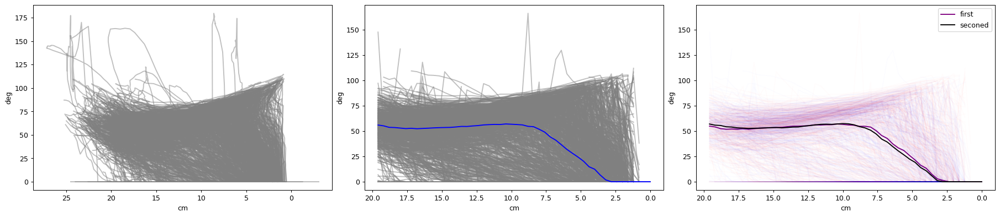

In [12]:
data = light_long
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>1).max()
    ax1.plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

(780, 50) (780, 50)
(445, 50) (445, 50)
(335, 50) (335, 50)


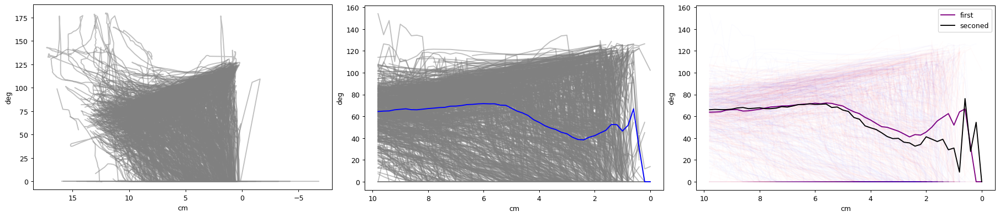

In [13]:
data = light_short
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>1).max()
    ax1.plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 10, .2)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 10, .2)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 10, .2)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

(869, 50) (869, 50)
(456, 50) (456, 50)
(413, 50) (413, 50)


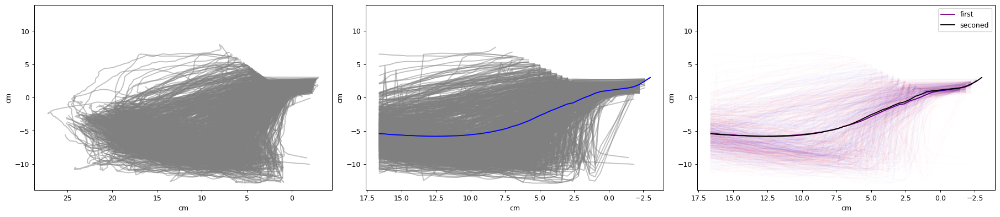

In [14]:
data = light_long
data = drop_nans_in_columns(data,'lateral_error')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('cm')
ax1.set_xlabel('cm')
ax2.set_ylabel('cm')
ax2.set_xlabel('cm')
ax3.set_ylabel('cm')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>-3).max()
    ax1.plot(row['distance_from_edge'][:length],row['lateral_error'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmean(distance_array_sec,axis = 0),np.nanmean(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()
symmetrize_y_axis(ax1)
symmetrize_y_axis(ax2)
symmetrize_y_axis(ax3)

(780, 50) (780, 50)
(445, 50) (445, 50)
(335, 50) (335, 50)


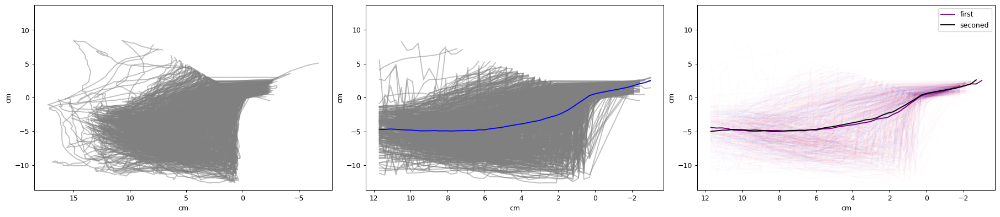

In [15]:
data = light_short
data = drop_nans_in_columns(data,'lateral_error')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('cm')
ax1.set_xlabel('cm')
ax2.set_ylabel('cm')
ax2.set_xlabel('cm')
ax3.set_ylabel('cm')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>-3).max()
    ax1.plot(row['distance_from_edge'][:length],row['lateral_error'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 12, .3)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 12, .3)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 12, .3)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmean(distance_array_sec,axis = 0),np.nanmean(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()
symmetrize_y_axis(ax1)
symmetrize_y_axis(ax2)
symmetrize_y_axis(ax3)

In [399]:
x =column_to_array('ts_nose_x_cm',light_long)
y = column_to_array('ts_nose_x_cm',light_long)
plt.hist2d(x, y, bins=(300, 300), cmap=plt.cm.jet)


ValueError: could not broadcast input array from shape (95,) into shape (91,)

In [402]:
x =flatten_column(dark_long,'ts_nose_x_cm')
y = flatten_column(dark_long,'ts_nose_y_cm')
bad_indices = np.isnan(x) | np.isnan(y)
good_indices = ~bad_indices
plt.hist2d(x[good_indices], y[good_indices], cmap=plt.cm.jet)

array([17.77024467, 17.45581384, 17.10409809, ..., 19.2149468 ,
       19.23110609, 19.28255673])

(array([[1.5800e+02, 8.8500e+02, 2.7920e+03, 2.3808e+04, 6.4780e+03,
         1.9250e+03, 7.4700e+02, 2.5800e+02, 0.0000e+00, 0.0000e+00],
        [6.2100e+02, 3.5320e+03, 4.3660e+03, 3.3800e+03, 4.0510e+03,
         3.9080e+03, 1.5570e+03, 3.7000e+02, 0.0000e+00, 0.0000e+00],
        [1.0720e+03, 5.3400e+03, 3.5060e+03, 2.1840e+03, 2.7510e+03,
         3.6700e+03, 3.2540e+03, 5.1500e+02, 0.0000e+00, 0.0000e+00],
        [1.2910e+03, 5.7040e+03, 3.2080e+03, 1.6700e+03, 2.0380e+03,
         2.8600e+03, 3.4850e+03, 9.0000e+02, 1.0000e+00, 0.0000e+00],
        [1.6700e+03, 5.6330e+03, 3.4320e+03, 2.1970e+03, 2.1420e+03,
         3.1680e+03, 4.0100e+03, 1.2570e+03, 1.6000e+01, 1.0000e+00],
        [1.5080e+03, 6.0430e+03, 3.2520e+03, 2.3230e+03, 2.3220e+03,
         2.9600e+03, 4.1430e+03, 1.2350e+03, 5.2000e+01, 1.0000e+00],
        [7.8800e+02, 4.9280e+03, 3.1060e+03, 1.9110e+03, 2.0300e+03,
         3.0860e+03, 4.2220e+03, 1.1870e+03, 1.0000e+00, 1.0000e+00],
        [6.1700e+02, 3.8670

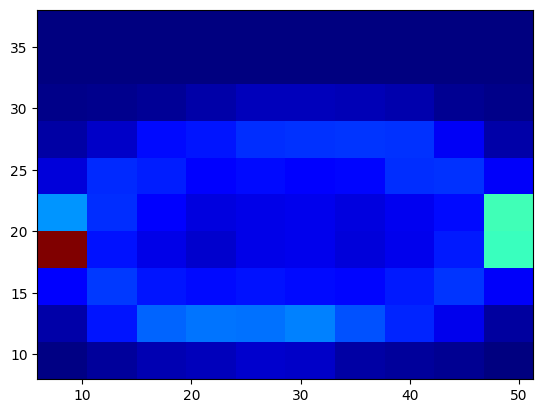

In [407]:
x =flatten_column(dark_df,'ts_nose_x_cm')
y = flatten_column(dark_df,'ts_nose_y_cm')
bad_indices = np.isnan(x) | np.isnan(y)
good_indices = ~bad_indices
plt.hist2d(x[good_indices], y[good_indices], cmap=plt.cm.jet)

(array([[8.0000e+00, 2.1000e+01, 3.4910e+03, 4.0668e+04, 3.8000e+02,
         1.0000e+01, 3.4000e+01, 1.7000e+01, 0.0000e+00, 0.0000e+00],
        [8.9000e+01, 3.4430e+03, 1.0839e+04, 1.2810e+04, 9.7760e+03,
         1.1070e+03, 1.6200e+02, 8.0000e+00, 0.0000e+00, 0.0000e+00],
        [2.6100e+02, 6.3350e+03, 8.3130e+03, 5.5270e+03, 1.2951e+04,
         3.5530e+03, 8.0000e+01, 1.0000e+00, 1.0000e+00, 1.0000e+00],
        [6.2400e+02, 5.8930e+03, 9.1590e+03, 5.1130e+03, 1.3361e+04,
         4.4280e+03, 3.2400e+02, 2.0000e+01, 1.7000e+01, 0.0000e+00],
        [1.4400e+03, 3.9760e+03, 1.2434e+04, 1.5691e+04, 1.2887e+04,
         3.5330e+03, 1.1600e+03, 2.8000e+01, 3.8000e+01, 1.0000e+00],
        [2.0140e+03, 6.0660e+03, 1.2826e+04, 1.0137e+04, 1.2832e+04,
         6.4120e+03, 1.9720e+03, 5.9000e+01, 4.0000e+00, 0.0000e+00],
        [6.7800e+02, 6.2190e+03, 1.1119e+04, 2.8820e+03, 9.1420e+03,
         7.1360e+03, 7.2600e+02, 7.4000e+01, 3.0000e+00, 3.0000e+00],
        [1.9500e+02, 4.8120

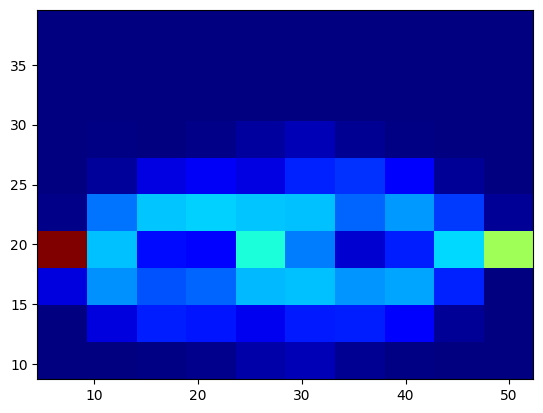

In [405]:
x =flatten_column(conditions_long,'ts_nose_x_cm')
y = flatten_column(conditions_long,'ts_nose_y_cm')
bad_indices = np.isnan(x) | np.isnan(y)
good_indices = ~bad_indices
plt.hist2d(x[good_indices], y[good_indices], cmap=plt.cm.jet)

(array([[0.000e+00, 0.000e+00, 3.700e+01, 6.990e+02, 4.024e+03, 3.071e+03,
         2.000e+01, 0.000e+00, 0.000e+00, 0.000e+00],
        [7.200e+01, 3.060e+02, 7.220e+02, 9.120e+02, 1.547e+03, 1.465e+03,
         9.810e+02, 3.250e+02, 1.000e+02, 2.400e+01],
        [2.440e+02, 5.300e+02, 1.104e+03, 1.111e+03, 7.660e+02, 1.254e+03,
         9.330e+02, 7.090e+02, 2.800e+02, 4.500e+01],
        [2.720e+02, 6.270e+02, 1.033e+03, 1.131e+03, 5.840e+02, 1.161e+03,
         1.051e+03, 6.990e+02, 4.610e+02, 7.300e+01],
        [3.000e+02, 6.190e+02, 9.240e+02, 1.971e+03, 1.603e+03, 1.622e+03,
         1.169e+03, 4.970e+02, 2.840e+02, 1.870e+02],
        [5.010e+02, 5.900e+02, 8.020e+02, 1.475e+03, 1.457e+03, 2.032e+03,
         1.614e+03, 7.990e+02, 3.890e+02, 1.580e+02],
        [3.030e+02, 6.470e+02, 9.020e+02, 1.421e+03, 5.920e+02, 9.840e+02,
         1.189e+03, 9.330e+02, 4.470e+02, 6.700e+01],
        [1.170e+02, 5.610e+02, 9.500e+02, 1.432e+03, 7.760e+02, 9.590e+02,
         1.207e+03, 7.

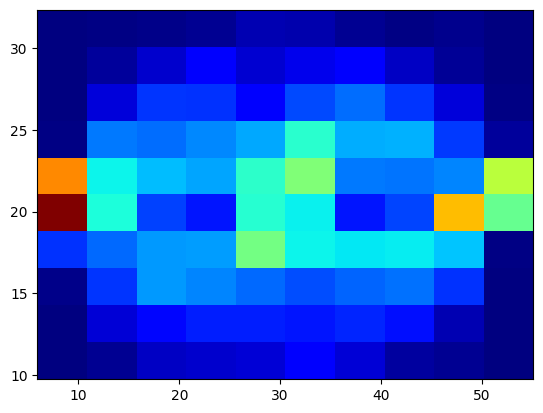

In [403]:
x =flatten_column(light_long,'ts_nose_x_cm')
y = flatten_column(light_long,'ts_nose_y_cm')
bad_indices = np.isnan(x) | np.isnan(y)
good_indices = ~bad_indices
plt.hist2d(x[good_indices], y[good_indices], cmap=plt.cm.jet)

(869, 50) (869, 50)
(456, 50) (456, 50)
(413, 50) (413, 50)


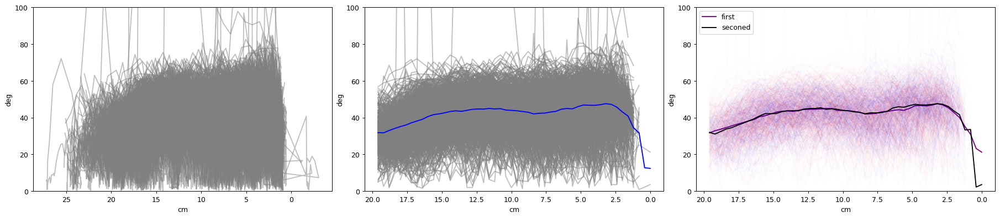

In [58]:
data = light_long
data = drop_nans_in_columns(data,'speed')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_ylim(0,100)
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_ylim(0,100)
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_ylim(0,100)
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>1).max()
    ax1.plot(row['distance_from_edge'][:length],row['speed'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['speed'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['speed'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['speed'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

(577, 50) (577, 50)
(327, 50) (327, 50)
(250, 50) (250, 50)


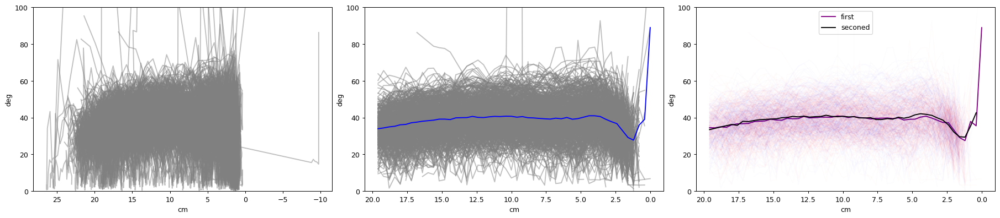

In [60]:
data = dark_long
data = drop_nans_in_columns(data,'speed')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_ylim(0,100)
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_ylim(0,100)
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_ylim(0,100)
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>1).max()
    ax1.plot(row['distance_from_edge'][:length],row['speed'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['speed'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['speed'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['speed'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

(5602, 50) (5602, 50)
(3103, 50) (3103, 50)
(2499, 50) (2499, 50)


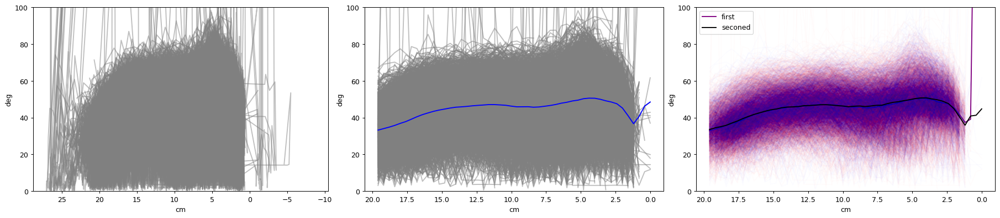

In [61]:
data = conditions_long
data = drop_nans_in_columns(data,'speed')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_ylim(0,100)
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_ylim(0,100)
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_ylim(0,100)
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>1).max()
    ax1.plot(row['distance_from_edge'][:length],row['speed'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['speed'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['speed'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['speed'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

In [16]:
dark_long,dark_short,dark_middle = create_df_by_type(dark_df)

(577, 50) (577, 50)
(327, 50) (327, 50)
(250, 50) (250, 50)


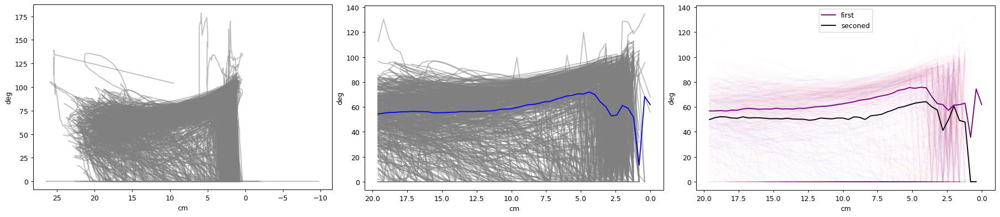

In [17]:
data = dark_long
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
#data = data.loc[data['len_distance_from_edge']<2]


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>1).max()
    ax1.plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

(487, 50) (487, 50)
(289, 50) (289, 50)
(198, 50) (198, 50)


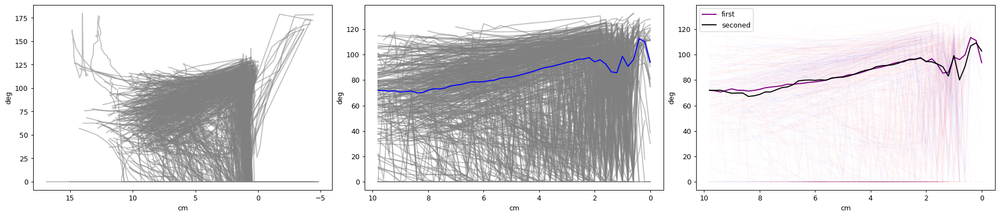

In [18]:
data = dark_short
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>1).max()
    ax1.plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 10, .2)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 10, .2)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 10, .2)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

(577, 50) (577, 50)
(327, 50) (327, 50)
(250, 50) (250, 50)


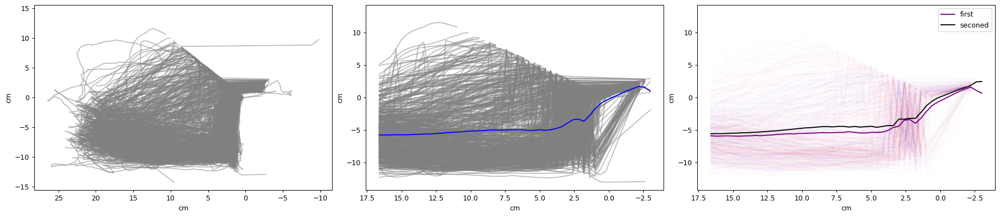

In [19]:
data = dark_long
data = drop_nans_in_columns(data,'lateral_error')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('cm')
ax1.set_xlabel('cm')
ax2.set_ylabel('cm')
ax2.set_xlabel('cm')
ax3.set_ylabel('cm')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>-3).max()
    ax1.plot(row['distance_from_edge'][:length],row['lateral_error'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmean(distance_array_sec,axis = 0),np.nanmean(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()
symmetrize_y_axis(ax1)
symmetrize_y_axis(ax2)
symmetrize_y_axis(ax3)

(487, 50) (487, 50)
(289, 50) (289, 50)
(198, 50) (198, 50)


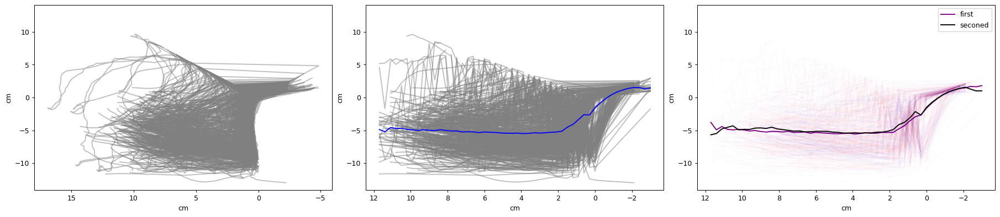

In [20]:
data = dark_short
data = drop_nans_in_columns(data,'lateral_error')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('cm')
ax1.set_xlabel('cm')
ax2.set_ylabel('cm')
ax2.set_xlabel('cm')
ax3.set_ylabel('cm')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>-3).max()
    ax1.plot(row['distance_from_edge'][:length],row['lateral_error'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 12, .3)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 12, .3)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 12, .3)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmean(distance_array_sec,axis = 0),np.nanmean(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()
symmetrize_y_axis(ax1)
symmetrize_y_axis(ax2)
symmetrize_y_axis(ax3)

In [21]:
conditions_long,conditions_short,conditions_middle = create_df_by_type(conditions_df)

In [14]:
conditions_long.task = 'oacon'
conditions_short.task = 'oacon'

(5600, 50) (5600, 50)
(3101, 50) (3101, 50)
(2499, 50) (2499, 50)


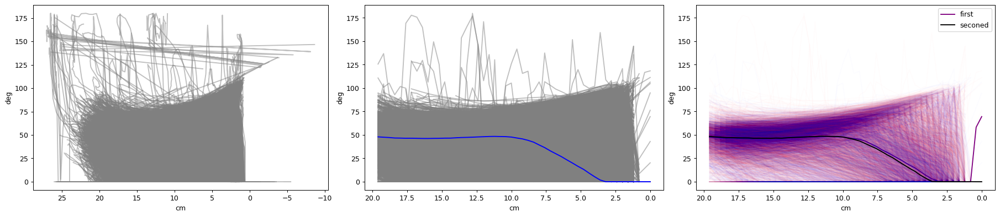

In [23]:
data = conditions_long
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
#data = data.loc[data['len_distance_from_edge']<200]


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>1).max()
    ax1.plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

(5430, 50) (5430, 50)
(2998, 50) (2998, 50)
(2432, 50) (2432, 50)


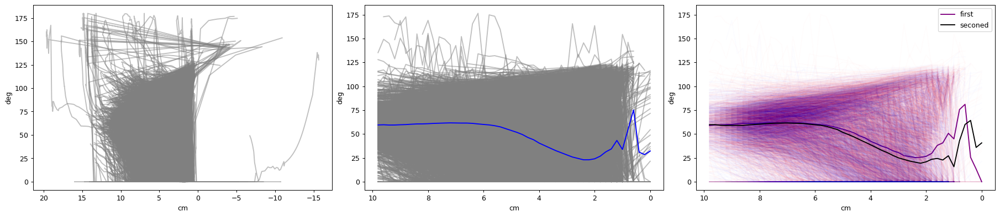

In [24]:
data = conditions_short
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>1).max()
    ax1.plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 10, .2)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 10, .2)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 10, .2)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

(5602, 50) (5602, 50)
(3103, 50) (3103, 50)
(2499, 50) (2499, 50)


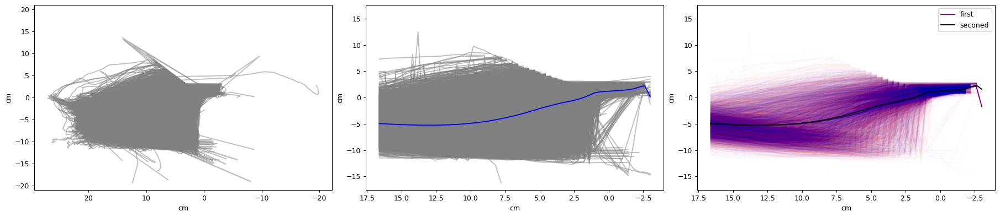

In [25]:
data = conditions_long
data = drop_nans_in_columns(data,'lateral_error')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('cm')
ax1.set_xlabel('cm')
ax2.set_ylabel('cm')
ax2.set_xlabel('cm')
ax3.set_ylabel('cm')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>-3).max()
    ax1.plot(row['distance_from_edge'][:length],row['lateral_error'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmean(distance_array_sec,axis = 0),np.nanmean(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()
symmetrize_y_axis(ax1)
symmetrize_y_axis(ax2)
symmetrize_y_axis(ax3)

(5430, 50) (5430, 50)
(2998, 50) (2998, 50)
(2432, 50) (2432, 50)


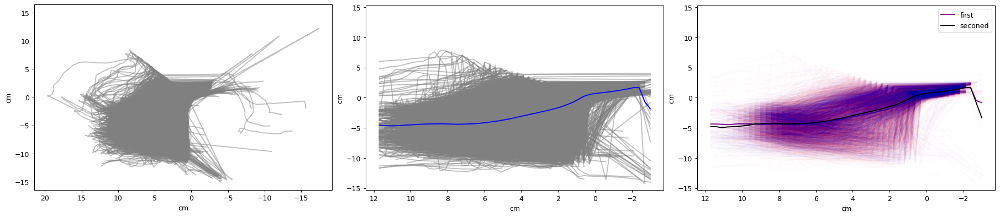

In [26]:
data = conditions_short
data = drop_nans_in_columns(data,'lateral_error')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('cm')
ax1.set_xlabel('cm')
ax2.set_ylabel('cm')
ax2.set_xlabel('cm')
ax3.set_ylabel('cm')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_edge']>-3).max()
    ax1.plot(row['distance_from_edge'][:length],row['lateral_error'][:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 12, .3)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 12, .3)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 12, .3)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmean(distance_array_sec,axis = 0),np.nanmean(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()
symmetrize_y_axis(ax1)
symmetrize_y_axis(ax2)
symmetrize_y_axis(ax3)

(869, 50) (869, 50)


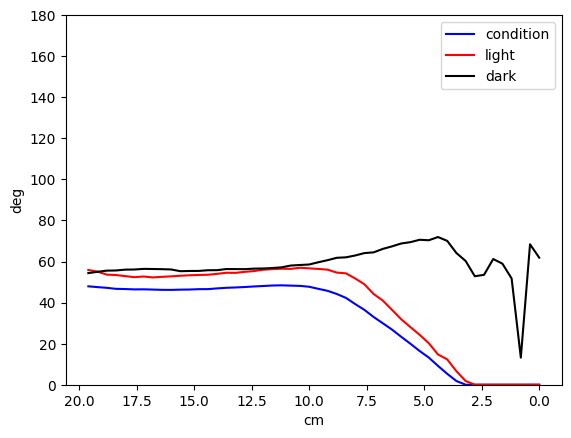

In [27]:
condition = conditions_long
light = light_long
dark = dark_long

condition = drop_nans_in_columns(condition,'zero_out_angle_to_corner')
light = drop_nans_in_columns(light,'zero_out_angle_to_corner')
dark = drop_nans_in_columns(dark,'zero_out_angle_to_corner')
#data = data.loc[data['len_distance_from_edge']<200]


#fig = plt.figure(constrained_layout=False, figsize=(5, 8),dpi=90)
#spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
#panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
#panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
#panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])
fig,ax = plt.subplots()


ax.set_ylabel('deg')
ax.set_xlabel('cm')
ax.invert_xaxis()
ax.set_ylim(0,180)

rows = condition.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(condition.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
ax.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue',label = 'condition' )
    


rows = light.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(light.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
ax.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'red',label = 'light' )


rows = light.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(dark.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
ax.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'black',label = 'dark' )
   
   

print(distance_array.shape,angle_array.shape)

ax.legend()


(869, 50) (869, 50)


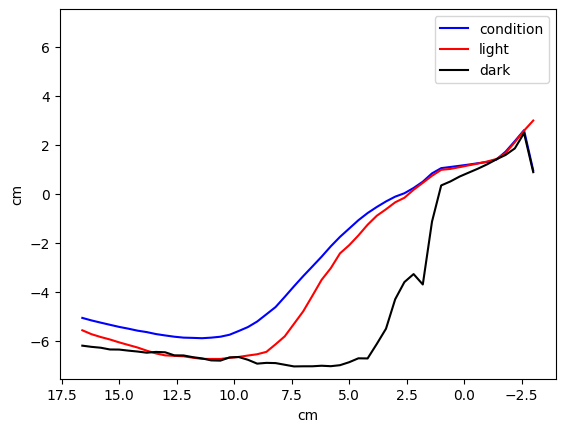

In [28]:
condition = conditions_long
light = light_long
dark = dark_long

condition = drop_nans_in_columns(condition,'lateral_error')
light = drop_nans_in_columns(light,'lateral_error')
dark = drop_nans_in_columns(dark,'lateral_error')
#data = data.loc[data['len_distance_from_edge']<200]


#fig = plt.figure(constrained_layout=False, figsize=(5, 8),dpi=90)
#spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
#panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
#panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
#panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])
fig,ax = plt.subplots()


ax.set_ylabel('cm')
ax.set_xlabel('cm')
ax.invert_xaxis()
#ax.set_ylim(0,180)

rows = condition.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(condition.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
ax.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue',label = 'condition' )
    


rows = light.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(light.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
ax.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'red',label = 'light' )


rows = light.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(dark.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(-3, 17, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
ax.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'black',label = 'dark' )
   
   

print(distance_array.shape,angle_array.shape)

ax.legend()
symmetrize_y_axis(ax)


In [29]:
def plot_mean_by_condition(df,condition):
        #savepath = "D:/obstacle_avoidance/recordings"
        #savepath_session = os.path.join(*[savepath,'figures'])
        ##savepath_session = os.path.join(*[savepath,str(pd.unique(df.date).item()),str(pd.unique(df.animal).item()),str(pd.unique(df.task).item())])
        #pdf = PdfPages(os.path.join((savepath_session), str(date)+ 'by_' +'_start_'+'obstacle' + 'consecutive.pdf'))
        key='start'
        fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
        fig.suptitle('by ' + df[condition].unique() + ' '+ 'and ' +'obstacle ')
        spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)


        """Right"""
        panel_1 = gridspec.GridSpecFromSubplotSpec(2,2,subplot_spec=spec2[0])
        ax1 = fig.add_subplot(panel_1[0,0])
        plot_arena(df,ax1)
        ax2 = fig.add_subplot(panel_1[0,1])
        plot_arena(df,ax2)
        ax2.set_title('right')
        ax3 = fig.add_subplot(panel_1[1,0])
        plot_arena(df,ax3)
        ax4 = fig.add_subplot(panel_1[1,1])
        plot_arena(df,ax4)
       

        right_axs = [ax1,ax2,ax3,ax4]


        """Left """
        panel_2 = gridspec.GridSpecFromSubplotSpec(2,2,subplot_spec=spec2[1])
        ax7 = fig.add_subplot(panel_2[0,0])
        plot_arena(df,ax7)
        ax8 = fig.add_subplot(panel_2[0,1])
        plot_arena(df,ax8)
        ax8.set_title('left')
        ax9 = fig.add_subplot(panel_2[1,0])
        plot_arena(df,ax9)
        ax10 = fig.add_subplot(panel_2[1,1])
        plot_arena(df,ax10)


        left_axs = [ax7,ax8,ax9,ax10]




        """ plot trials"""
        right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
        left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

        for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                #cluster_frame = cluster_frame.sample(num_sample)
                right_obstacle_axis = right_obstacle_dict.get(cluster)
                left_obstacle_axis = left_obstacle_dict.get(cluster)
                plot_obstacle(cluster_frame,right_obstacle_axis,cluster)
                plot_obstacle(cluster_frame,left_obstacle_axis,cluster)
                right_obstacle_axis.set_title(str(cluster))
                left_obstacle_axis.set_title(str(cluster))

                for start, start_frame in cluster_frame.groupby(['start']):

                    if direction == 'right':
                        if start == 'top':
                            if cluster in [2,3]:
                                right_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                                right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)

                            else:
                                right_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '.'].to_numpy()[0],c = 'black')
                                right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                        if start == 'bottom':
                            if cluster in [2,3]:
                                right_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                                right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)
                            else:
                                right_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                                right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)


                    if direction == 'left':
                        if start == 'top':
                             if cluster in [2,3]:
                                left_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                                left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                             else:
                                left_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                                left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                        if start == 'bottom':
                            if cluster in [2,3]:
                                left_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                                left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)

                            else:
                                left_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                                left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)

        

In [102]:
axis.plot([np.mean(arena_x[0:3]),np.mean(arena_x[3:6]),np.mean(arena_x[6:9]),np.mean(arena_x[9:12]),np.mean(arena_x[0:3])],
                              [np.mean(arena_y[0:3]),np.mean(arena_y[3:6]),np.mean(arena_y[6:9]),np.mean(arena_y[9:12]),np.mean(arena_y[0:3])],c='k')

array([<AxesSubplot: >, <AxesSubplot: >], dtype=object)

In [102]:
def plot_arena2(df,axis,obstacle = False):
    df =df.copy(deep=True)
    arena_x = pd.unique(df[['arenaTL_x_cm',
    'arenaTR_x_cm','arenaBR_x_cm',
    'arenaBL_x_cm',
    'arenaTL_x_cm']].values.ravel('K'))

    arena_y = pd.unique(df[['arenaTL_y_cm',
    'arenaTR_y_cm','arenaBR_y_cm',
    'arenaBL_y_cm',
    'arenaTL_y_cm']].values.ravel('K'))

    

    left_port =  pd.unique(df[['leftportT_x_cm','leftportT_y_cm']].values.ravel('K'))

    right_port = pd.unique(df[['rightportT_x_cm','rightportT_y_cm']].values.ravel('K'))

    
    
    axis.plot([np.mean(arena_x[0:3]),np.mean(arena_x[3:6]),np.mean(arena_x[6:9]),np.mean(arena_x[9:12]),np.mean(arena_x[0:3])],
                              [np.mean(arena_y[0:3]),np.mean(arena_y[3:6]),np.mean(arena_y[6:9]),np.mean(arena_y[9:12]),np.mean(arena_y[0:3])],c='k')

    axis.scatter(left_port[0],left_port[1],c='purple',s=200,marker = 's')
    axis.vlines(ymax=arena_y[0],ymin=arena_y[2],x=left_port[0],colors='k')
    axis.scatter(right_port[0],right_port[1],c='r',s=200,marker = 's')
    axis.vlines(ymax=arena_y[0],ymin=arena_y[2],x=right_port[0],colors='k')

    if obstacle == True:
        obstacle_x = pd.unique(df[['mean_gt_obstacleTL_x_cm',
        'mean_gt_obstacleTR_x_cm','mean_gt_obstacleBR_x_cm',
        'mean_gt_obstacleBL_x_cm',
        'mean_gt_obstacleTL_x_cm']].values.ravel('K'))

        obstacle_y =  pd.unique(df[['mean_gt_obstacleTL_y_cm',
        'mean_gt_obstacleTR_y_cm','mean_gt_obstacleBR_y_cm',
        'mean_gt_obstacleBL_y_cm',
        'mean_gt_obstacleTL_y_cm']].values.ravel('K'))

        axis.plot([np.mean(obstacle_x[0:3]),np.mean(obstacle_x[3:6]),np.mean(obstacle_x[6:9]),np.mean(obstacle_x[9:12]),np.mean(obstacle_x[0:3])],
                              [np.mean(obstacle_y[0:3]),np.mean(obstacle_y[3:6]),np.mean(obstacle_y[6:9]),np.mean(obstacle_y[9:12]),np.mean(obstacle_y[0:3])],c='k')

    
    axis.set_ylim([51,0]); axis.set_xlim([0, 61])

In [97]:
arena_x = pd.unique(data[['arenaTL_x_cm',
    'arenaTR_x_cm','arenaBR_x_cm',
    'arenaBL_x_cm',
    'arenaTL_x_cm']].values.ravel('K'))

In [104]:
  obstacle_x = pd.unique(data[['mean_gt_obstacleTL_x_cm',
        'mean_gt_obstacleTR_x_cm','mean_gt_obstacleBR_x_cm',
        'mean_gt_obstacleBL_x_cm',
        'mean_gt_obstacleTL_x_cm']].values.ravel('K'))

In [106]:
obstacle_x.size

48

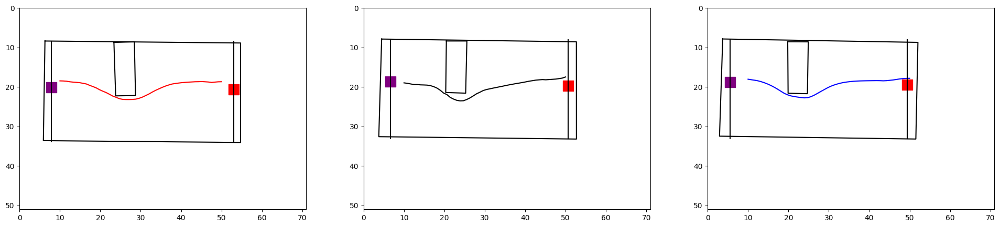

In [116]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
fig,axs = plt.subplots(nrows=1,ncols=2, figsize =(15,5))
cluster = 0 
plot_arena2(data,axs[0])
plot_obstacle(data,axs[0],0)
for task,task_frame in data.groupby(['task']):
    for start,start_frame in task_frame.groupby(['start']):
        for direction, direction_frame in start_frame.groupby(['odd']):
            for cluster,cluster_frame in task_frame.groupby(['obstacle_cluster']): 
                if cluster == 0 and direction =='right' and start =='top':
                    if task == 'oa':
                        axs[0].plot(np.linspace(10,50,50),cluster_frame.mean_interp_ts_nose_y_cm.to_numpy().mean(),c = 'red')

                    if task =='oadark':
                        axs[0].plot(np.linspace(10,50,50),cluster_frame.mean_interp_ts_nose_y_cm.to_numpy().mean(),c = 'black')
                    if task =='oacon':
                        axs[0].plot(np.linspace(10,50,50),cluster_frame.mean_interp_ts_nose_y_cm.to_numpy().mean(),c = 'blue')


                    






In [101]:
cluster_frame.mean_interp_ts_nose_y_cm.to_numpy().mean()

array([21.213439771951812, 21.140704047587054, 21.054898587613476,
       20.981815164962796, 20.988931797928668, 20.84748279214925,
       20.772171181581758, 20.699691048857115, 20.61265572818636,
       20.45849739227233, 20.342231548801646, 20.20409244275361,
       20.07615645811601, 19.9672372577111, 19.87482278521397,
       19.76958625462086, 19.69178513101762, 19.555706694716992,
       19.46351962899119, 19.32803179233647, 19.203943739347995,
       19.090985262401393, 18.768177304294326, 18.186199663350934,
       17.58671382514047, 16.869981289395053, 16.230182021430736,
       15.958388484449669, 15.827449333355863, 15.841066704051574,
       16.09549908466511, 16.508569114702734, 17.116378438489296,
       17.80492740822647, 18.486645436351363, 19.300005428168497,
       19.851526133669665, 20.193975405425395, 20.402029730787024,
       20.48438284734509, 20.528734619552754, 20.530488648741702,
       20.499323643593698, 20.40790091222806, 20.56838766406517,
       20.723

In [84]:
data.obstacle_cluster.unique()

array([0, 1, 4, 5])

In [85]:
data

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance,wall,obstacle
79,92,98,53453.015334,53455.325708,"[53453.019366, 53453.035571, 53453.052249, 534...","[14946, 14947, 14948, 14949, 14950, 14951, 149...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[120.34952545166016, 118.76129150390625, 120.6...","[269.4154968261719, 268.2513122558594, 268.599...",...,"[39.53302569387492, 36.85989082836577, 37.4933...",1.477578,0.676783,"[-4.946920532276835, -5.108858988639362, -5.34...",1.0,"[28.43153549919121, 34.899719059536665, 33.809...","[0.6192095346329509, 0.7560570393663149, 0.681...",59.570662,NaN,NaN
81,94,100,53457.980147,53460.302745,"[53457.987302, 53458.004339, 53458.020595, 534...","[15244, 15245, 15246, 15247, 15248, 15249, 152...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[120.83670043945312, 120.94226837158203, 120.4...","[270.7597961425781, 270.639404296875, 272.6239...",...,"[30.0744634949162, 33.75522611913555, 34.82440...",1.264326,0.790935,"[-4.484230733708603, -4.941532115060706, -5.11...",2.0,"[34.63526494924756, 31.387389301049023, 25.406...","[0.7765819226482762, 0.6661756748636307, 0.459...",55.984679,NaN,NaN
183,88,94,52900.738252,52904.244723,"[52900.741888, 52900.757132, 52900.773977, 529...","[18249, 18250, 18251, 18252, 18253, 18254, 182...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[120.9534683227539, 121.38233184814453, 121.55...","[271.7171325683594, 271.6559143066406, 271.190...",...,"[34.55911814410724, 33.0322619527986, 36.76266...",1.523894,0.656214,"[-4.471997313183554, -4.430982688392323, -4.78...",1.0,"[11.376091426075302, 21.22853135899233, 11.061...","[0.22357812464973037, 0.43204911088813347, 0.2...",61.624623,NaN,NaN
204,111,124,53052.909158,53057.099852,"[53052.909747, 53052.926451, 53052.943347, 530...","[27376, 27377, 27378, 27379, 27380, 27381, 273...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[127.58499145507812, 126.74820709228516, 124.8...","[272.00225830078125, 271.7303771972656, 270.72...",...,"[42.48781338327268, 41.88161081492232, 41.3352...",1.855414,0.538963,"[-4.629992338903939, -4.742664238661067, -4.86...",1.0,"[10.593584926939613, 8.622671759441907, 12.043...","[0.25505931869476584, 0.18695766390279367, 0.2...",65.369233,NaN,NaN
231,27,30,53940.619635,53943.278118,"[53940.619712, 53940.636313, 53940.653094, 539...","[5888, 5889, 5890, 5891, 5892, 5893, 5894, 589...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[121.61444854736328, 120.86456298828125, 120.6...","[275.3426208496094, 274.9679870605469, 274.888...",...,"[43.390278028011565, 40.917910134291944, 40.70...",1.163346,0.859589,"[-4.442282475297812, -4.507430500986914, -4.78...",1.0,"[18.852317496130727, 30.093345234796843, 33.97...","[0.3683099474955789, 0.6955419692411322, 0.756...",54.070209,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31469,119,136,42211.989235,42213.742604,"[42211.989376, 42212.005849, 42212.024588, 422...","[20425, 20426, 20427, 20428, 20429, 20430, 204...","[82.2231216430664, 80.60994720458984, 79.09525...","[252.2783203125, 253.27371215820312, 254.40551...","[98.04216003417969, 96.56690979003906, 94.9938...","[251.42543029785156, 251.54502868652344, 251.8...",...,"[51.95072907657566, 49.26509324092403, 46.1293...",1.031369,0.969585,"[-2.7455434692629694, -2.967762434027904, -3.0...",2.0,"[29.679001815550524, 30.277796867982808, 31.76...","[0.6823193998884403, 0.5757848761845263, 0.681...",53.088046,black,noise
31481,134,152,42254.324953,42257.180108,"[42254.337011, 42254.353881, 422

In [70]:
distance_array[i-1]

array([ 0. ,  0.4,  0.8,  1.2,  1.6,  2. ,  2.4,  2.8,  3.2,  3.6,  4. ,
        4.4,  4.8,  5.2,  5.6,  6. ,  6.4,  6.8,  7.2,  7.6,  8. ,  8.4,
        8.8,  9.2,  9.6, 10. , 10.4, 10.8, 11.2, 11.6, 12. , 12.4, 12.8,
       13.2, 13.6, 14. , 14.4, 14.8, 15.2, 15.6, 16. , 16.4, 16.8, 17.2,
       17.6, 18. , 18.4, 18.8, 19.2, 19.6])

In [49]:
row['zero_out_angle_to_corner']

nan

In [48]:
row['zero_out_angle_to_corner'][:length]

TypeError: 'float' object is not subscriptable

In [47]:
row['distance_from_edge'][:length]

array([12.809091830460382, 13.60112033190866, 13.903614807969397,
       14.455319643317914, 15.113340415726412, 15.600957438350193,
       16.25339164571274, 16.791950032025703, 17.517820537976164,
       18.063339604124607, 18.65631744139729, 19.18461276708551,
       19.74023270326058, 20.136450818555957, 20.611353900405803,
       21.06926751710381, 21.650774874854726, 22.04489352296347,
       22.44685138331412, 22.854571515192, 23.1266192117523,
       23.299248576966612, 23.49113807570629, 23.686667852314613,
       23.799205600929803, 23.901119865368898, 23.992924249192583,
       24.09158569108073, 24.27104057729877, 24.39904049626695,
       24.508654308821804, 24.527035909940743, 24.48492041796529,
       24.507072950490247, 24.54515169869056, 24.58778529952108,
       24.621426332745372], dtype=object)

In [29]:
conditions_long.task

1        oacon
13       oacon
30       oacon
32       oacon
51       oacon
         ...  
31469    oacon
31481    oacon
31483    oacon
31496    oacon
31498    oacon
Name: task, Length: 5602, dtype: object

In [90]:
data.total_distance


49      67.440471
53      78.924016
54      69.892258
102     79.242225
104     62.731677
          ...    
3818    50.478165
3860    47.347641
3942    47.394824
3950    47.151401
3973    60.723135
Name: total_distance, Length: 1446, dtype: float64

<AxesSubplot: xlabel='total_distance', ylabel='Density'>

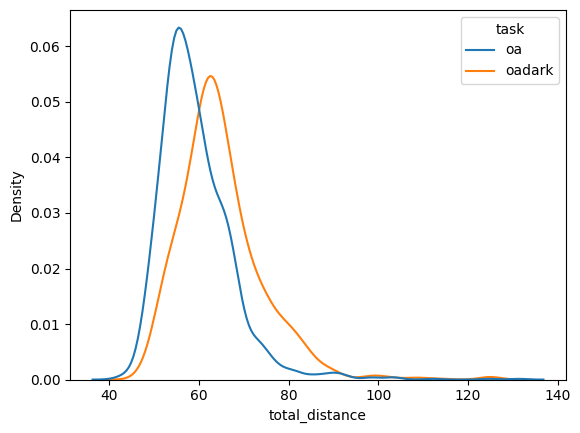

In [20]:
data = pd.concat([light_short,dark_short,dark_long,light_long])
data = drop_nans_in_columns(data,'total_distance')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.total_distance, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='total_distance', ylabel='Density'>

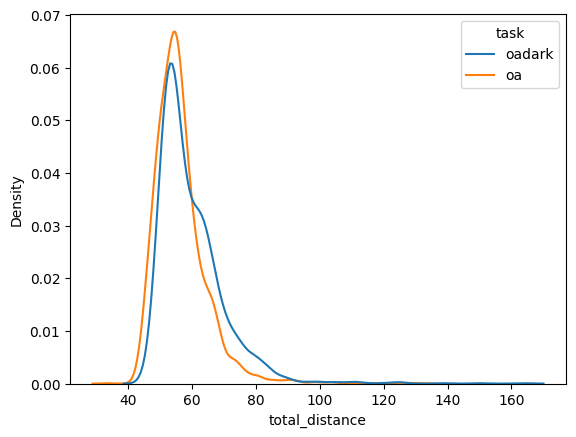

In [17]:
data = pd.concat([dark_df,light_df])
data = drop_nans_in_columns(data,'total_distance')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.total_distance, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='total_distance', ylabel='Density'>

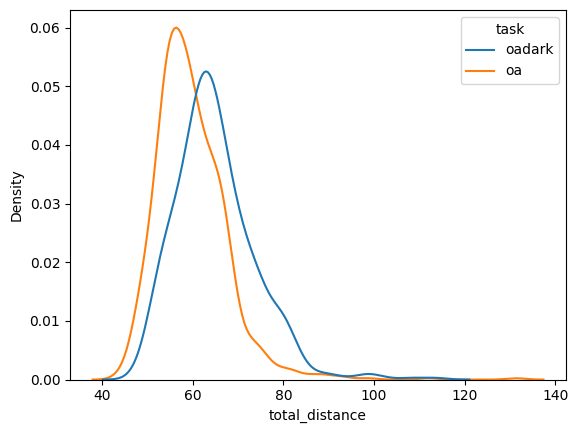

In [15]:
data = pd.concat([dark_long,light_long])
data = drop_nans_in_columns(data,'total_distance')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.total_distance, data=data,ax = ax,common_norm=False)

In [33]:
light_short

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance
79,92,98,53453.015334,53455.325708,"[53453.019366, 53453.035571, 53453.052249, 534...","[14946, 14947, 14948, 14949, 14950, 14951, 149...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[120.34952545166016, 118.76129150390625, 120.6...","[269.4154968261719, 268.2513122558594, 268.599...",...,"[39.53302569387492, 36.85989082836577, 37.4933...","[61.468257732159636, 60.20430413224751, 62.714...","[39.53302569387492, 36.85989082836577, 37.4933...",1.477578,0.676783,"[-4.946920532276835, -5.108858988639362, -5.34...",1.0,"[28.43153549919121, 34.899719059536665, 33.809...","[0.6192095346329509, 0.7560570393663149, 0.681...",59.570662
81,94,100,53457.980147,53460.302745,"[53457.987302, 53458.004339, 53458.020595, 534...","[15244, 15245, 15246, 15247, 15248, 15249, 152...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[120.83670043945312, 120.94226837158203, 120.4...","[270.7597961425781, 270.639404296875, 272.6239...",...,"[30.0744634949162, 33.75522611913555, 34.82440...","[51.622692856218656, 57.420629970696645, 60.19...","[30.0744634949162, 33.75522611913555, 34.82440...",1.264326,0.790935,"[-4.484230733708603, -4.941532115060706, -5.11...",2.0,"[34.63526494924756, 31.387389301049023, 25.406...","[0.7765819226482762, 0.6661756748636307, 0.459...",55.984679
183,88,94,52900.738252,52904.244723,"[52900.741888, 52900.757132, 52900.773977, 529...","[18249, 18250, 18251, 18252, 18253, 18254, 182...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[120.9534683227539, 121.38233184814453, 121.55...","[271.7171325683594, 271.6559143066406, 271.190...",...,"[34.55911814410724, 33.0322619527986, 36.76266...","[56.176988731335854, 54.888674205539864, 59.92...","[34.55911814410724, 33.0322619527986, 36.76266...",1.523894,0.656214,"[-4.471997313183554, -4.430982688392323, -4.78...",1.0,"[11.376091426075302, 21.22853135899233, 11.061...","[0.22357812464973037, 0.43204911088813347, 0.2...",61.624623
204,111,124,53052.909158,53057.099852,"[53052.909747, 53052.926451, 53052.943347, 530...","[27376, 27377, 27378, 27379, 27380, 27381, 273...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[127.58499145507812, 126.74820709228516, 124.8...","[272.00225830078125, 271.7303771972656, 270.72...",...,"[42.48781338327268, 41.88161081492232, 41.3352...","[63.23827191530736, 63.242766306675726, 63.192...","[42.48781338327268, 41.88161081492232, 41.3352...",1.855414,0.538963,"[-4.629992338903939, -4.742664238661067, -4.86...",1.0,"[10.593584926939613, 8.622671759441907, 12.043...","[0.25505931869476584, 0.18695766390279367, 0.2...",65.369233
231,27,30,53940.619635,53943.278118,"[53940.619712, 53940.636313, 53940.653094, 539...","[5888, 5889, 5890, 5891, 5892, 5893, 5894, 589...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[121.61444854736328, 120.86456298828125, 120.6...","[275.3426208496094, 274.9679870605469, 274.888...",...,"[43.390278028011565, 40.917910134291944, 40.70...","[61.22362758284546, 59.4013296682191, 60.66474...","[43.390278028011565, 40.917910134291944, 40.70...",1.163346,0.859589,"[-4.442282475297812, -4.507430500986914, -4.78...",1.0,"[18.852317496130727, 30.093345234796843, 33.97...","[0.3683099474955789, 0.6955419692411322, 0.756...",54.070209
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,30,38,57119.009702,57121.238054,"[57119.017075, 57119.033753, 57119.051264, 571...","[[8320, 8321, 8322, 8323, 8324, 8325, 8326, 83...","[672.6401977539062, 674.563

In [32]:
conditions_long

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,distance_from_edge,len_distance_from_edge,angle_to_corner,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive
1,1,1,45287.166080,45289.095539,"[45287.173977, 45287.191155, 45287.207692, 452...","[[180, 181, 182, 183, 184, 185, 186, 187, 188,...","[659.1345825195312, 659.9591064453125, 658.926...","[262.79779052734375, 262.86639404296875, 262.2...","[640.8193359375, 642.065185546875, 641.9094848...","[259.280517578125, 258.0514221191406, 258.0626...",...,"[19.62402665325002, 19.237617224431276, 18.826...",72.0,"[34.75772067812996, 34.471556909211415, 34.888...","[25.188468226667293, 24.49982378001088, 24.453...","[34.75772067812996, 34.471556909211415, 34.888...","[25.188468226667293, 24.49982378001088, 24.453...",1.063088,0.940656,"[-3.6397835437390853, -3.793345578511641, -3.9...",1.0
13,16,19,45329.628812,45331.279616,"[45329.63872, 45329.655552, 45329.672179, 4532...","[[2727, 2728, 2729, 2730, 2731, 2732, 2733, 27...","[662.4247436523438, 662.3223876953125, 662.512...","[268.860595703125, 267.6027526855469, 266.1972...","[647.87255859375, 648.4732055664062, 648.97534...","[259.42236328125, 258.2563171386719, 256.81088...",...,"[18.931960107145095, 18.432957048638286, 17.86...",58.0,"[42.1720723938598, 40.94588939404536, 41.00506...","[30.8321920145616, 29.116613336235638, 28.4069...","[42.1720723938598, 40.94588939404536, 41.00506...","[30.8321920145616, 29.116613336235638, 28.4069...",1.125695,0.888340,"[-4.6138236439678195, -4.733147074678449, -4.9...",2.0
30,36,39,45373.836518,45375.630643,"[45373.837363, 45373.8539, 45373.870758, 45373...","[[5378, 5379, 5380, 5381, 5382, 5383, 5384, 53...","[658.9888916015625, 659.8367919921875, 660.936...","[262.6311340332031, 262.8354187011719, 262.632...","[643.4417114257812, 645.067626953125, 646.9371...","[251.00555419921875, 250.87335205078125, 250.5...",...,"[19.49089223263421, 18.964849026662968, 18.368...",64.0,"[58.96891529386729, 58.82554546051629, 57.5485...","[45.99380142925885, 45.01354949356713, 43.0121...","[58.96891529386729, 58.82554546051629, 57.5485...","[45.99380142925885, 45.01354949356713, 43.0121...",1.281407,0.780392,"[-6.245407768603636, -6.619223968586478, -6.81...",1.0
32,38,41,45378.760268,45380.583091,"[45378.772224, 45378.789875, 45378.805862, 453...","[[5674, 5675, 5676, 5677, 5678, 5679, 5680, 56...","[660.15234375, 661.2433471679688, 661.91552734...","[263.1383361816406, 264.3952941894531, 263.993...","[645.3707885742188, 647.1256103515625, 649.435...","[252.9916229248047, 253.55458068847656, 254.19...",...,"[19.31562228202028, 18.76875355734986, 18.1463...",70.0,"[54.45137137678954, 54.09520986396818, 52.7914...","[41.725054167314354, 40.65793533555561, 38.634...","[54.45137137678954, 54.09520986396818, 52.7914...","[41.725054167314354, 40.65793533555561, 38.634...",1.440085,0.694403,"[-5.920892356523922, -6.171739380815014, -6.34...",2.0
51,60,63,45427.887513,45429.657356,"[45427.889011, 45427.905907, 45427.923353, 454...","[[8620, 8621, 8622, 8623, 8624, 8625, 8626, 86...","[660.4502563476562, 660.454833984375, 661.3882...","[265.1165466308594, 264.84393310546875, 264.86...","[643.5790405273438, 644.8306274414062, 646.271...","[257.3697509765625, 256.9438171386719, 256.507...",...,"[19.280455004602977, 18.75148589931036, 18.202...",67.0,"[53.40330957549935, 52.02537974182631, 50.4483...","[39.481008643561324, 37.515822314135804, 35.36...","[53.40330957549935, 52.02537974182631, 50.4483...","[39.481008643561324, 37.515822314135804, 35.36...",1.308089,0.764474,"[-6.124790951230548, -6.269213620833529, -6.36...",1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31469,119,136,42211.989235,42213.742604,"[42211.989376, 42212.005849, 42212.024588, 422...","[20425, 20426, 20427, 20428, 20429, 20430, 204...","[82.2231216430664, 80.60994720

<AxesSubplot: xlabel='total_distance', ylabel='Density'>

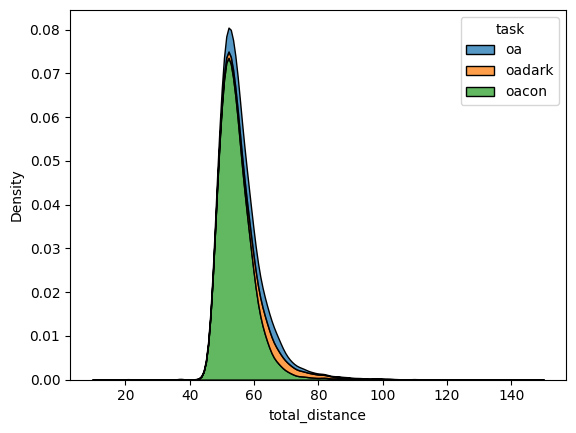

In [26]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'total_distance')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.total_distance, data=data,ax = ax,common_norm=True, clip=(0,150),multiple='stack')

<AxesSubplot: xlabel='time', ylabel='Density'>

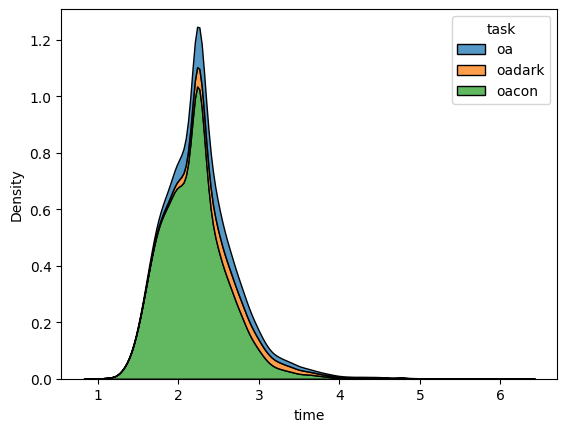

In [27]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'time')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.time, data=data,ax = ax,common_norm=True, clip=(0,150),multiple='stack')

<AxesSubplot: xlabel='tortuosity', ylabel='Density'>

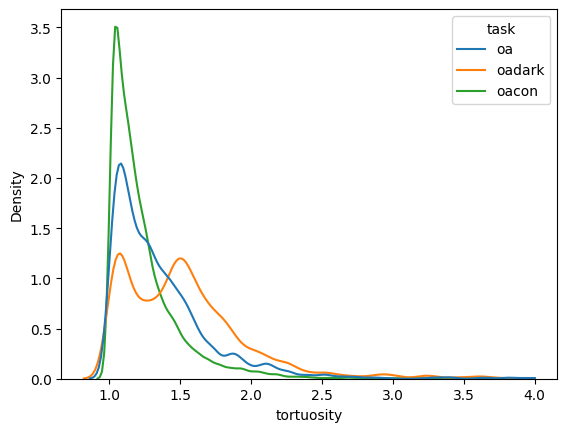

In [44]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'tortuosity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.tortuosity, data=data,ax = ax,common_norm=False, clip=(0,4), bw_adjust=.5)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

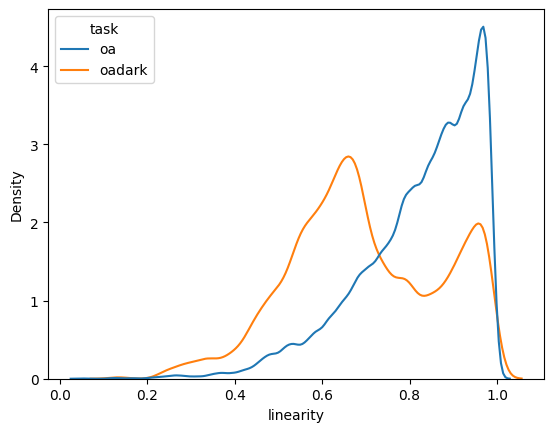

In [13]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.linearity, data=data,ax = ax,common_norm=False, clip=(0,4), bw_adjust=.5)

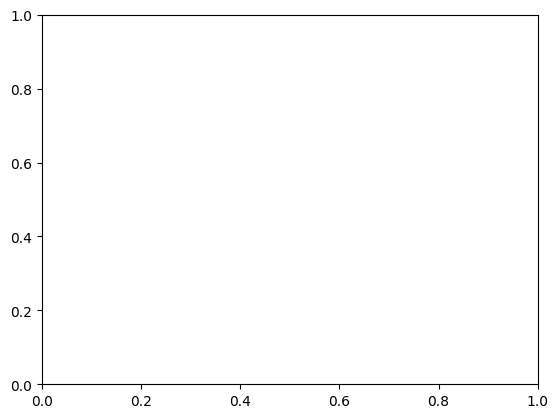

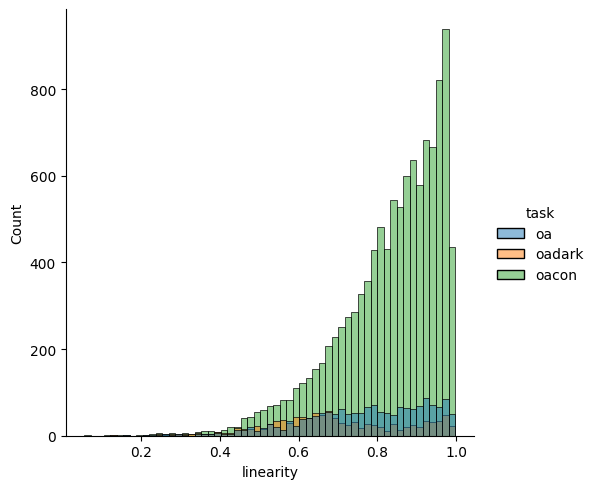

In [40]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.displot(hue=data.task, x=data.linearity, data=data,ax = ax,common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

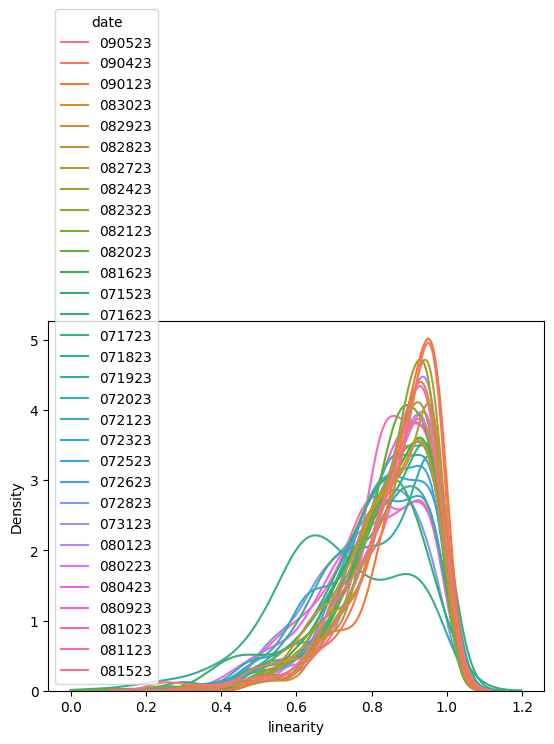

In [37]:
data = pd.concat([conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.date, x=data.linearity, data=data,ax = ax,common_norm=False, clip=(0,4))

<AxesSubplot: xlabel='linearity', ylabel='Density'>

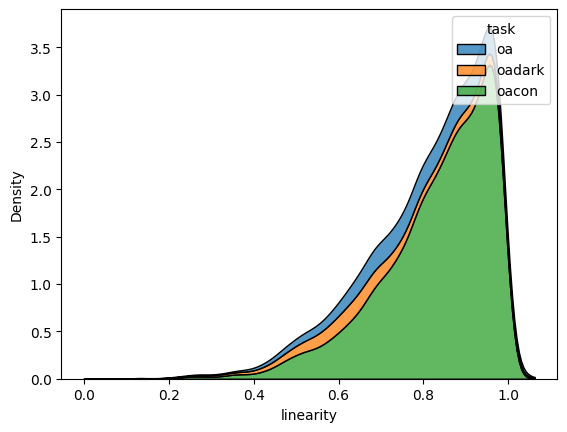

In [29]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.linearity, data=data,ax = ax,common_norm=True, clip=(0,4),multiple='stack')

<AxesSubplot: xlabel='time', ylabel='Density'>

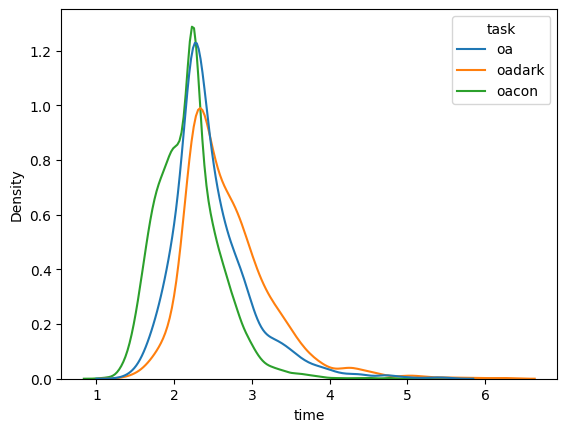

In [16]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'time')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.time, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='total_distance', ylabel='Density'>

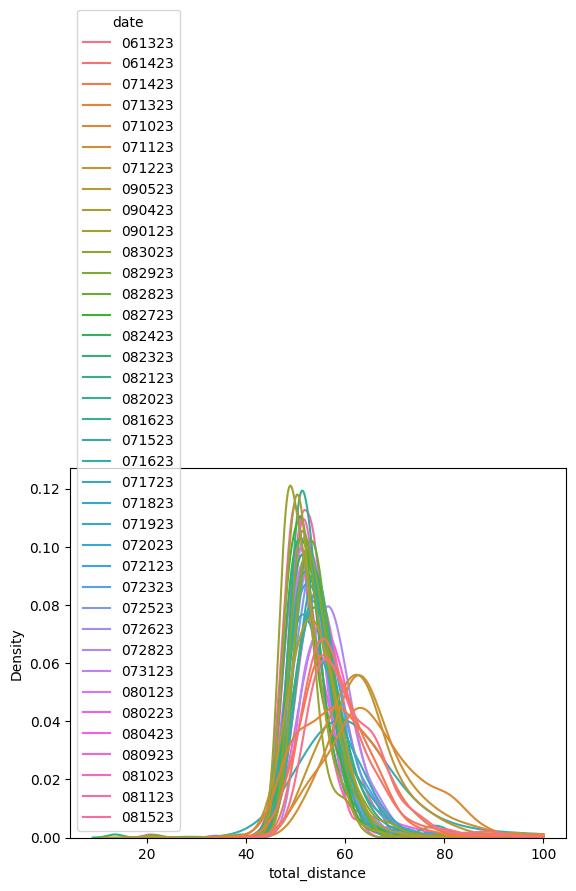

In [86]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'total_distance')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.date, x=data.total_distance, data=data,ax = ax,common_norm=False,clip=(0,2))

<AxesSubplot: xlabel='time', ylabel='Density'>

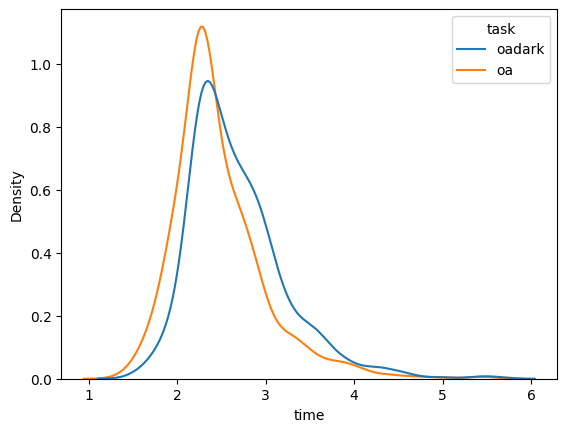

In [87]:
data = pd.concat([dark_long,light_long])
data = drop_nans_in_columns(data,'time')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.time, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='tortuosity', ylabel='Density'>

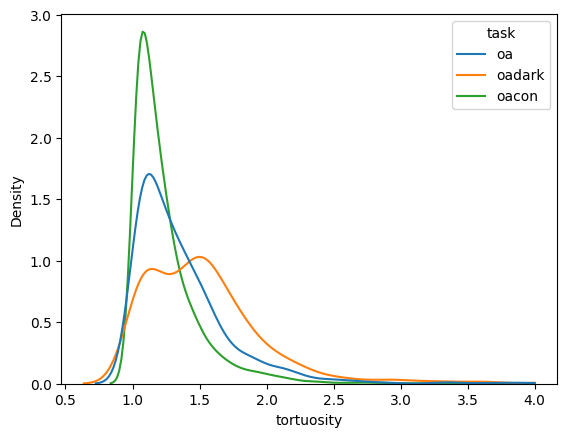

In [83]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'tortuosity')
#data = drop_max_in_columns(data,'tortuosity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.tortuosity, data=data,ax = ax,common_norm=False,clip=(0,4))

<AxesSubplot: xlabel='tortuosity', ylabel='Density'>

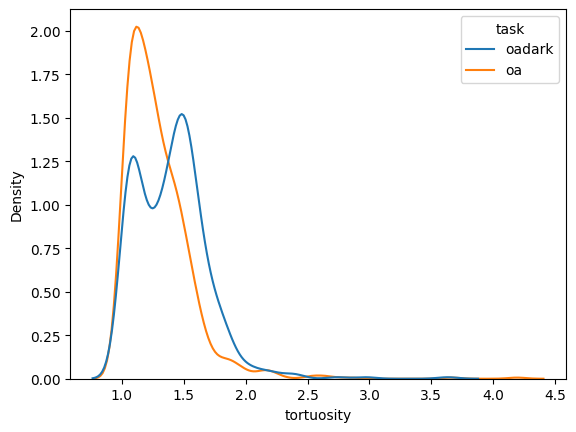

In [68]:
data = pd.concat([dark_long,light_long])
data = drop_nans_in_columns(data,'tortuosity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.tortuosity, data=data,ax = ax,common_norm=False)

In [94]:
dark_long.linearity

49      0.720704
53      0.683125
54      0.853140
102     0.587328
104     0.750360
          ...   
2783    0.668238
2786    0.627158
2806    0.590711
2808    0.655692
2850    0.894069
Name: linearity, Length: 577, dtype: float64

In [71]:
light_long.loc[[3458]]

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance
3458,7,10,44248.273715,44249.973811,"[44248.279296, 44248.297702, 44248.312473, 442...","[1758, 1759, 1760, 1761, 1762, 1763, 1764, 176...","[90.7374267578125, 89.9043960571289, 90.011886...","[263.6696472167969, 264.5920715332031, 264.189...","[101.8441390991211, 102.53662872314453, 102.20...","[259.1569519042969, 260.0104064941406, 259.661...",...,"[31.859080890805377, 27.375701293098846, 24.76...","[39.17294461545368, 34.58023061613483, 32.0541...","[31.859080890805377, 27.375701293098846, 24.76...",1.003134,0.996875,"[-3.619848208343779, -3.370341205636933, -3.25...",1.0,"[33.80141566608338, 36.01579053134662, 37.3559...","[0.7627415555377226, 0.6901596448526295, 0.785...",48.611286


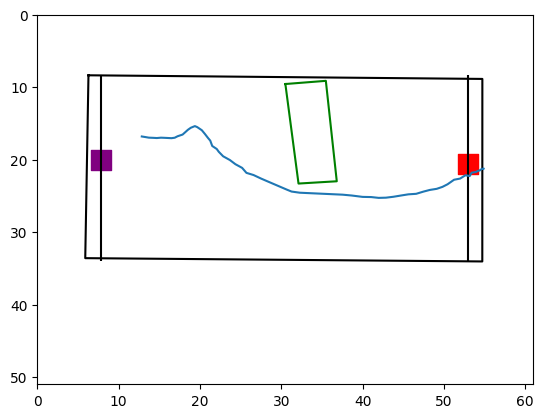

In [144]:
df = light_long.sample(1)

for ind,row in df.iterrows():
    fig, ax= plt.subplots()

    plot_arena(row,ax)

    ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

In [146]:
df.linearity

1848    0.887327
Name: linearity, dtype: float64

In [147]:
df.tortuosity


1848    1.126981
Name: tortuosity, dtype: float64

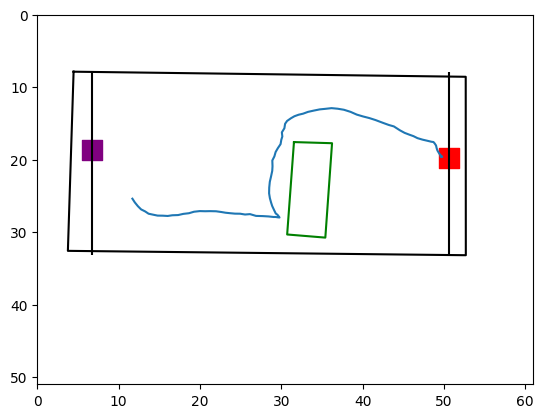

In [95]:
df = dark_long.loc[[2808]]

for ind,row in df.iterrows():
    fig, ax= plt.subplots()

    plot_arena(row,ax)

    ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

In [ ]:
for i,row in enumerate(dark.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_edge']>1).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['zero_out_angle_to_corner'][:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(0, 20, .4)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
ax.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'black',label = 'dark' )
   
   

In [ ]:
length = np.argwhere(row[1]['distance_from_edge']>-3).max()
    interpolater = interp1d(row[1]['distance_from_edge'][:length],row[1]['lateral_error'][:length],fill_value=np.nan,bounds_error=False)

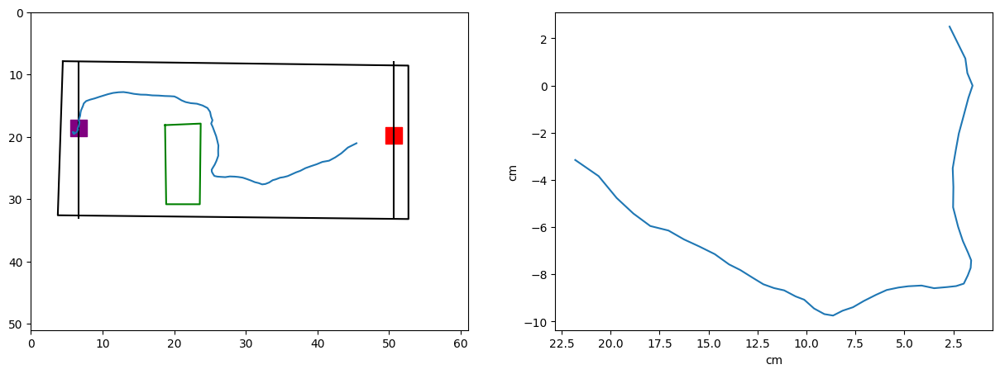

In [142]:
df = dark_long.sample(1)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=2, figsize =(15,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
axs[1].set_ylabel('cm')
axs[1].set_xlabel('cm')
axs[1].invert_xaxis()

length = np.argwhere(row['distance_from_edge']>-3).max()
axs[1].plot(row['distance_from_edge'][:length],row['lateral_error'][:length])

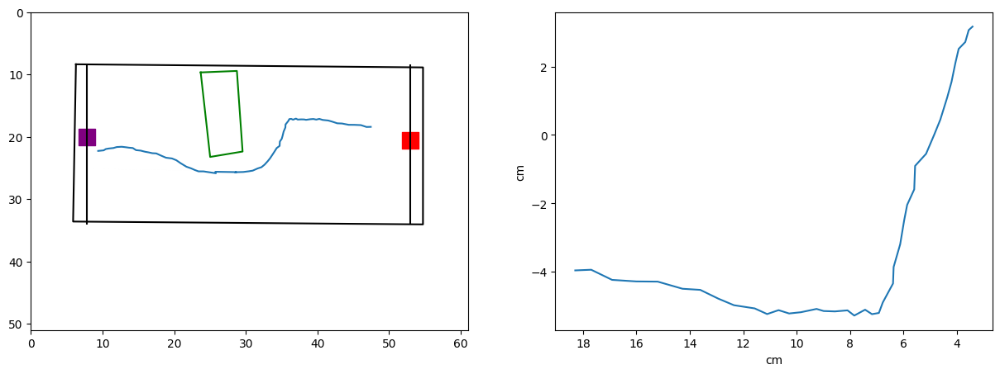

In [141]:
df = light_long.sample(1)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=2, figsize =(15,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
axs[1].set_ylabel('cm')
axs[1].set_xlabel('cm')
axs[1].invert_xaxis()

length = np.argwhere(row['distance_from_edge']>-3).max()
axs[1].plot(row['distance_from_edge'][:length],row['lateral_error'][:length])

In [32]:
dark_long.columns.to_numpy()

array(['level_0', 'index', 'first_poke', 'second_poke',
       'trial_timestamps', 'trial_vidframes', 'nose_x', 'nose_y',
       'leftear_x', 'leftear_y', 'rightear_x', 'rightear_y', 'spine_x',
       'spine_y', 'midspine_x', 'midspine_y', 'tailbase_x', 'tailbase_y',
       'midtail_x', 'midtail_y', 'tailend_x', 'tailend_y', 'arenaTL_x',
       'arenaTL_y', 'arenaTR_x', 'arenaTR_y', 'arenaBL_x', 'arenaBL_y',
       'arenaBR_x', 'arenaBR_y', 'obstacleTL_x', 'obstacleTL_y',
       'obstacleTR_x', 'obstacleTR_y', 'obstacleBR_x', 'obstacleBR_y',
       'obstacleBL_x', 'obstacleBL_y', 'leftportT_x', 'leftportT_y',
       'leftportB_x', 'leftportB_y', 'rightportT_x', 'rightportT_y',
       'rightportB_x', 'rightportB_y', 'len', 'animal', 'date', 'task',
       'condition', 'nose_x_cm', 'nose_y_cm', 'leftear_x_cm',
       'leftear_y_cm', 'rightear_x_cm', 'rightear_y_cm', 'spine_x_cm',
       'spine_y_cm', 'midspine_x_cm', 'midspine_y_cm', 'tailbase_x_cm',
       'tailbase_y_cm', 'midtail_x_cm

In [54]:
for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_target_port']>10).max()
    end = np.argwhere(row['distance_from_target_port']>5).max()
    ax1.plot(row['distance_from_target_port'][length:end],row['angle_to_target_port'][length:end],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 


In [55]:
row['distance_from_target_port'][length:end]

array([10.982481529234665, 9.989361937683162, 8.927440064816475,
       7.8500150132748985, 6.897371032291951, 6.04827273308449],
      dtype=object)

(577, 10) (577, 10)
(327, 10) (327, 10)
(250, 10) (250, 10)


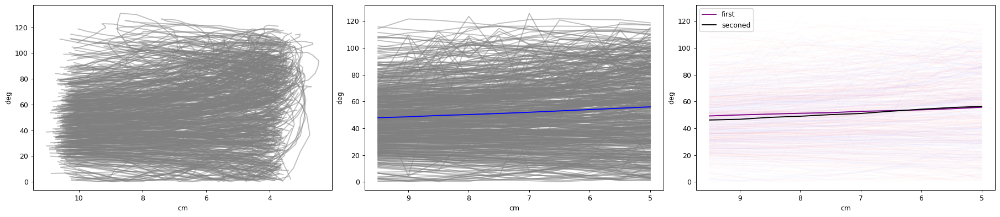

In [67]:
data = dark_long
data = drop_nans_in_columns(data,'angle_to_target_port')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_target_port']>10).max()
    end = np.argwhere(row['distance_from_target_port']>3).max()
    ax1.plot(row['distance_from_target_port'][length:end],row['angle_to_target_port'][length:end],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,10])
angle_array[:] =np.nan 
distance_array = np.empty([rows,10])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>10).max()
    end = np.argwhere(row[1]['distance_from_target_port']>3).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][length:end],row[1]['angle_to_target_port'][length:end],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(5, 10, .5)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,10])
angle_array[:] =np.nan 
distance_array = np.empty([rows,10])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>10).max()
    end = np.argwhere(row[1]['distance_from_target_port']>3).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][length:end],row[1]['angle_to_target_port'][length:end],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(5, 10, .5)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,10])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,10])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>10).max()
    end = np.argwhere(row[1]['distance_from_target_port']>3).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][length:end],row[1]['angle_to_target_port'][length:end],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(5, 10, .5)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmean(distance_array_sec,axis = 0),np.nanmean(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

In [71]:
row['distance_from_target_port'][length:end]

array([15.014274521590531, 14.061447078389472, 13.049683181590554,
       12.00210613923241, 10.982481529234665, 9.989361937683162,
       8.927440064816475, 7.8500150132748985, 6.897371032291951,
       6.04827273308449, 5.201590789326532, 4.407838479721829,
       3.7249455908616422], dtype=object)

In [70]:
for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_target_port']>15).max()
    end = np.argwhere(row['distance_from_target_port']>3).max()
    ax1.plot(row['distance_from_target_port'][length:end],row['angle_to_target_port'][length:end],c = 'grey',alpha = .5)

(869, 10) (869, 10)
(456, 10) (456, 10)
(413, 10) (413, 10)


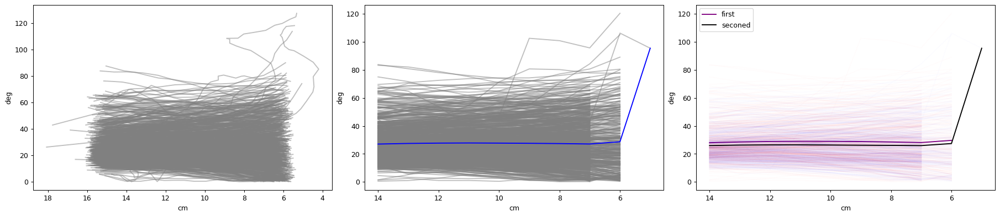

In [73]:
data = light_long
data = drop_nans_in_columns(data,'angle_to_target_port')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_target_port']>15).max()
    end = np.argwhere(row['distance_from_target_port']>5).max()
    ax1.plot(row['distance_from_target_port'][length:end],row['angle_to_target_port'][length:end],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,10])
angle_array[:] =np.nan 
distance_array = np.empty([rows,10])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>15).max()
    end = np.argwhere(row[1]['distance_from_target_port']>5).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][length:end],row[1]['angle_to_target_port'][length:end],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(5, 15, 1)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,10])
angle_array[:] =np.nan 
distance_array = np.empty([rows,10])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>15).max()
    end = np.argwhere(row[1]['distance_from_target_port']>5).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][length:end],row[1]['angle_to_target_port'][length:end],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(5, 15, 1)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,10])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,10])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>15).max()
    end = np.argwhere(row[1]['distance_from_target_port']>5).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][length:end],row[1]['angle_to_target_port'][length:end],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(5, 15, 1)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmean(distance_array_sec,axis = 0),np.nanmean(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()


In [61]:
row[1]['distance_from_target_port']

array([40.20829005005127, 40.16874076143297, 39.9191732872566,
       39.68039185135994, 39.31313862795387, 38.95023306037277,
       38.70352966057439, 38.432174959223936, 38.18560388408374,
       38.034614714106425, 37.907738139355416, 37.59778559039279,
       37.21329211798434, 36.78967033898674, 36.43877592909651,
       36.03087472856955, 35.54212252740658, 34.98806770057896,
       34.37592803661709, 33.67825718607717, 33.0951532881114,
       32.41768768179614, 31.764719327122204, 31.043856441130814,
       30.250179601473704, 29.45267647993537, 28.535918739695187,
       27.69108935708144, 26.843169069148946, 26.019129833538777,
       25.200123866664562, 24.403330456995327, 23.66332463971038,
       22.826782953284873, 22.005648122124956, 21.30682047299288,
       20.67571550626514, 20.15419918831357, 19.59466826609079,
       19.091446969332722, 18.628347684389826, 18.26003658943924,
       17.841746135451462, 17.39527024610645, 16.985369011465664,
       16.426476171161763

In [60]:
row[1]['distance_from_target_port'][length:end]

array([10.789858530222391], dtype=object)

In [52]:
xnew

array([-3.00000000e+00, -2.70000000e+00, -2.40000000e+00, -2.10000000e+00,
       -1.80000000e+00, -1.50000000e+00, -1.20000000e+00, -9.00000000e-01,
       -6.00000000e-01, -3.00000000e-01, -1.77635684e-15,  3.00000000e-01,
        6.00000000e-01,  9.00000000e-01,  1.20000000e+00,  1.50000000e+00,
        1.80000000e+00,  2.10000000e+00,  2.40000000e+00,  2.70000000e+00,
        3.00000000e+00,  3.30000000e+00,  3.60000000e+00,  3.90000000e+00,
        4.20000000e+00,  4.50000000e+00,  4.80000000e+00,  5.10000000e+00,
        5.40000000e+00,  5.70000000e+00,  6.00000000e+00,  6.30000000e+00,
        6.60000000e+00,  6.90000000e+00,  7.20000000e+00,  7.50000000e+00,
        7.80000000e+00,  8.10000000e+00,  8.40000000e+00,  8.70000000e+00,
        9.00000000e+00,  9.30000000e+00,  9.60000000e+00,  9.90000000e+00,
        1.02000000e+01,  1.05000000e+01,  1.08000000e+01,  1.11000000e+01,
        1.14000000e+01,  1.17000000e+01])

(577, 10) (577, 10)
(327, 10) (327, 10)
(250, 10) (250, 10)


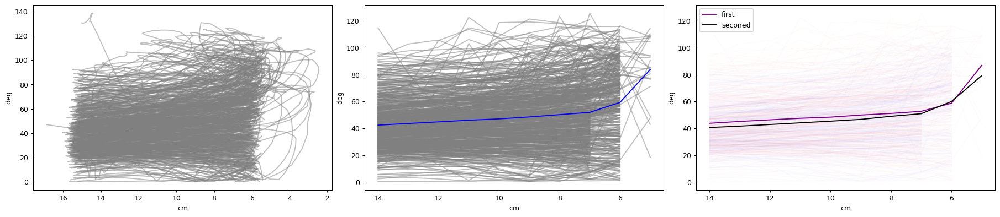

In [74]:
data = dark_long
data = drop_nans_in_columns(data,'angle_to_target_port')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_target_port']>15).max()
    end = np.argwhere(row['distance_from_target_port']>5).max()
    ax1.plot(row['distance_from_target_port'][length:end],row['angle_to_target_port'][length:end],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,10])
angle_array[:] =np.nan 
distance_array = np.empty([rows,10])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>15).max()
    end = np.argwhere(row[1]['distance_from_target_port']>5).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][length:end],row[1]['angle_to_target_port'][length:end],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(5, 15, 1)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,10])
angle_array[:] =np.nan 
distance_array = np.empty([rows,10])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>15).max()
    end = np.argwhere(row[1]['distance_from_target_port']>5).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][length:end],row[1]['angle_to_target_port'][length:end],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(5, 15, 1)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmean(distance_array,axis = 0),np.nanmean(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,10])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,10])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>15).max()
    end = np.argwhere(row[1]['distance_from_target_port']>5).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][length:end],row[1]['angle_to_target_port'][length:end],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(5, 15, 1)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmean(distance_array_sec,axis = 0),np.nanmean(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()


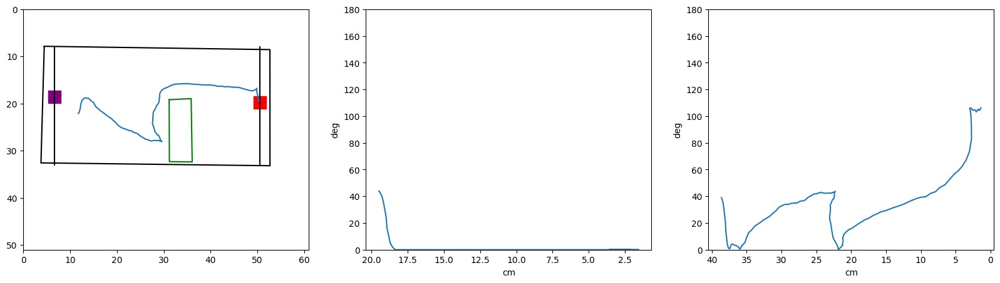

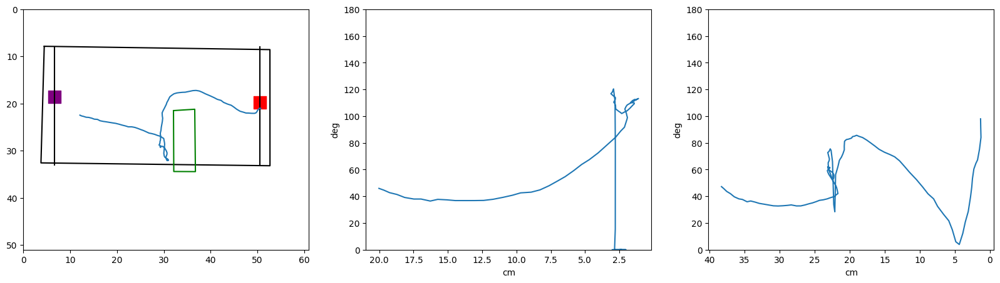

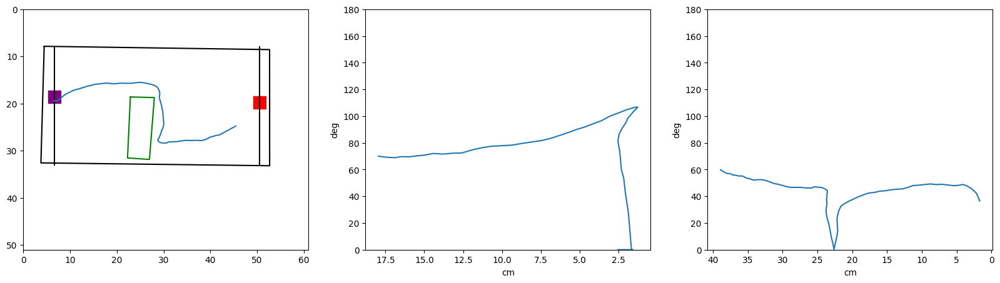

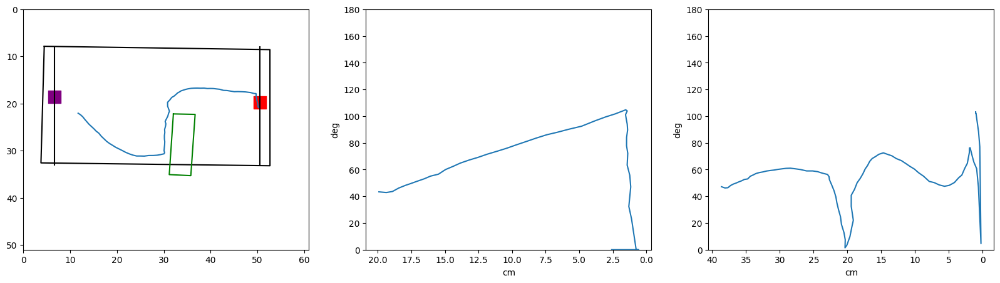

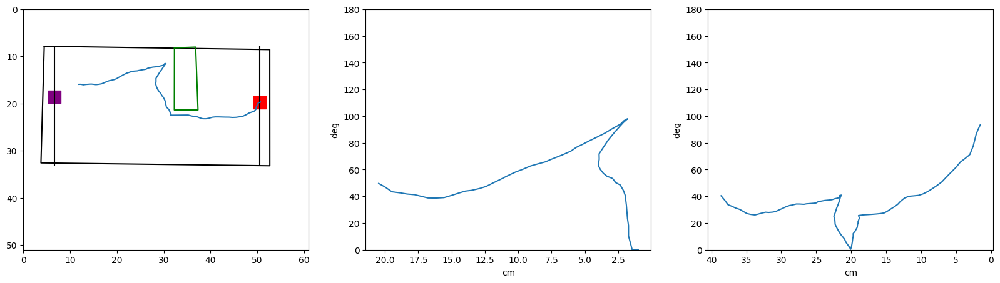

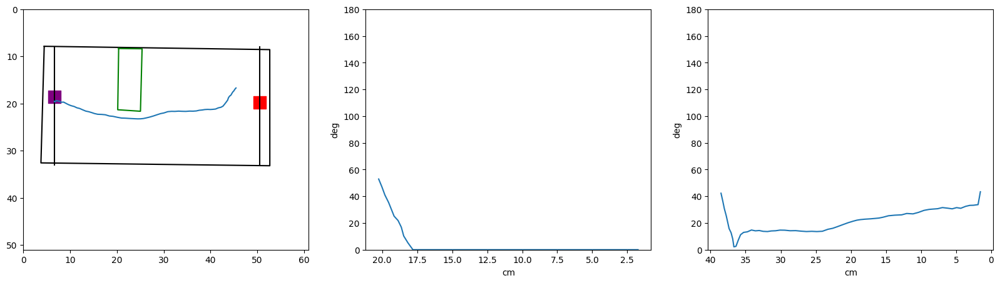

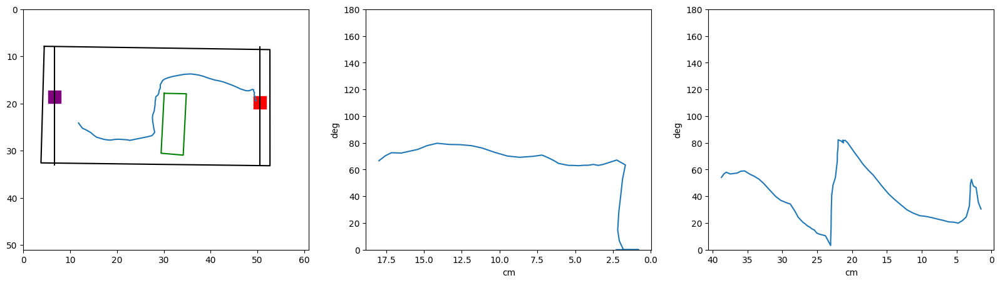

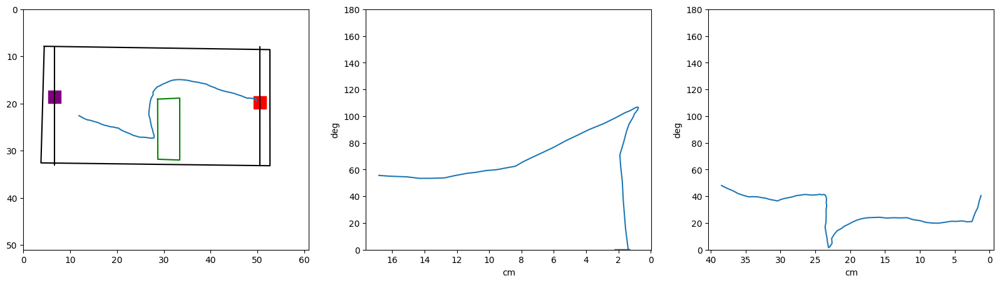

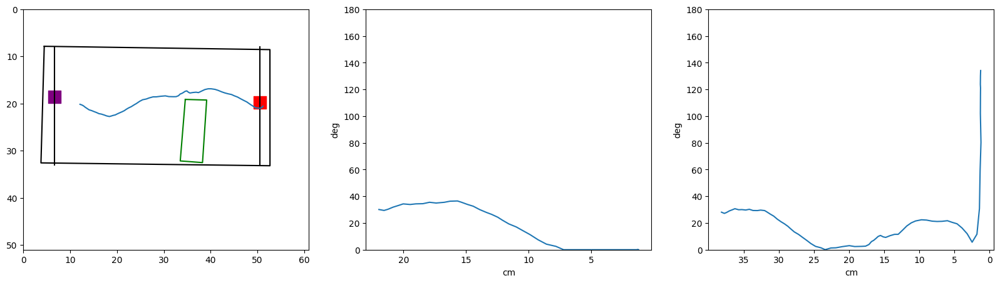

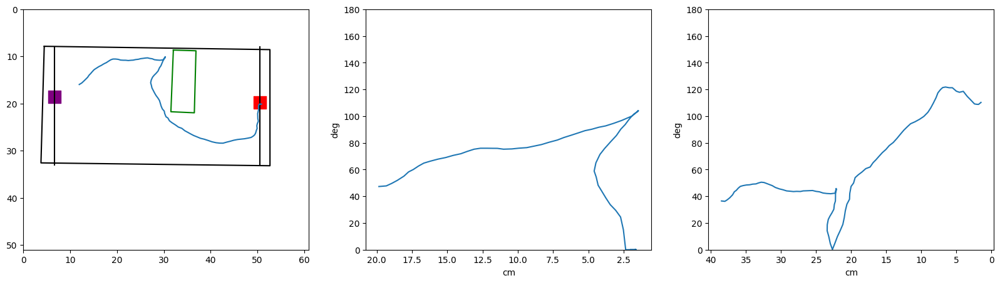

In [18]:
df = dark_long.sample(10)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
    axs[1].set_ylabel('deg')
    axs[1].set_xlabel('cm')
    axs[1].invert_xaxis()
    axs[1].set_ylim(0,180)
    length = np.argwhere(row['distance_from_edge']>1).max()
    axs[1].plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length])

    axs[2].set_ylabel('deg')
    axs[2].set_xlabel('cm')
    axs[2].invert_xaxis()
    axs[2].set_ylim(0,180)
    length = np.argwhere(row['distance_from_target_port']>1).max()
    axs[2].plot(row['distance_from_target_port'][:length],row['angle_to_target_port'][:length])

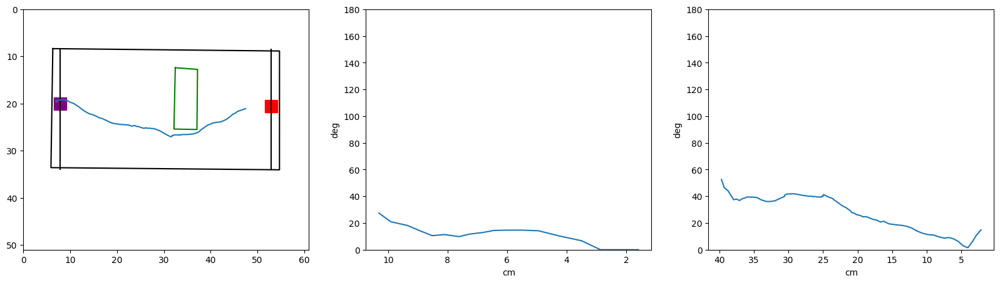

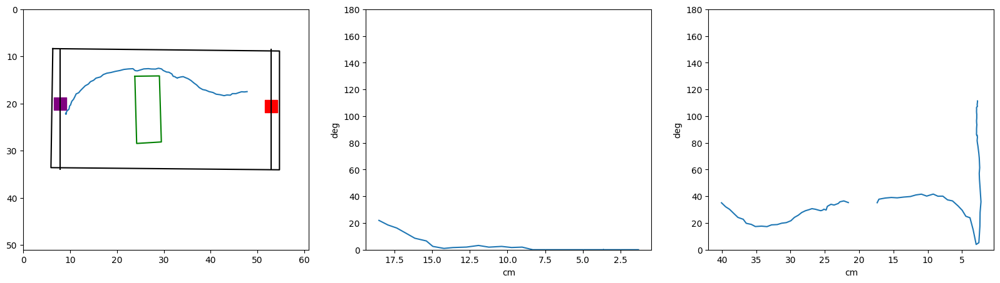

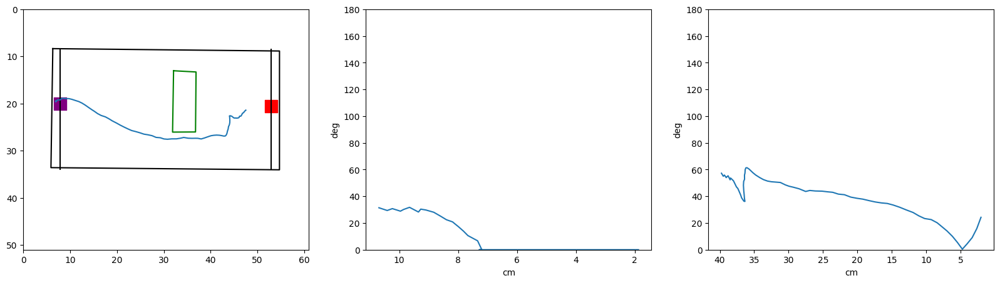

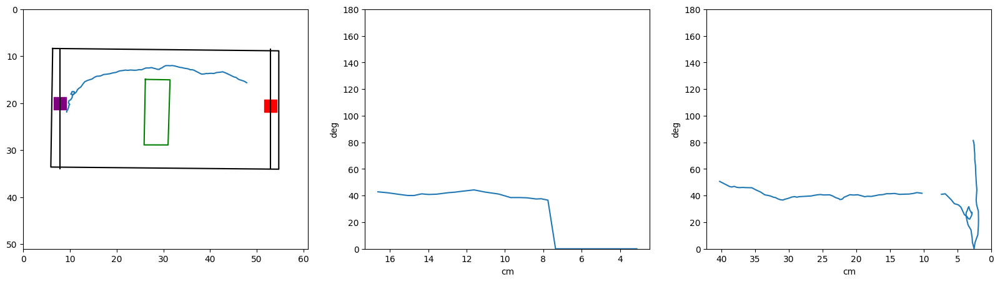

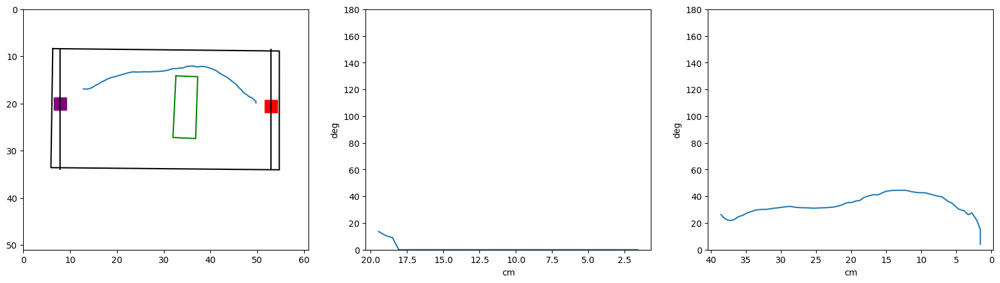

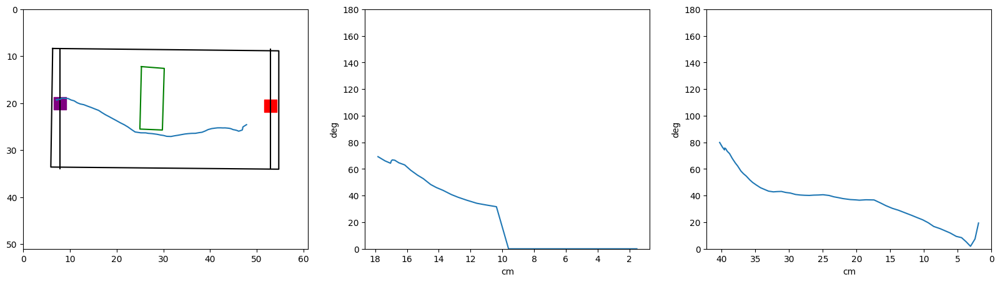

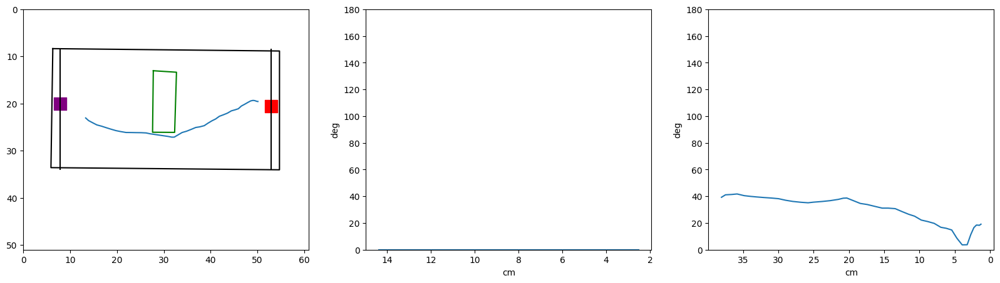

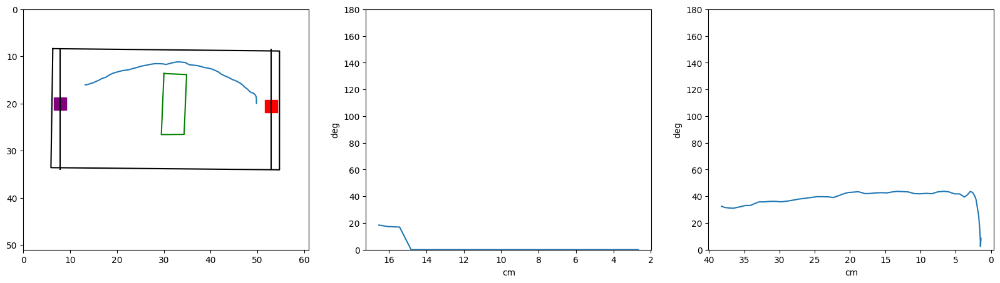

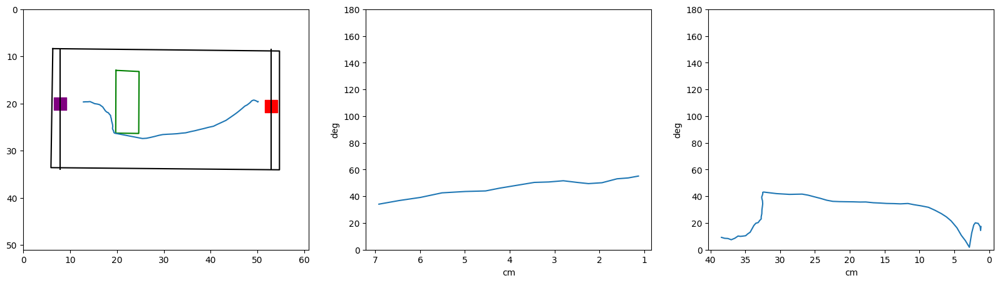

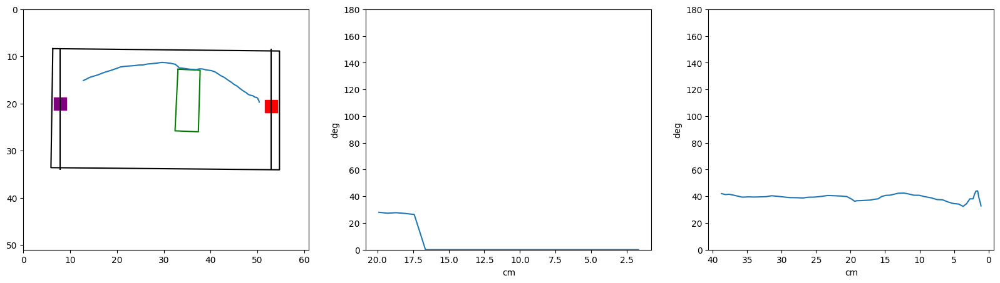

In [49]:
df = light_middle.sample(10)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
    axs[1].set_ylabel('deg')
    axs[1].set_xlabel('cm')
    axs[1].invert_xaxis()
    axs[1].set_ylim(0,180)
    length = np.argwhere(row['distance_from_edge']>1).max()
    axs[1].plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length])

    axs[2].set_ylabel('deg')
    axs[2].set_xlabel('cm')
    axs[2].invert_xaxis()
    axs[2].set_ylim(0,180)
    length = np.argwhere(row['distance_from_target_port']>1).max()
    axs[2].plot(row['distance_from_target_port'][:length],row['angle_to_target_port'][:length])

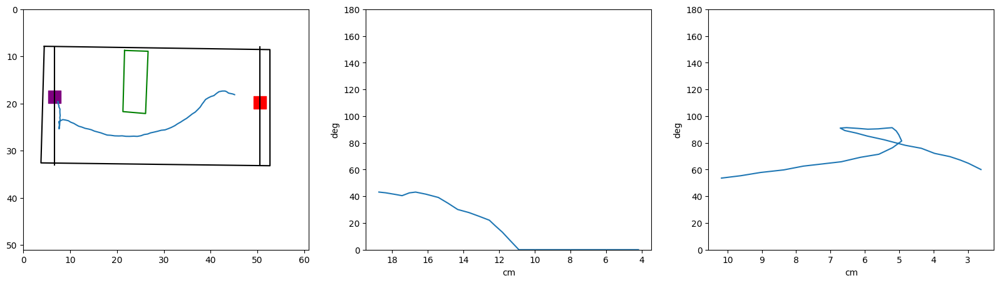

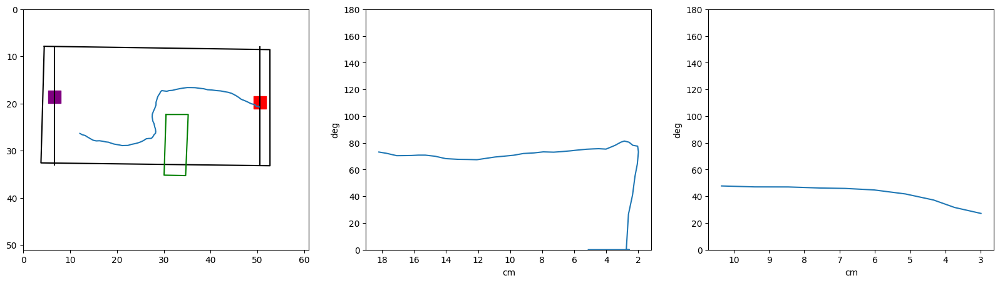

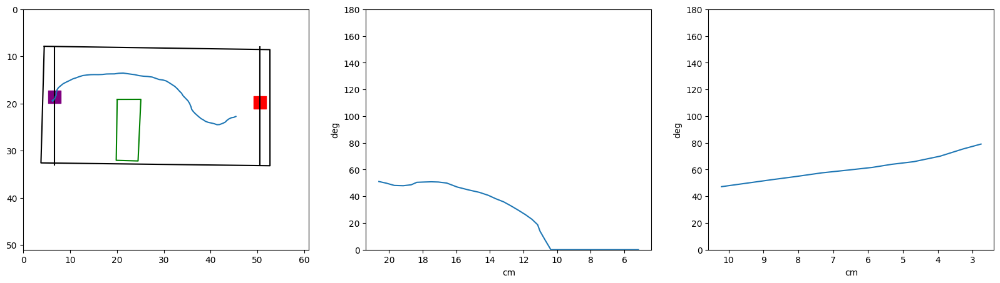

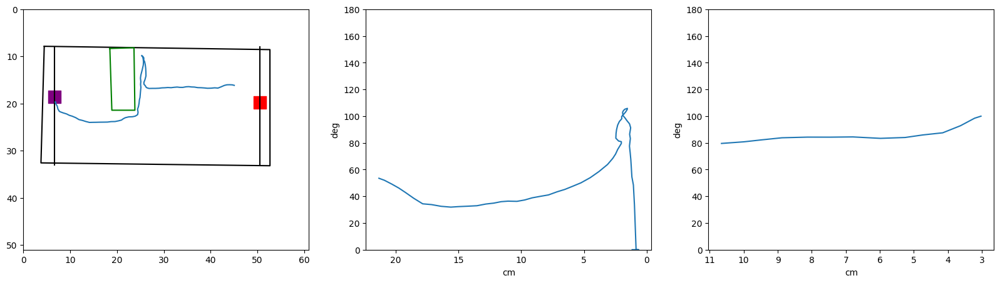

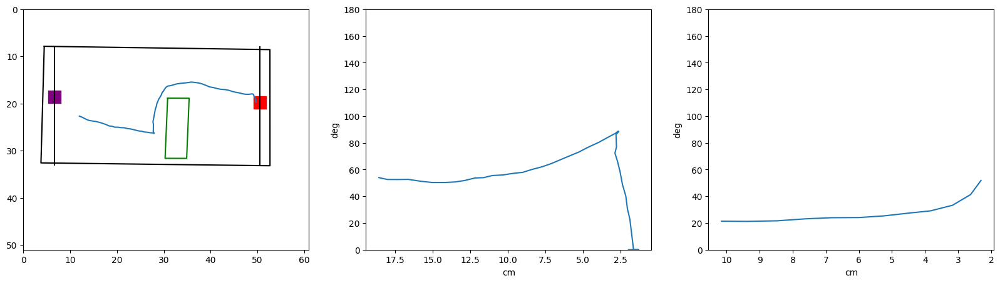

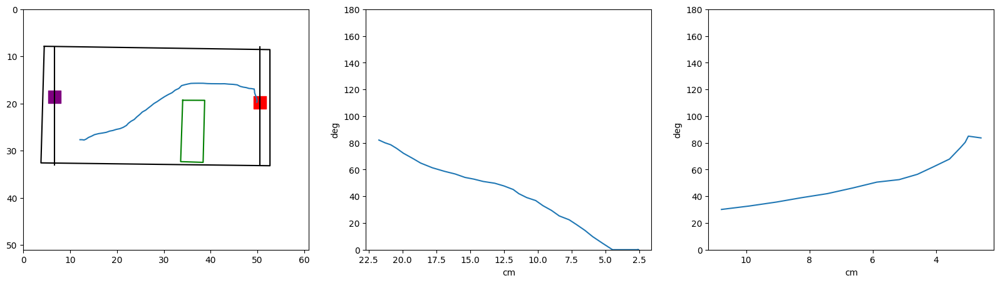

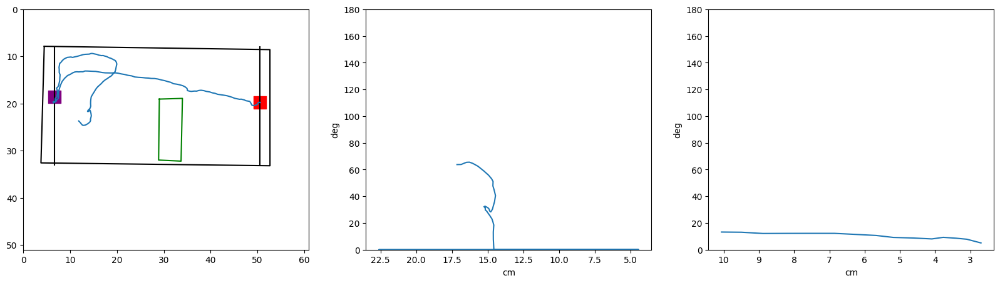

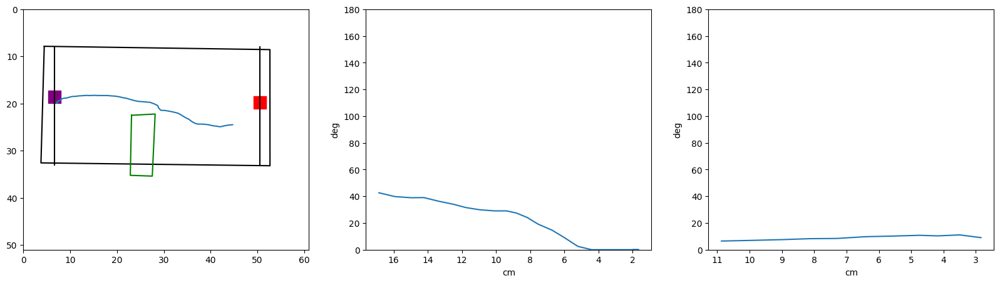

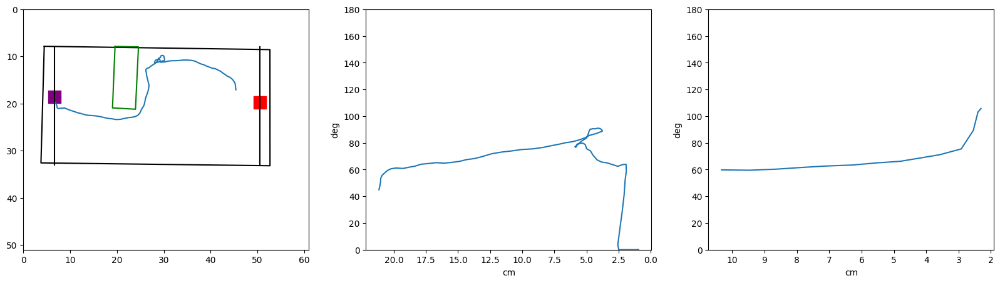

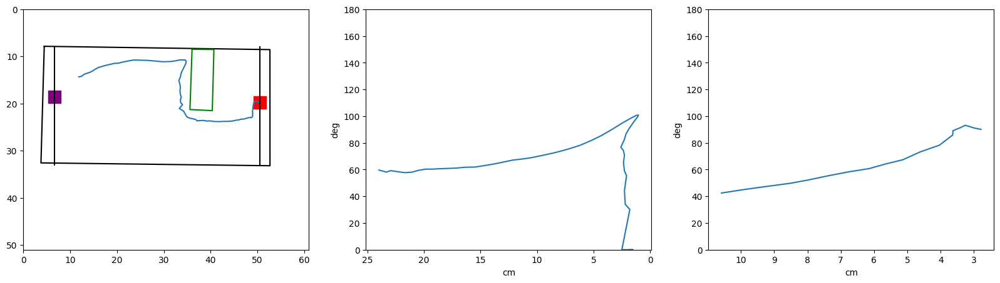

In [43]:
df = dark_long.sample(10)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
    axs[1].set_ylabel('deg')
    axs[1].set_xlabel('cm')
    axs[1].invert_xaxis()
    axs[1].set_ylim(0,180)
    length = np.argwhere(row['distance_from_edge']>1).max()
    axs[1].plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length])

    axs[2].set_ylabel('deg')
    axs[2].set_xlabel('cm')
    axs[2].invert_xaxis()
    axs[2].set_ylim(0,180)
    length = np.argwhere(row['distance_from_target_port']>10).max()
    end = np.argwhere(row['distance_from_target_port']>2).max()
    axs[2].plot(row['distance_from_target_port'][length:end],row['angle_to_target_port'][length:end])

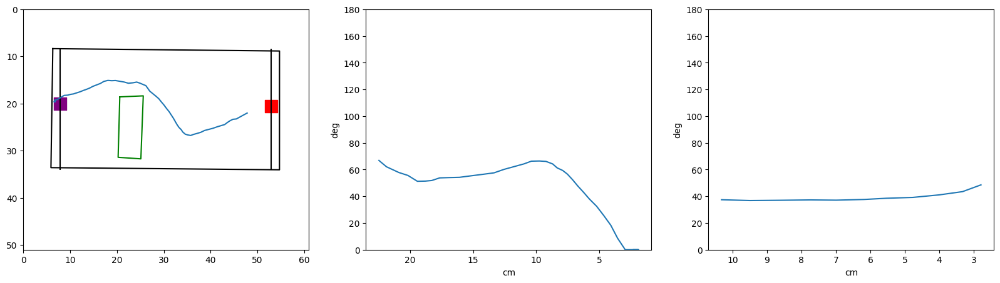

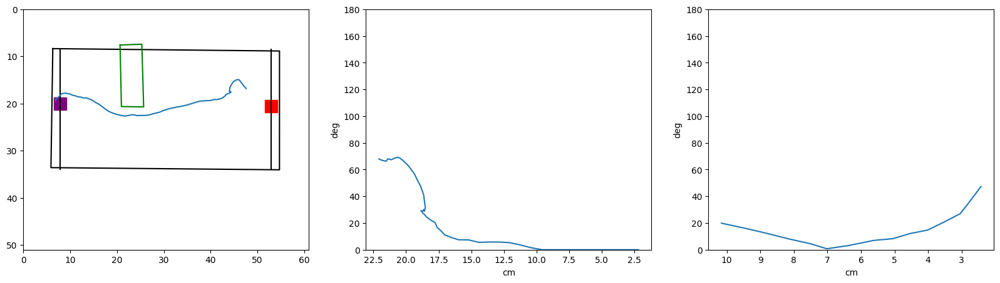

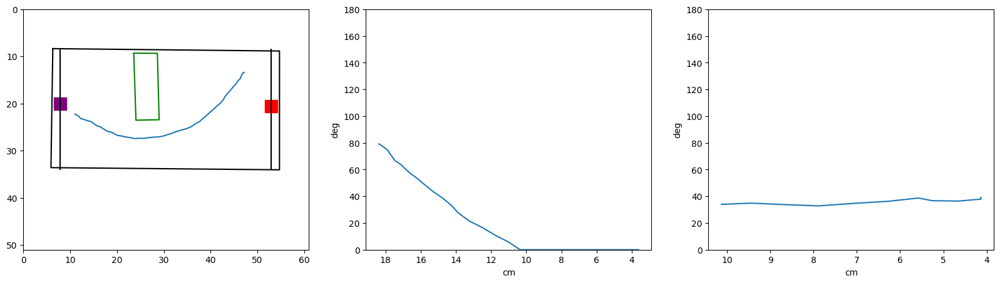

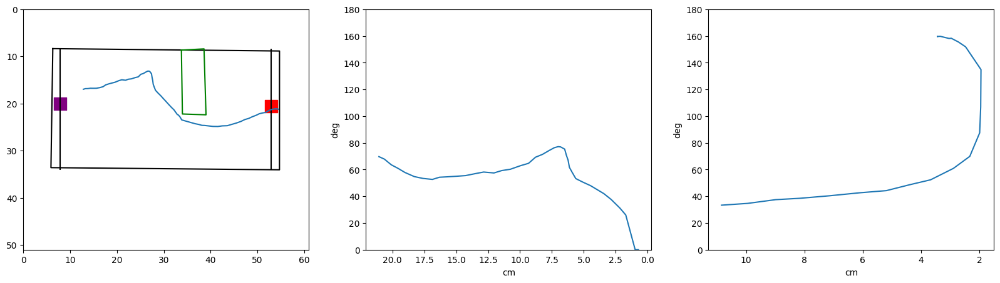

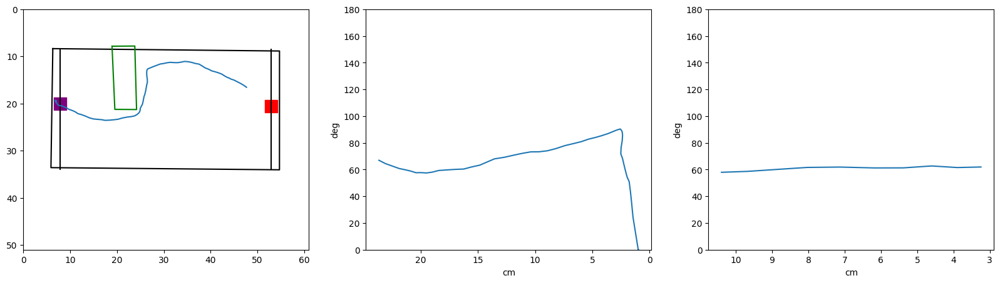

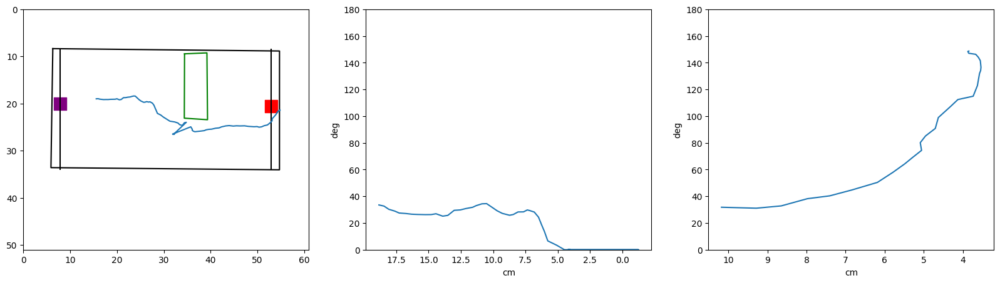

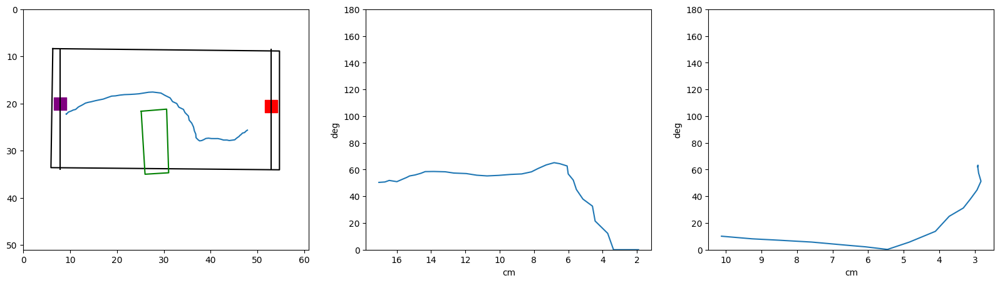

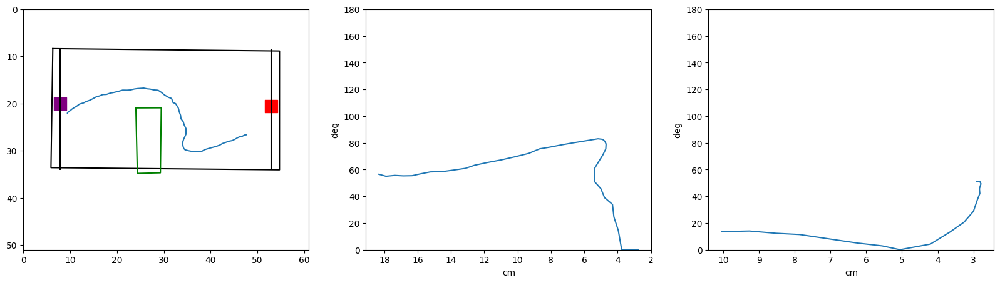

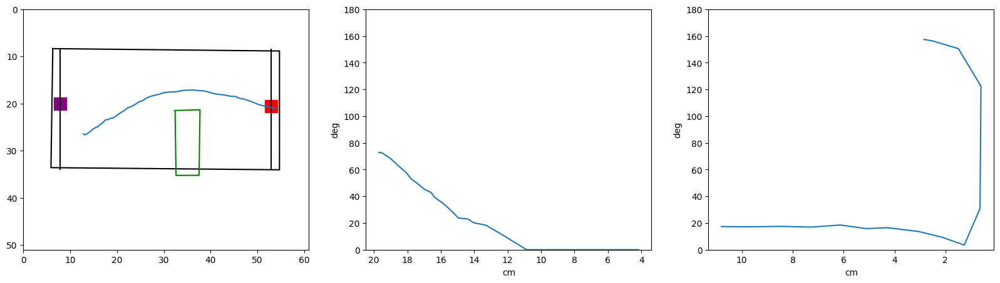

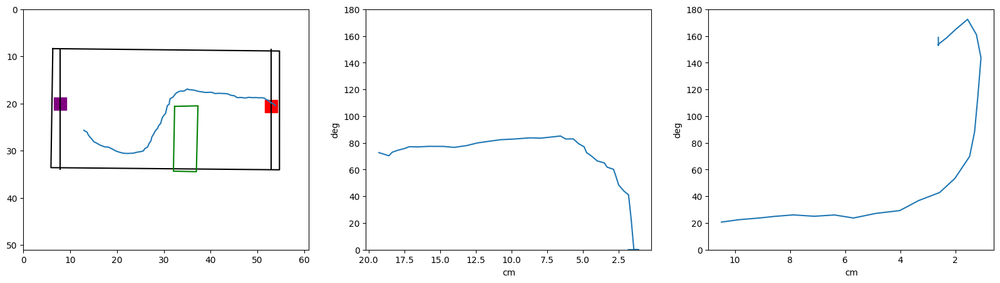

In [41]:
df = light_long.sample(10)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
    axs[1].set_ylabel('deg')
    axs[1].set_xlabel('cm')
    axs[1].invert_xaxis()
    axs[1].set_ylim(0,180)
    length = np.argwhere(row['distance_from_edge']>1).max()
    axs[1].plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length])

    axs[2].set_ylabel('deg')
    axs[2].set_xlabel('cm')
    axs[2].invert_xaxis()
    axs[2].set_ylim(0,180)
    length = np.argwhere(row['distance_from_target_port']>10).max()
    end = np.argwhere(row['distance_from_target_port']>2).max()
    axs[2].plot(row['distance_from_target_port'][length:end],row['angle_to_target_port'][length:end])

In [325]:
row

(33,
 level_0                                                            39
 index                                                              41
 first_poke                                               53313.989644
 second_poke                                              53316.283686
 trial_timestamps    [53314.005196, 53314.021644, 53314.037952, 533...
                                           ...                        
 lateral_error       [-6.250744173033233, -6.672944888816385, -7.09...
 consecutive                                                       1.0
 speed               [49.754385046255486, 45.14033307165888, 32.491...
 distance            [1.0985558018439683, 1.0382078207444039, 0.779...
 total_distance                                               59.93023
 Name: 33, Length: 196, dtype: object)

In [323]:
data.loc[15]

level_0                                                            16
index                                                              17
first_poke                                               53254.613145
second_poke                                              53256.952128
trial_timestamps    [53254.617344, 53254.63488, 53254.650662, 5325...
                                          ...                        
lateral_error       [-5.480601224043522, -5.795032060147992, -6.14...
consecutive                                                       1.0
speed               [39.863659762440584, 47.27939722163224, 43.776...
distance            [0.9054669896399972, 1.0540733021875965, 0.943...
total_distance                                              65.686303
Name: 15, Length: 196, dtype: object

In [329]:
row['distance_from_edge']

array([12.809091830460382, 13.60112033190866, 13.903614807969397,
       14.455319643317914, 15.113340415726412, 15.600957438350193,
       16.25339164571274, 16.791950032025703, 17.517820537976164,
       18.063339604124607, 18.65631744139729, 19.18461276708551,
       19.74023270326058, 20.136450818555957, 20.611353900405803,
       21.06926751710381, 21.650774874854726, 22.04489352296347,
       22.44685138331412, 22.854571515192, 23.1266192117523,
       23.299248576966612, 23.49113807570629, 23.686667852314613,
       23.799205600929803, 23.901119865368898, 23.992924249192583,
       24.09158569108073, 24.27104057729877, 24.39904049626695,
       24.508654308821804, 24.527035909940743, 24.48492041796529,
       24.507072950490247, 24.54515169869056, 24.58778529952108,
       24.621426332745372, 24.621804777474296], dtype=object)

In [361]:
interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
xnew =  np.arange(3, 25, .34)
y = interpolater(xnew)

ZeroDivisionError: float division by zero

In [357]:
from numpy import (array, transpose, searchsorted, atleast_1d, atleast_2d,
                   ravel, poly1d, asarray, intp)

In [358]:
searchsorted(row[1]['distance_from_target_port'][start:length],xnew)

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 39, 39, 39,
       39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39,
       39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39,
       39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39, 39],
      dtype=int64)

In [360]:
row[1]['distance_from_target_port'][start:length]

array([23.52999677744899, 22.829577965253616, 22.169297506556624,
       21.331985535873713, 20.462738260843736, 19.620346595885938,
       18.79779876809155, 17.970577745360522, 17.12355983548824,
       16.171200878833965, 15.242389914546337, 14.354982531663655,
       13.480116893051994, 12.479901862657677, 11.531903210429858,
       10.690148040090216, 9.813092639774379, 8.951333386786654,
       8.127284845480393, 7.482140257855465, 6.818843693779164,
       6.020506722349421, 5.388305196550166, 4.856793280546148,
       4.4527869537104445, 3.7380795493353443, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221],
      dtype=object)

In [359]:
xnew

array([ 3.  ,  3.34,  3.68,  4.02,  4.36,  4.7 ,  5.04,  5.38,  5.72,
        6.06,  6.4 ,  6.74,  7.08,  7.42,  7.76,  8.1 ,  8.44,  8.78,
        9.12,  9.46,  9.8 , 10.14, 10.48, 10.82, 11.16, 11.5 , 11.84,
       12.18, 12.52, 12.86, 13.2 , 13.54, 13.88, 14.22, 14.56, 14.9 ,
       15.24, 15.58, 15.92, 16.26, 16.6 , 16.94, 17.28, 17.62, 17.96,
       18.3 , 18.64, 18.98, 19.32, 19.66, 20.  , 20.34, 20.68, 21.02,
       21.36, 21.7 , 22.04, 22.38, 22.72, 23.06, 23.4 , 23.74, 24.08,
       24.42, 24.76])

In [353]:
row[1]['angle_to_target_port'][start:length]

array([29.170777752525705, 32.79144720198003, 36.54249266842862,
       39.83872606127565, 41.91800381537806, 44.61867674134955,
       47.68025453569026, 50.85735747110869, 53.0610307462531,
       54.304807203814114, 55.96145562986791, 56.445643093701406,
       55.03462763858382, 54.73677952406062, 55.28779508795008,
       53.16636197364178, 53.32236584622023, 54.777254841882474,
       52.72875511124878, 53.14158577404681, 51.65501997808921,
       49.95517468888421, 50.63416476234476, 51.275528775319664,
       51.59774586371614, 54.88258546141391, 56.82030651181089,
       56.55218008734421, 56.20300560057009, 55.94777118516339,
       56.01695529544727, 56.173472028730544, 56.19354895042647,
       56.20950954672251, 56.026292298301634, 55.86369541637317,
       55.435000231154596, 55.15810677157839, 54.519225380850216],
      dtype=object)

In [352]:
row[1]['distance_from_target_port'][start:length]

array([23.52999677744899, 22.829577965253616, 22.169297506556624,
       21.331985535873713, 20.462738260843736, 19.620346595885938,
       18.79779876809155, 17.970577745360522, 17.12355983548824,
       16.171200878833965, 15.242389914546337, 14.354982531663655,
       13.480116893051994, 12.479901862657677, 11.531903210429858,
       10.690148040090216, 9.813092639774379, 8.951333386786654,
       8.127284845480393, 7.482140257855465, 6.818843693779164,
       6.020506722349421, 5.388305196550166, 4.856793280546148,
       4.4527869537104445, 3.7380795493353443, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221],
      dtype=object)

In [351]:
xnew

array([ 3.  ,  3.34,  3.68,  4.02,  4.36,  4.7 ,  5.04,  5.38,  5.72,
        6.06,  6.4 ,  6.74,  7.08,  7.42,  7.76,  8.1 ,  8.44,  8.78,
        9.12,  9.46,  9.8 , 10.14, 10.48, 10.82, 11.16, 11.5 , 11.84,
       12.18, 12.52, 12.86, 13.2 , 13.54, 13.88, 14.22, 14.56, 14.9 ,
       15.24, 15.58, 15.92, 16.26, 16.6 , 16.94, 17.28, 17.62, 17.96,
       18.3 , 18.64, 18.98, 19.32, 19.66, 20.  , 20.34, 20.68, 21.02,
       21.36, 21.7 , 22.04, 22.38, 22.72, 23.06, 23.4 , 23.74, 24.08,
       24.42, 24.76])

In [364]:
row[1]['distance_from_target_port'][start:length]

array([], dtype=object)

In [371]:
row[1]['distance_from_target_port']

array([39.69996644755152, 39.125816783758346, 38.44608694887789,
       37.73297206102406, 36.96073336075597, 36.236663448859204,
       35.37603955700762, 34.6219245230805, 33.91569579701357,
       32.96844106762565, 32.12042502290702, 31.464615439511867,
       30.563729452778507, 29.842004691067867, 29.31850288846001,
       28.554420766183423, 28.272329654689678, 27.832461396958248,
       27.423345965617692, 27.261459501849302, 27.209589655835096,
       27.294537973216116, 27.216771842844214, 26.93344274973867,
       27.031049166226342, 26.965728164868292, 27.04395241628372,
       27.244327268074848, 27.332923941156764, 27.531171901127866,
       27.61856814228476, 27.749748572211292, 27.84711190765081,
       28.010127707693773, 28.03041708194533, 27.95317781365065,
       27.90024819625843, 27.803573005169582, 27.756279412924915,
       27.593607524987693, 27.55240716143504, 27.46536586547088,
       27.126021023888626, 26.775227060947117, 26.50329855835619,
       26.157679

In [372]:
np.argwhere(row[1]['distance_from_target_port']>5).max()

73

(869, 50) (869, 50)
(456, 50) (456, 50)
(413, 50) (413, 50)


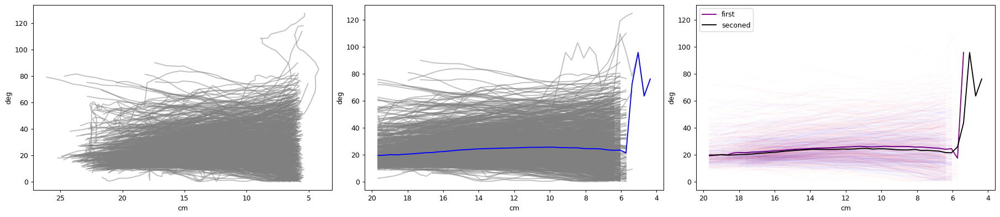

In [377]:
data = light_long
data = drop_nans_in_columns(data,'distance_from_target_port')



fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_target_port']>5).max()
    start = np.argwhere(row['distance_from_edge']<0).min()
    
    ax1.plot(row['distance_from_target_port'][start:length],row['angle_to_target_port'][start:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])

    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

(577, 50) (577, 50)
(327, 50) (327, 50)
(250, 50) (250, 50)


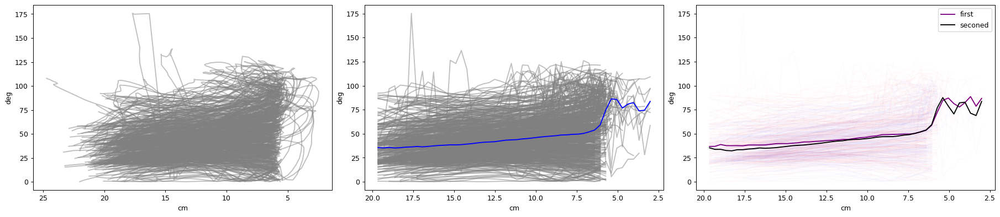

In [375]:
data = dark_long
data = drop_nans_in_columns(data,'distance_from_target_port')



fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_target_port']>5).max()
    start = np.argwhere(row['distance_from_edge']<0).min()
    
    ax1.plot(row['distance_from_target_port'][start:length],row['angle_to_target_port'][start:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])

    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

In [384]:
row

level_0                                                             0
index                                                               0
first_poke                                               61957.719974
second_poke                                              61959.661529
trial_timestamps    [61957.728588, 61957.745088, 61957.762329, 619...
                                          ...                        
speed               [47.104987571861095, 21.86120634667163, 36.968...
distance            [0.8285731969081525, 0.5588277057821038, 0.558...
total_distance                                               13.56188
wall                                                            noise
obstacle                                                        white
Name: 8672, Length: 198, dtype: object

In [383]:
row['distance_from_edge']

array([12.809091830460382, 13.60112033190866, 13.903614807969397,
       14.455319643317914, 15.113340415726412, 15.600957438350193,
       16.25339164571274, 16.791950032025703, 17.517820537976164,
       18.063339604124607, 18.65631744139729, 19.18461276708551,
       19.74023270326058, 20.136450818555957, 20.611353900405803,
       21.06926751710381, 21.650774874854726, 22.04489352296347,
       22.44685138331412, 22.854571515192, 23.1266192117523,
       23.299248576966612, 23.49113807570629, 23.686667852314613,
       23.799205600929803, 23.901119865368898, 23.992924249192583,
       24.09158569108073, 24.27104057729877, 24.39904049626695,
       24.508654308821804, 24.527035909940743, 24.48492041796529,
       24.507072950490247, 24.54515169869056, 24.58778529952108,
       24.621426332745372, 24.621804777474296], dtype=object)

In [385]:
data.drop(labels=8672)

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance,wall,obstacle
1,1,1,45287.166080,45289.095539,"[45287.173977, 45287.191155, 45287.207692, 452...","[[180, 181, 182, 183, 184, 185, 186, 187, 188,...","[659.1345825195312, 659.9591064453125, 658.926...","[262.79779052734375, 262.86639404296875, 262.2...","[640.8193359375, 642.065185546875, 641.9094848...","[259.280517578125, 258.0514221191406, 258.0626...",...,"[25.188468226667293, 24.49982378001088, 24.453...",1.063088,0.940656,"[-3.6397835437390853, -3.793345578511641, -3.9...",1.0,"[23.12081272385763, 28.104337213792903, 29.306...","[0.5399714635913, 0.584721674952867, 0.5042292...",51.726173,black,black
13,16,19,45329.628812,45331.279616,"[45329.63872, 45329.655552, 45329.672179, 4532...","[[2727, 2728, 2729, 2730, 2731, 2732, 2733, 27...","[662.4247436523438, 662.3223876953125, 662.512...","[268.860595703125, 267.6027526855469, 266.1972...","[647.87255859375, 648.4732055664062, 648.97534...","[259.42236328125, 258.2563171386719, 256.81088...",...,"[30.8321920145616, 29.116613336235638, 28.4069...",1.125695,0.888340,"[-4.6138236439678195, -4.733147074678449, -4.9...",2.0,"[31.88956898338414, 37.42627179732644, 29.7997...","[0.6183264892174378, 0.8268049562845512, 0.619...",52.487304,black,black
30,36,39,45373.836518,45375.630643,"[45373.837363, 45373.8539, 45373.870758, 45373...","[[5378, 5379, 5380, 5381, 5382, 5383, 5384, 53...","[658.9888916015625, 659.8367919921875, 660.936...","[262.6311340332031, 262.8354187011719, 262.632...","[643.4417114257812, 645.067626953125, 646.9371...","[251.00555419921875, 250.87335205078125, 250.5...",...,"[45.99380142925885, 45.01354949356713, 43.0121...",1.281407,0.780392,"[-6.245407768603636, -6.619223968586478, -6.81...",1.0,"[37.79426797412933, 35.5809857847017, 46.99307...","[0.8998594059540839, 0.793190838683504, 0.8691...",56.776001,black,black
32,38,41,45378.760268,45380.583091,"[45378.772224, 45378.789875, 45378.805862, 453...","[[5674, 5675, 5676, 5677, 5678, 5679, 5680, 56...","[660.15234375, 661.2433471679688, 661.91552734...","[263.1383361816406, 264.3952941894531, 263.993...","[645.3707885742188, 647.1256103515625, 649.435...","[252.9916229248047, 253.55458068847656, 254.19...",...,"[41.725054167314354, 40.65793533555561, 38.634...",1.440085,0.694403,"[-5.920892356523922, -6.171739380815014, -6.34...",2.0,"[39.46577513786131, 39.5323254429574, 43.12633...","[0.7977157489615099, 0.7981332361858247, 0.969...",59.353860,black,black
51,60,63,45427.887513,45429.657356,"[45427.889011, 45427.905907, 45427.923353, 454...","[[8620, 8621, 8622, 8623, 8624, 8625, 8626, 86...","[660.4502563476562, 660.454833984375, 661.3882...","[265.1165466308594, 264.84393310546875, 264.86...","[643.5790405273438, 644.8306274414062, 646.271...","[257.3697509765625, 256.9438171386719, 256.507...",...,"[39.481008643561324, 37.515822314135804, 35.36...",1.308089,0.764474,"[-6.124790951230548, -6.269213620833529, -6.36...",1.0,"[33.5206256732645, 31.65931771729305, 40.34291...","[0.6733917748955989, 0.6441351075159965, 0.820...",57.712816,black,black
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31469,119,136,42211.989235,42213.742604,"[42211.989376, 42212.005849, 42212.024588, 422...","[20425, 20426, 20427, 20428, 20429, 20430, 204...","[82.2231216430664, 80.60994720458984, 79.09525...","[252.2783203125, 253.27371215820312, 254.40551...","[98.04216003417969, 96.56690979003906, 94.9938...","[251.42543029785156, 251.54502868652344, 251.8...",...,"[51.95072907657566, 49.26509324092403, 46.1293...",1.031369,0.969585,"[-2.7455434692629694, -2.967762434027904, -3.0...",2.0,"[29.679001815550524, 30.277796867982808, 31.76...","[0.6823193998884403, 0.5757848761845263, 0.681...",53.088046,black,noise
31481,134,152,42254.324953,42257.180108,"[42254.337011, 42254.

In [390]:
row

level_0                                                             0
index                                                               0
first_poke                                               50330.353472
second_poke                                              50331.959155
trial_timestamps    [50330.357286, 50330.373964, 50330.390707, 503...
                                          ...                        
speed               [22.554889760807583, 33.47302130071632, 28.799...
distance            [0.4430057762223498, 0.719529130503684, 0.5946...
total_distance                                              20.575258
wall                                                            black
obstacle                                                        black
Name: 1015, Length: 198, dtype: object

In [392]:
row['distance_from_edge']

array([13.154881657686687, 13.584061093268446, 11.040674526962015,
       11.569365163003972, 12.13737772163931, 12.619418125730547,
       13.10529245662579, 13.071584271957242, 13.037876087288687,
       13.00416790262014, 12.970459717951591, 12.936751533283037,
       12.903043348614489, 12.86933516394594, 12.835626979277386,
       12.801918794608838, 12.768210609940283, 12.734502425271735,
       12.700794240603187, 12.667086055934632, 12.633377871266084,
       12.599669686597537, 12.565961501928982, 12.532253317260434,
       12.498545132591886, 12.464836947923331, 12.431128763254783,
       12.397420578586235, 12.36371239391768, 12.330004209249132,
       12.296296024580585, 12.26258783991203, 12.228879655243482,
       12.195171470574934, 12.161463285906379, 12.127755101237831,
       12.094046916569276, 12.060338731900728, 12.02663054723218,
       11.992922362563625, 11.959214177895078, 11.92550599322653,
       11.891797808557975, 11.858089623889427, 11.824381439220879,
   

ValueError: zero-size array to reduction operation minimum which has no identity

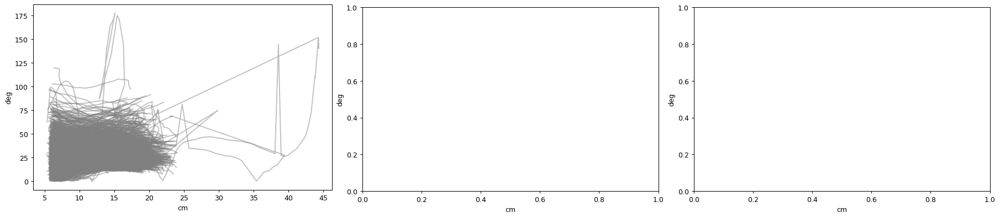

In [393]:
data = conditions_long
data = drop_nans_in_columns(data,'distance_from_target_port')
data = drop_nans_in_columns(data,'distance_from_edge')
data = data.drop(labels=8672)
data = data.drop(labels=1015)



fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_target_port']>5).max()
    start = np.argwhere(row['distance_from_edge']<0).min()
    
    ax1.plot(row['distance_from_target_port'][start:length],row['angle_to_target_port'][start:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])

    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

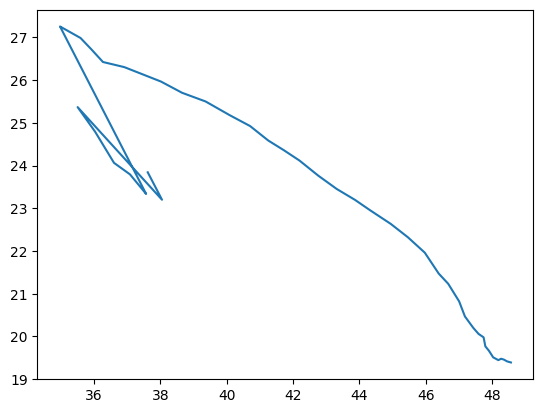

In [396]:
plt.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])
plt.xlim

In [394]:
np.argwhere(row['distance_from_edge']<0).min()

ValueError: zero-size array to reduction operation minimum which has no identity

In [332]:
len(row[1]['distance_from_target_port'][start:length])

39

ValueError: cannot reshape array of size 0 into shape (0,newaxis)

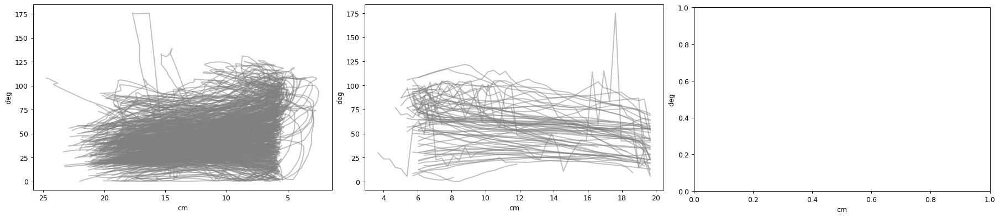

In [363]:
data = dark_long
data = drop_nans_in_columns(data,'distance_from_target_port')


fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)
spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
ax3 = fig.add_subplot(panel_3[0,0])

ax1.set_ylabel('deg')
ax1.set_xlabel('cm')
ax2.set_ylabel('deg')
ax2.set_xlabel('cm')
ax3.set_ylabel('deg')
ax3.set_xlabel('cm')

for ind,row in data.iterrows():
    #length = int(row['len_facing_corner'])
    length = np.argwhere(row['distance_from_target_port']>5).max()
    start = np.argwhere(row['distance_from_edge']<0).min()
    
    ax1.plot(row['distance_from_target_port'][start:length],row['angle_to_target_port'][start:length],c = 'grey',alpha = .5)
ax1.invert_xaxis()
rows = data.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 

for i,row in enumerate(data.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax2.plot(xnew,ynew,c = 'grey',alpha = .5)
ax2.invert_xaxis()
print(distance_array.shape,angle_array.shape)
ax2.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'blue')
by_consecutive = data.groupby(['consecutive'])
for con,con_df in by_consecutive:
    if con == 1:
        first_df = con_df
    if con ==2:
        sec_df = con_df
rows = first_df.shape[0]
angle_array = np.empty([rows,50])
angle_array[:] =np.nan 
distance_array = np.empty([rows,50])
distance_array[:] =np.nan 
for i,row in enumerate(first_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])

    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array[i] = xnew
    angle_array[i] = ynew
    ax3.plot(xnew,ynew,c = 'red',alpha = .01)
ax3.plot(np.nanmedian(distance_array,axis = 0),np.nanmedian(angle_array,axis = 0),c = 'purple',label = 'first')
print(distance_array.shape,angle_array.shape)
rows = sec_df.shape[0]
angle_array_sec = np.empty([rows,50])
angle_array_sec[:] =np.nan 
distance_array_sec = np.empty([rows,50])
distance_array_sec[:] =np.nan 
for i,row in enumerate(sec_df.iterrows()):
    
    #length = int(row[1]['len_facing_corner'])
    length = np.argwhere(row[1]['distance_from_target_port']>5).max()
    start = np.argwhere(row[1]['distance_from_edge']<0).min()
    interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)
    xnew =  np.arange(3, 20, .34)
    ynew = interpolater(xnew)
    distance_array_sec[i] = xnew
    angle_array_sec[i] = ynew
    ax3.plot(xnew,ynew,c = 'blue',alpha = .01)
ax3.plot(np.nanmedian(distance_array_sec,axis = 0),np.nanmedian(angle_array_sec,axis = 0),c = 'black',label = 'seconed')
print(distance_array_sec.shape,angle_array_sec.shape)
ax3.invert_xaxis()
ax3.legend()

In [334]:
len(row[1]['distance_from_target_port'][start:length])

21

In [299]:
interpolater = interp1d(row[1]['distance_from_target_port'][start:length],row[1]['angle_to_target_port'][start:length],fill_value=np.nan,bounds_error=False)

In [306]:
row['distance_from_target_port'][start:length]

array([23.52999677744899, 22.829577965253616, 22.169297506556624,
       21.331985535873713, 20.462738260843736, 19.620346595885938,
       18.79779876809155, 17.970577745360522, 17.12355983548824,
       16.171200878833965, 15.242389914546337, 14.354982531663655,
       13.480116893051994, 12.479901862657677, 11.531903210429858,
       10.690148040090216, 9.813092639774379, 8.951333386786654,
       8.127284845480393, 7.482140257855465, 6.818843693779164,
       6.020506722349421, 5.388305196550166, 4.856793280546148,
       4.4527869537104445, 3.7380795493353443, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221,
       3.413127812647221, 3.413127812647221, 3.413127812647221],
      dtype=object)

(15,
 level_0                                                            16
 index                                                              17
 first_poke                                               53254.613145
 second_poke                                              53256.952128
 trial_timestamps    [53254.617344, 53254.63488, 53254.650662, 5325...
                                           ...                        
 lateral_error       [-5.480601224043522, -5.795032060147992, -6.14...
 consecutive                                                       1.0
 speed               [39.863659762440584, 47.27939722163224, 43.776...
 distance            [0.9054669896399972, 1.0540733021875965, 0.943...
 total_distance                                              65.686303
 Name: 15, Length: 196, dtype: object)

In [312]:
row[1]['angle_to_target_port'][start:length]

array([29.170777752525705, 32.79144720198003, 36.54249266842862,
       39.83872606127565, 41.91800381537806, 44.61867674134955,
       47.68025453569026, 50.85735747110869, 53.0610307462531,
       54.304807203814114, 55.96145562986791, 56.445643093701406,
       55.03462763858382, 54.73677952406062, 55.28779508795008,
       53.16636197364178, 53.32236584622023, 54.777254841882474,
       52.72875511124878, 53.14158577404681, 51.65501997808921,
       49.95517468888421, 50.63416476234476, 51.275528775319664,
       51.59774586371614, 54.88258546141391, 56.82030651181089,
       56.55218008734421, 56.20300560057009, 55.94777118516339,
       56.01695529544727, 56.173472028730544, 56.19354895042647,
       56.20950954672251, 56.026292298301634, 55.86369541637317,
       55.435000231154596, 55.15810677157839, 54.519225380850216],
      dtype=object)

In [308]:
row['angle_to_target_port'][start:length]

TypeError: tuple indices must be integers or slices, not str

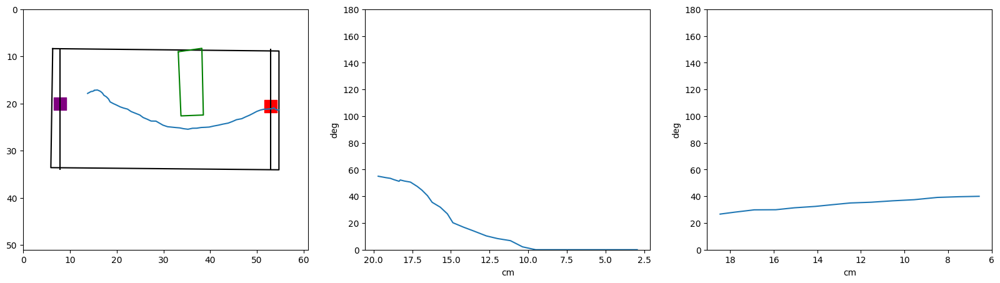

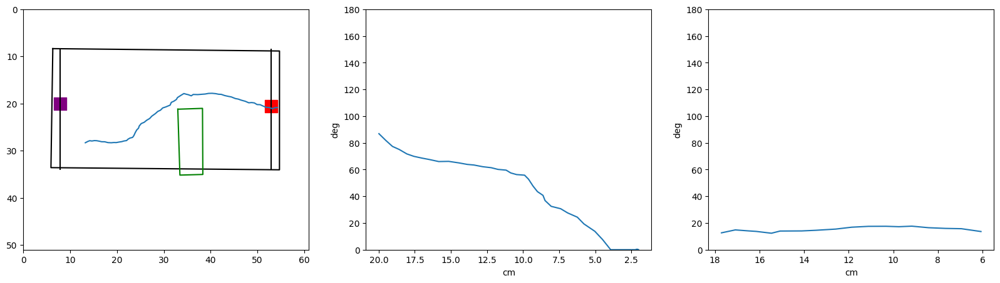

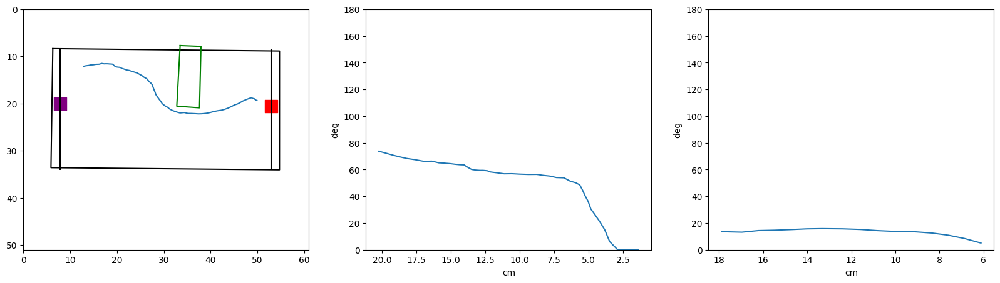

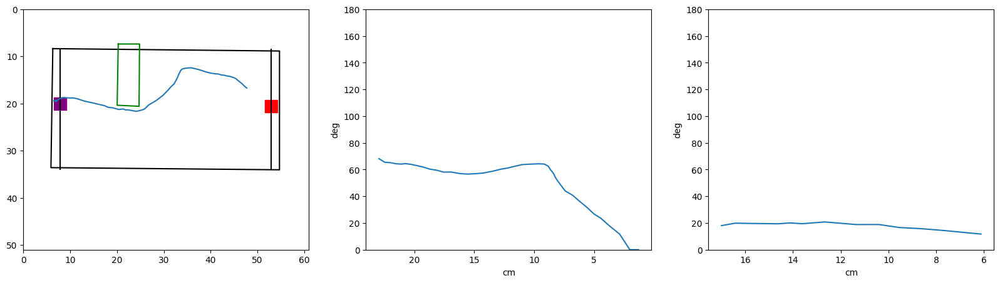

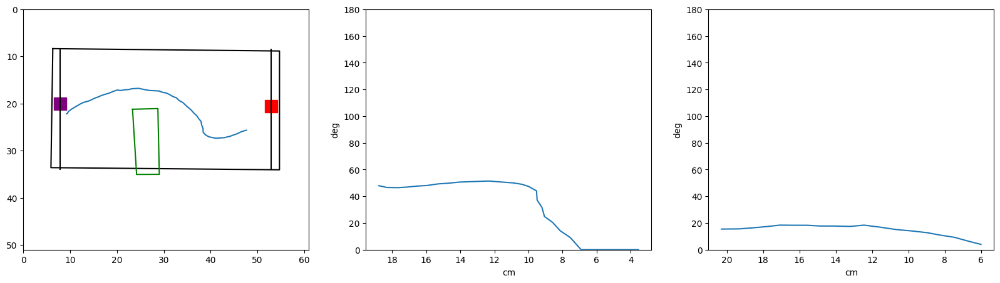

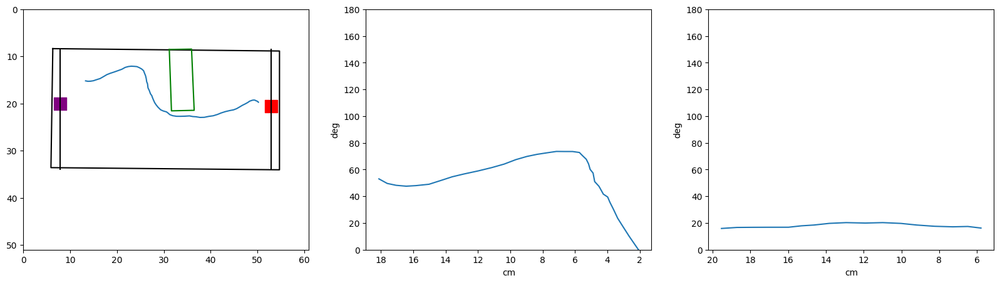

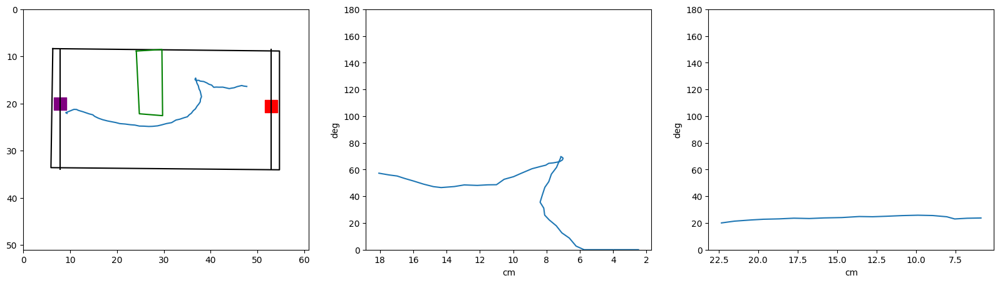

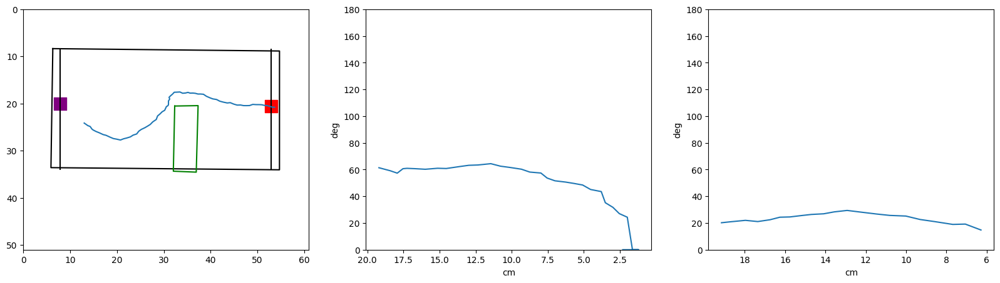

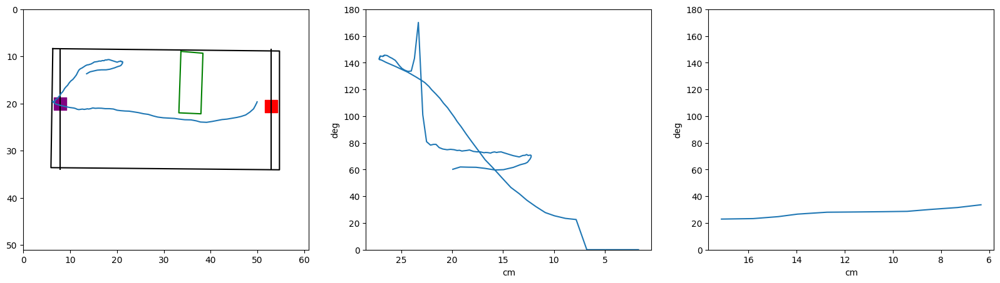

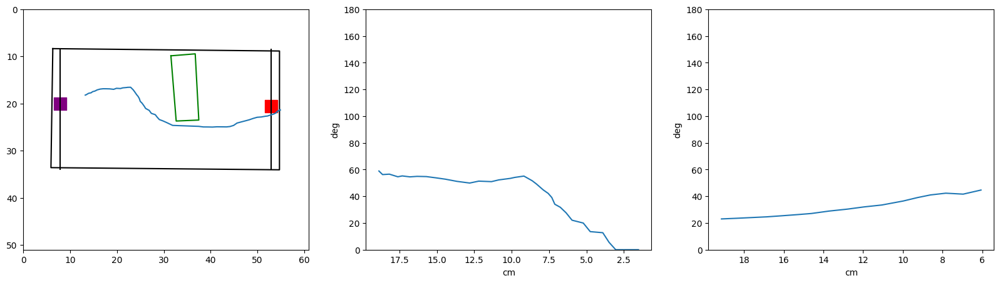

In [294]:
df = light_long.sample(10)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
    axs[1].set_ylabel('deg')
    axs[1].set_xlabel('cm')
    axs[1].invert_xaxis()
    axs[1].set_ylim(0,180)
    length = np.argwhere(row['distance_from_edge']>1).max()
    axs[1].plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length])

    axs[2].set_ylabel('deg')
    axs[2].set_xlabel('cm')
    axs[2].invert_xaxis()
    axs[2].set_ylim(0,180)
    length = np.argwhere(row['distance_from_target_port']>5).max()
    start = np.argwhere(row['distance_from_edge']<0).min()
    
    axs[2].plot(row['distance_from_target_port'][start:length],row['angle_to_target_port'][start:length])

In [286]:
row['distance_from_edge']

array([19.11664844151329, 18.480392804315542, 18.002334628322537,
       17.404873064501324, 16.955989107907214, 16.428929871969544,
       15.972832734987128, 15.414923386625306, 15.110747662477532,
       14.804372756257834, 14.666586988062772, 14.54445542879957,
       14.630452682324282, 14.620088367023175, 14.520208562907591,
       14.622756115104199, 14.625946012168605, 14.540141429338629,
       14.674831925721733, 14.6918462301496, 14.582617907117605,
       14.318358078616338, 13.950374152610934, 13.387381262072495,
       12.600731896838635, 11.941136364180345, 11.206278634570856,
       10.477268059249868, 9.782784940951881, 9.041833331936706,
       8.109625011562253, 7.239115470254385, 6.5370142060546845,
       5.8971230716177585, 5.384098229096589, 5.113298918227048,
       5.065021352975848, 5.214445347431241, -5.418005723652358,
       -5.701994982387516, -6.119110154339675, -6.666343227342374,
       -7.341339064455603, -7.9345875432943105, -8.666085458315072,
      

In [287]:
np.argwhere(row['distance_from_edge']<0).min()

38

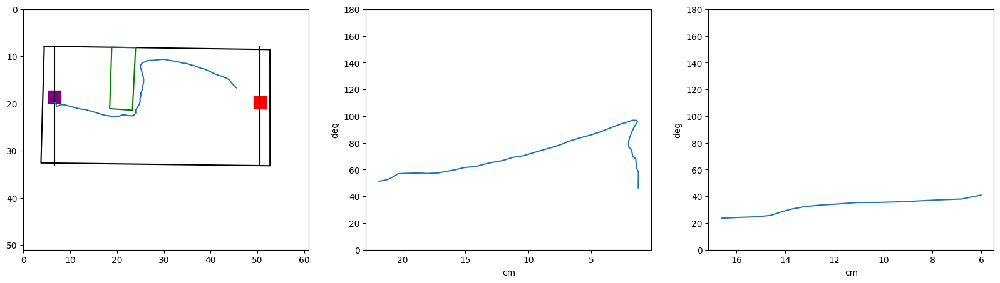

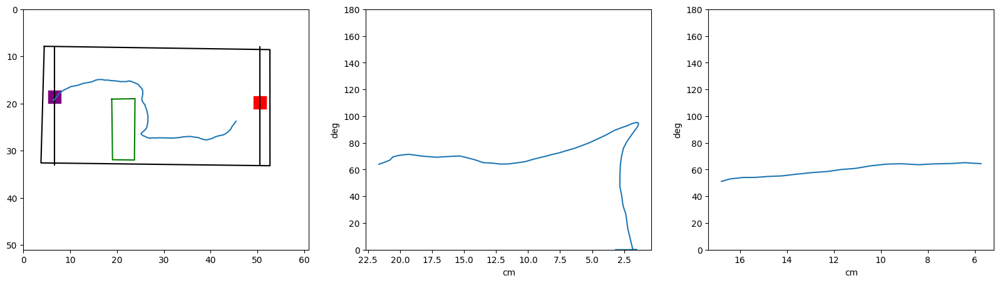

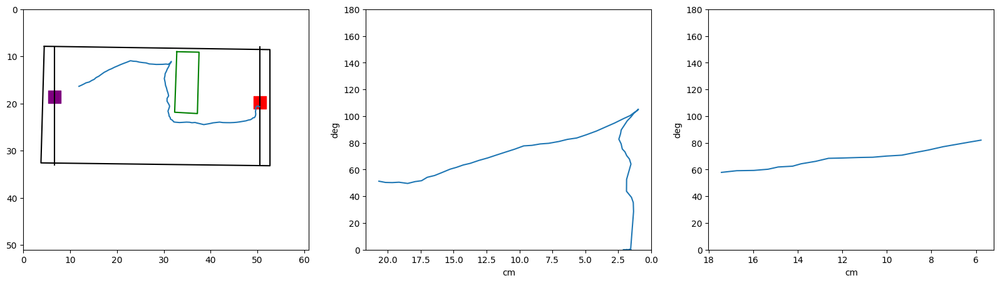

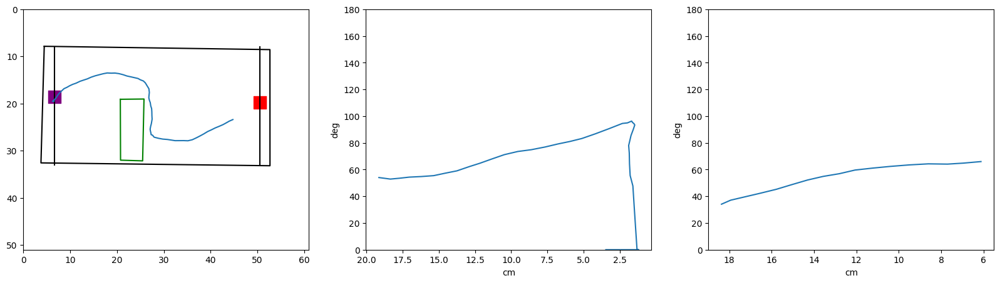

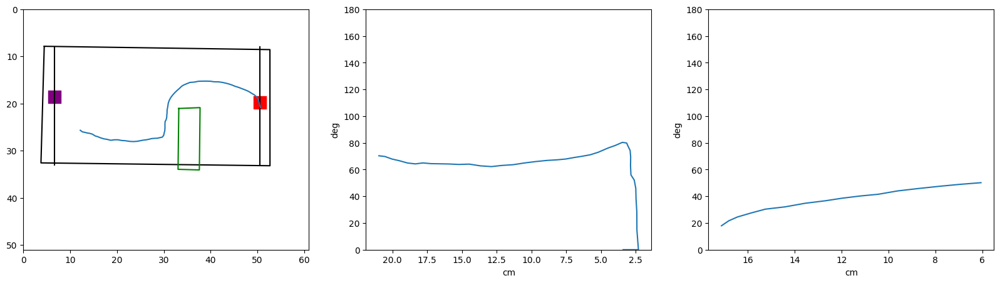

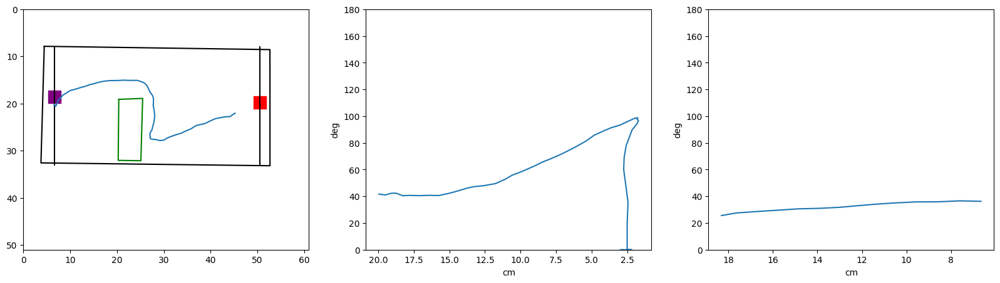

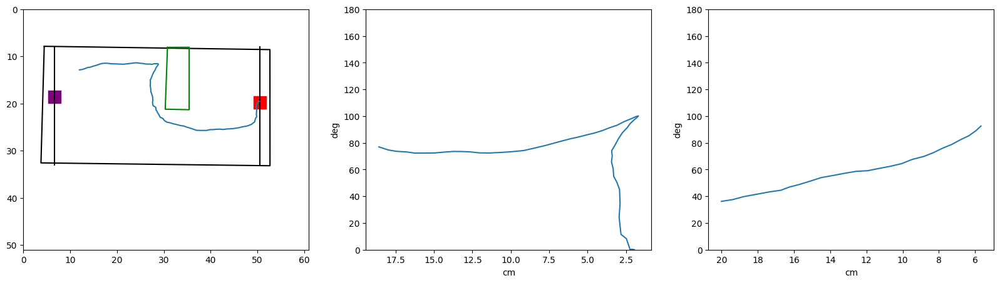

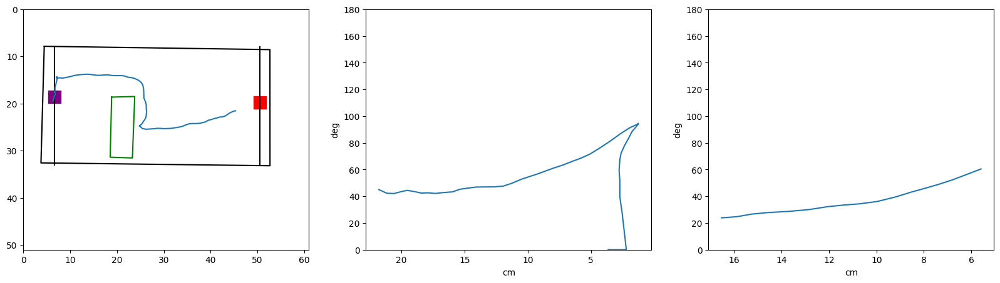

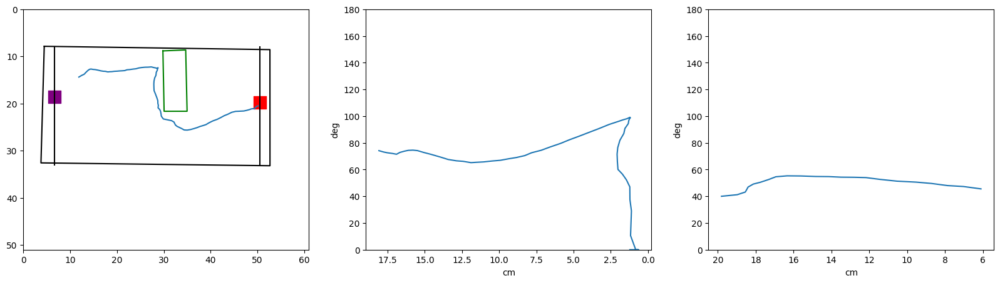

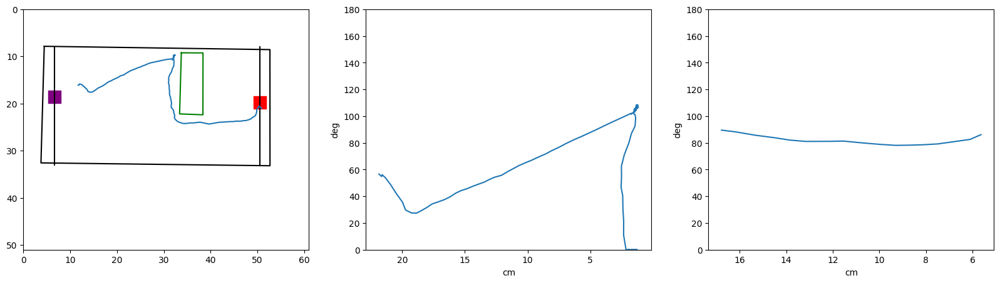

In [293]:
df = dark_long.sample(10)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
    axs[1].set_ylabel('deg')
    axs[1].set_xlabel('cm')
    axs[1].invert_xaxis()
    axs[1].set_ylim(0,180)
    length = np.argwhere(row['distance_from_edge']>1).max()
    axs[1].plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length])

    axs[2].set_ylabel('deg')
    axs[2].set_xlabel('cm')
    axs[2].invert_xaxis()
    axs[2].set_ylim(0,180)
    length = np.argwhere(row['distance_from_target_port']>5).max()
    start = np.argwhere(row['distance_from_edge']<0).min()
    
    axs[2].plot(row['distance_from_target_port'][start:length],row['angle_to_target_port'][start:length])

In [163]:
def get_head_angle(df):
    for ind, row in df.iterrows():
        leftear_x = interpolate_array(row['ts_leftear_x_cm'])
        leftear_y = interpolate_array(row['ts_leftear_y_cm'])
        rightear_x = interpolate_array(row['ts_rightear_x_cm'])
        rightear_y = interpolate_array(row['ts_rightear_y_cm'])
        nose_x = interpolate_array(row['ts_nose_x_cm'])
        nose_y = interpolate_array(row['ts_nose_y_cm'])
        angs = []
        for step in range(len(leftear_x)):
            ang = np.arctan2(np.mean([leftear_y[step],rightear_y[step]])-nose_y[step],np.mean([leftear_x[step],rightear_x[step]])-nose_x[step])
            angs.append(ang)
        df.at[ind, 'head_angle'] = np.array(angs).astype(object)


In [101]:
df.columns.to_numpy()

array(['level_0', 'index', 'first_poke', 'second_poke',
       'trial_timestamps', 'trial_vidframes', 'nose_x', 'nose_y',
       'leftear_x', 'leftear_y', 'rightear_x', 'rightear_y', 'spine_x',
       'spine_y', 'midspine_x', 'midspine_y', 'tailbase_x', 'tailbase_y',
       'midtail_x', 'midtail_y', 'tailend_x', 'tailend_y', 'arenaTL_x',
       'arenaTL_y', 'arenaTR_x', 'arenaTR_y', 'arenaBL_x', 'arenaBL_y',
       'arenaBR_x', 'arenaBR_y', 'obstacleTL_x', 'obstacleTL_y',
       'obstacleTR_x', 'obstacleTR_y', 'obstacleBR_x', 'obstacleBR_y',
       'obstacleBL_x', 'obstacleBL_y', 'leftportT_x', 'leftportT_y',
       'leftportB_x', 'leftportB_y', 'rightportT_x', 'rightportT_y',
       'rightportB_x', 'rightportB_y', 'len', 'animal', 'date', 'task',
       'condition', 'nose_x_cm', 'nose_y_cm', 'leftear_x_cm',
       'leftear_y_cm', 'rightear_x_cm', 'rightear_y_cm', 'spine_x_cm',
       'spine_y_cm', 'midspine_x_cm', 'midspine_y_cm', 'tailbase_x_cm',
       'tailbase_y_cm', 'midtail_x_cm

In [95]:
from scipy.fft import fft, fftfreq

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


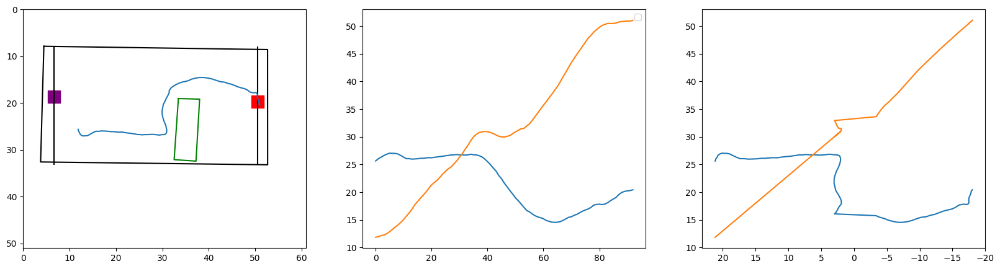

In [202]:
df = dark_long.sample(1)
get_head_angle(df)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   






    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
#axs[1].set_ylabel('deg')
#axs[1].set_xlabel('cm')
#axs[1].invert_xaxis()

#axs[2].set_ylabel('deg')
#axs[2].set_xlabel('cm')
axs[2].invert_xaxis()



length = np.argwhere(row['distance_from_edge']>1).max()
axs[1].plot(row['ts_nose_y_cm'])
axs[1].plot(row['ts_nose_x_cm'])
axs[1].legend()
axs[2].plot(row['distance_from_edge'],row['ts_nose_y_cm'])
axs[2].plot(row['distance_from_edge'],row['ts_nose_x_cm'])

In [212]:
def calculate_angular_velocity(angles, frame_rate):
    # Convert angles to radians if they are given in degrees
    angles = np.deg2rad(angles)

    # Calculate angular velocity using NumPy's array operations
    angular_displacements = np.diff(angles)
    angular_velocities = angular_displacements / (1 / frame_rate)

    return angular_velocities

In [9]:
df = light_long.sample(1)
get_head_angle(df)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
#axs[1].set_ylabel('deg')
#axs[1].set_xlabel('cm')
#axs[1].invert_xaxis()

#xs[2].set_ylabel('deg')
#axs[2].set_xlabel('cm')
#axs[2].invert_xaxis()

ang_v = calculate_angular_velocity(row['head_angle'].astype(float),60)

length = np.argwhere(row['distance_from_edge']>1).max()
axs[1].plot(row['head_angle'].astype(float))
#axs[2].plot(row['distance_from_edge'],row['head_angle'])
#axs[2].plot(fft(ang_v),c='red')
axs[2].plot(ang_v)
#xs[2].plot(row['distance_from_edge'][:length],fft(row['zero_out_angle_to_corner'][:length]))

NameError: name 'light_long' is not defined

In [252]:
df.columns.to_numpy()

array(['level_0', 'index', 'first_poke', 'second_poke',
       'trial_timestamps', 'trial_vidframes', 'nose_x', 'nose_y',
       'leftear_x', 'leftear_y', 'rightear_x', 'rightear_y', 'spine_x',
       'spine_y', 'midspine_x', 'midspine_y', 'tailbase_x', 'tailbase_y',
       'midtail_x', 'midtail_y', 'tailend_x', 'tailend_y', 'arenaTL_x',
       'arenaTL_y', 'arenaTR_x', 'arenaTR_y', 'arenaBL_x', 'arenaBL_y',
       'arenaBR_x', 'arenaBR_y', 'obstacleTL_x', 'obstacleTL_y',
       'obstacleTR_x', 'obstacleTR_y', 'obstacleBR_x', 'obstacleBR_y',
       'obstacleBL_x', 'obstacleBL_y', 'leftportT_x', 'leftportT_y',
       'leftportB_x', 'leftportB_y', 'rightportT_x', 'rightportT_y',
       'rightportB_x', 'rightportB_y', 'len', 'animal', 'date', 'task',
       'condition', 'nose_x_cm', 'nose_y_cm', 'leftear_x_cm',
       'leftear_y_cm', 'rightear_x_cm', 'rightear_y_cm', 'spine_x_cm',
       'spine_y_cm', 'midspine_x_cm', 'midspine_y_cm', 'tailbase_x_cm',
       'tailbase_y_cm', 'midtail_x_cm

In [262]:
len(row['distance_from_edge'])

82

IndexError: index 83 is out of bounds for axis 0 with size 81

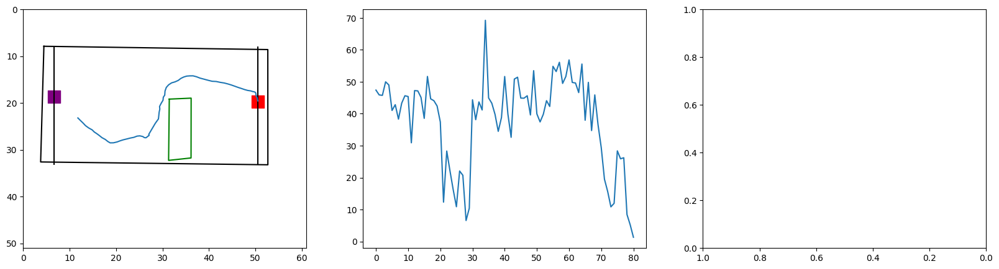

In [258]:
df = dark_long.sample(1)
get_head_angle(df)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
#axs[1].set_ylabel('deg')
#axs[1].set_xlabel('cm')
#axs[1].invert_xaxis()

#xs[2].set_ylabel('deg')
#axs[2].set_xlabel('cm')
axs[2].invert_xaxis()

ang_v = calculate_angular_velocity(row['head_angle'].astype(float),60)

length = np.argwhere(row['distance_from_edge']>1).max()
axs[1].plot(row['speed'].astype(float))
#axs[2].plot(row['distance_from_edge'],row['head_angle'])
#axs[2].plot(fft(ang_v),c='red')
#axs[2].plot(ang_v)
inds = row.ts_inds.tolist()
axs[2].plot(row['distance_from_edge'],row['speed'][inds])


In [225]:
ang_v

array([ 0.0137186 , -0.05510434, -0.0389818 , -0.04335593, -0.1021845 ,
        0.03942666, -0.0126608 , -0.01474115,  0.06105589, -0.04635946,
       -0.00376236, -0.02964787,  0.00624943, -0.0937198 ,  0.00863707,
       -0.08038149, -0.03519105, -0.11486451, -0.04735774, -0.06223834,
       -0.04572433, -0.0063082 , -0.04931443,  0.00786739, -0.02528012,
       -0.02922643, -0.06431784, -0.11116947,  0.04913938, -0.08839998,
        0.07376145, -0.04226704, -0.0848083 , -0.09243039, -0.09563884,
       -0.00037581,  0.02037592,  0.02270373, -0.09972007, -0.15357603,
       -0.02098373, -0.05400046, -0.15107082,  0.01418749, -0.06858045,
       -0.02379753,  0.01161785, -0.08121183, -0.0427002 ,  0.06153601,
       -0.09103445,  0.05181408,  0.06514245, -0.03446156,  0.07674558,
       -0.02839153, -0.06954205, -0.0517453 ,  0.06015785,  0.09844998,
        0.02723543,  0.13108874,  0.05318202,  0.12147039,  0.07786367,
        0.07060379,  0.13546071, -0.02335495, -0.04187244,  0.00

In [211]:
np.deg2rad(row['head_angle'].astype(float))

array([ 1.72148528e-02,  1.66804320e-02,  1.68810356e-02,  1.49518462e-02,
        1.46073793e-02,  1.33432910e-02,  1.19958488e-02,  1.14090055e-02,
        1.16332101e-02,  1.17744038e-02,  1.26128727e-02,  1.18983093e-02,
        1.18003403e-02,  1.08366486e-02,  1.13241370e-02,  1.18246409e-02,
        1.22647683e-02,  1.23797865e-02,  1.21132179e-02,  1.25145571e-02,
        1.31023454e-02,  1.33155577e-02,  1.36041597e-02,  1.31361280e-02,
        1.32927341e-02,  1.33044477e-02,  1.40160625e-02,  1.36101875e-02,
        1.37258061e-02,  1.33687217e-02,  1.33406683e-02,  1.33723947e-02,
        1.28389861e-02,  1.18734174e-02,  1.05731482e-02,  9.43953480e-03,
        8.37705363e-03,  7.26651828e-03,  7.04020215e-03,  5.45518763e-03,
        5.07431684e-03,  4.72175223e-03,  3.86417319e-03,  4.73254622e-03,
        4.85144738e-03,  5.47106190e-03,  4.76438613e-03,  3.56989467e-03,
        2.83522880e-03,  2.22235832e-03,  1.26086991e-03,  1.16288744e-03,
        2.04810941e-03,  

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


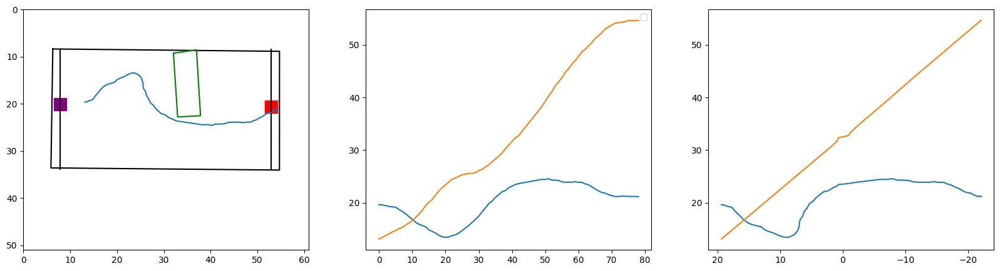

In [265]:
df = light_long.sample(1)
get_head_angle(df)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   






    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
#axs[1].set_ylabel('deg')
#axs[1].set_xlabel('cm')
#axs[1].invert_xaxis()

#axs[2].set_ylabel('deg')
#axs[2].set_xlabel('cm')
axs[2].invert_xaxis()



length = np.argwhere(row['distance_from_edge']>1).max()
axs[1].plot(row['ts_nose_y_cm'])
axs[1].plot(row['ts_nose_x_cm'])
axs[1].legend()
axs[2].plot(row['distance_from_edge'],row['ts_nose_y_cm'])
axs[2].plot(row['distance_from_edge'],row['ts_nose_x_cm'])

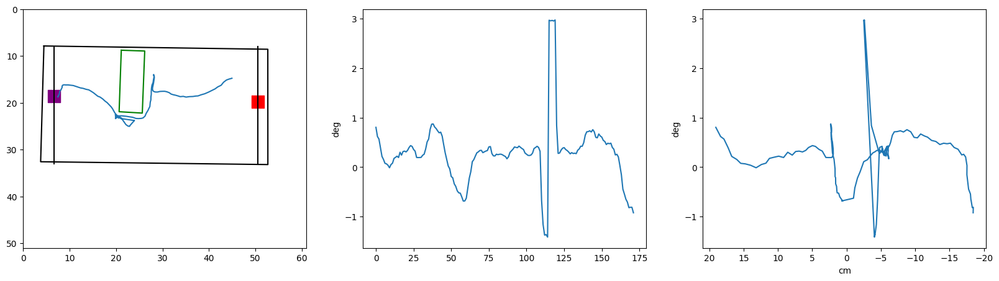

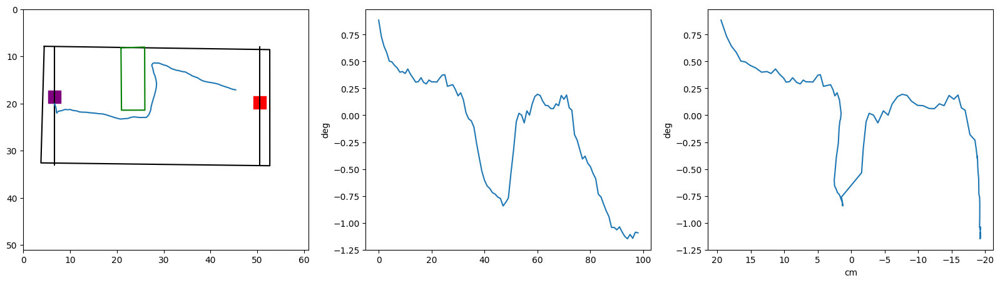

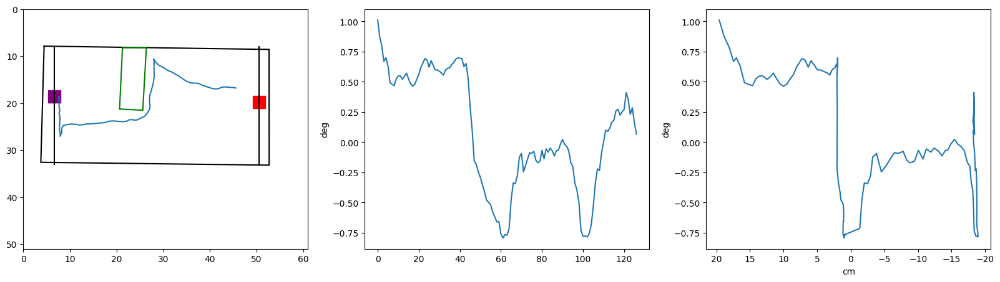

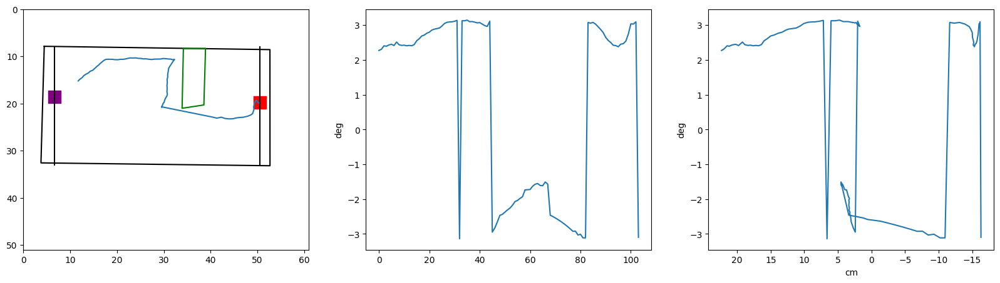

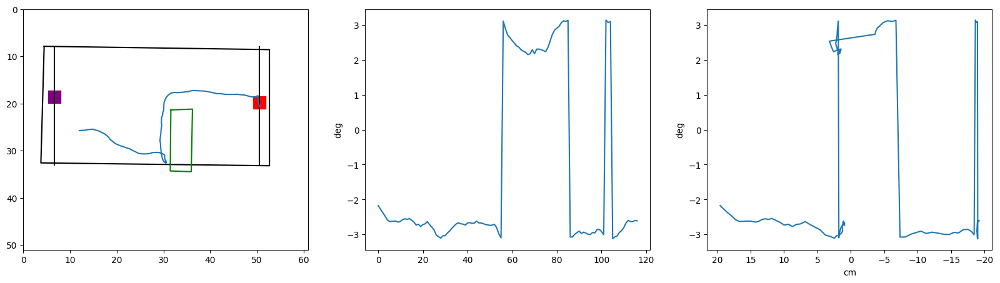

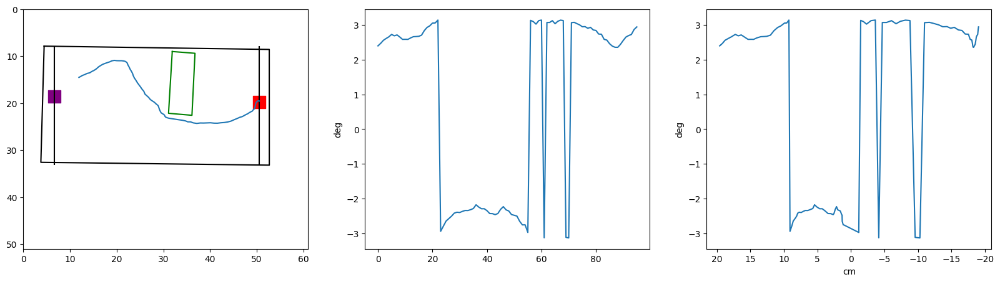

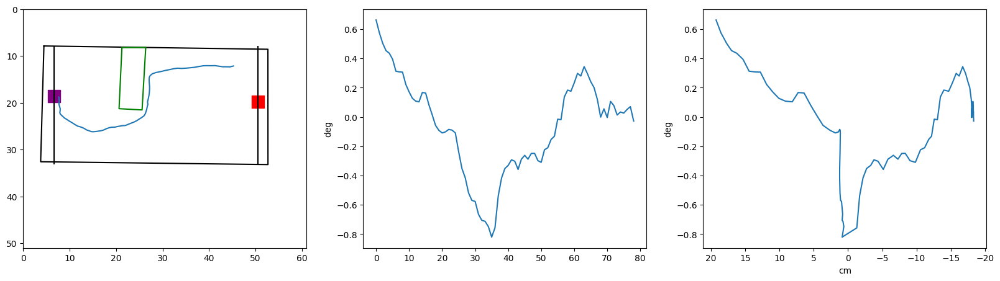

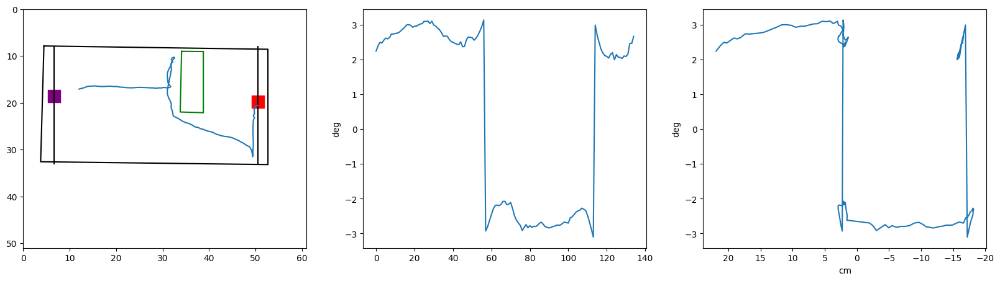

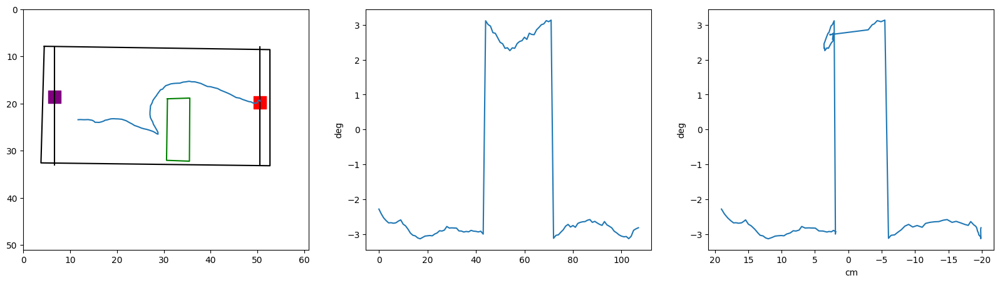

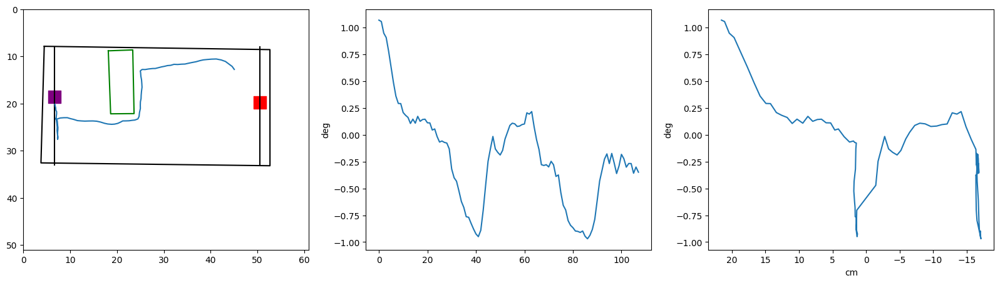

In [273]:
df = dark_long.sample(10)
get_head_angle(df)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   






    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
    axs[1].set_ylabel('deg')
    #axs[1].set_xlabel('cm')
    #axs[1].invert_xaxis()
    
    axs[2].set_ylabel('deg')
    axs[2].set_xlabel('cm')
    axs[2].invert_xaxis()
    
    
    
    length = np.argwhere(row['distance_from_edge']>1).max()
    axs[1].plot(row['head_angle'])
    axs[2].plot(row['distance_from_edge'],row['head_angle'])
#xs[2].plot(row['distance_from_edge'][:length],fft(row['zero_out_angle_to_corner'][:length]))

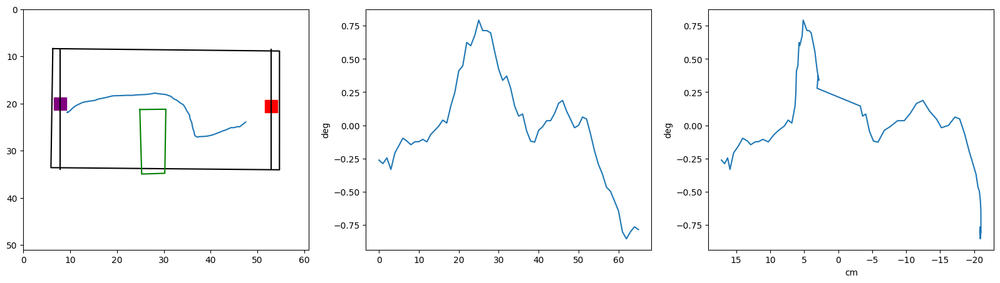

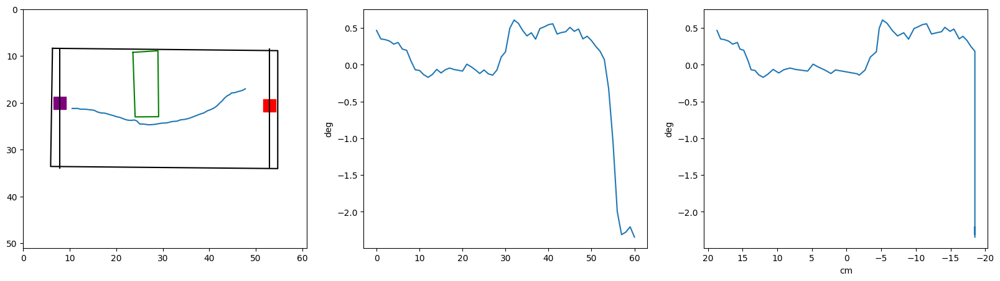

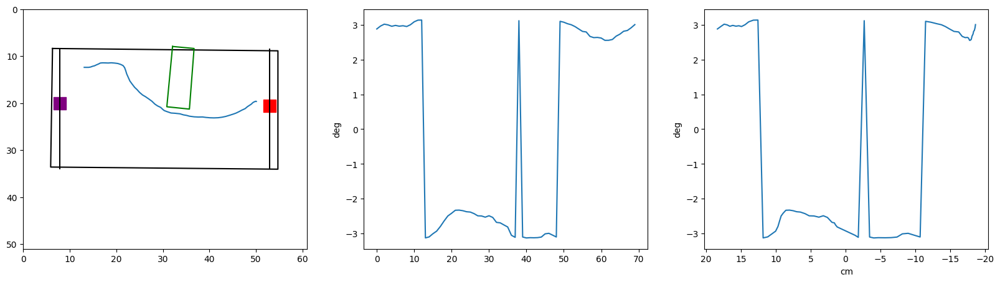

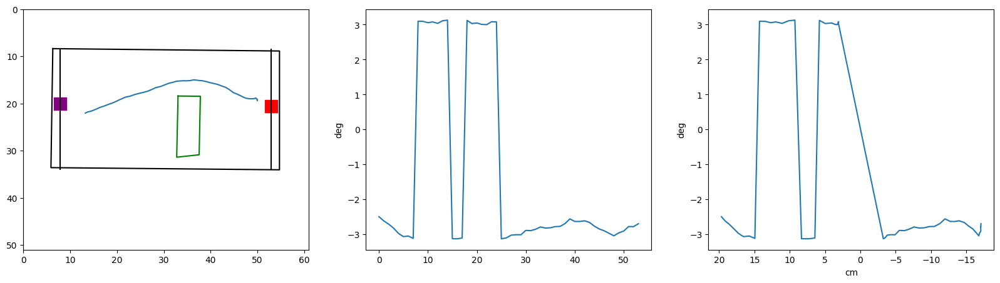

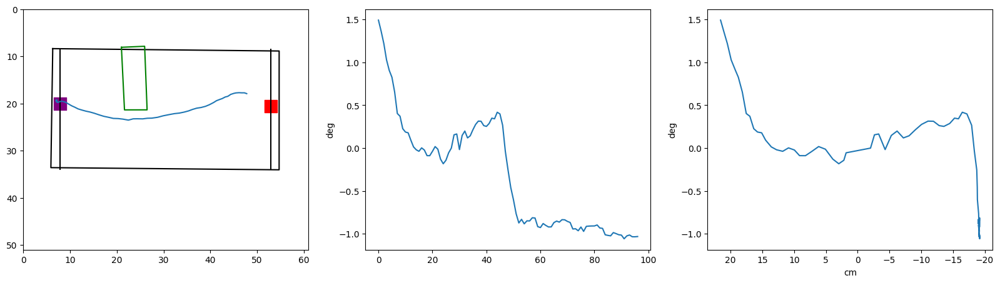

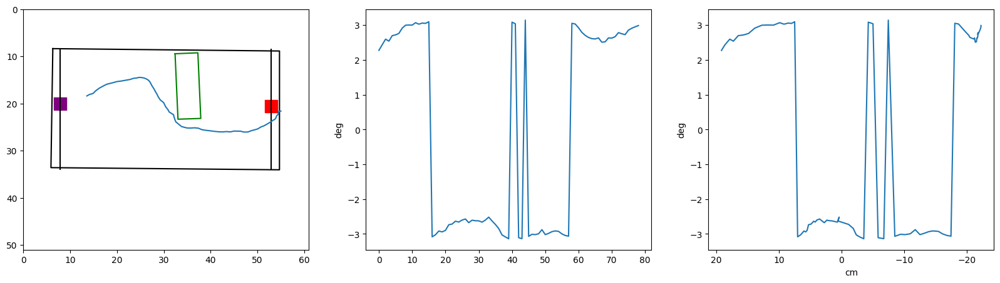

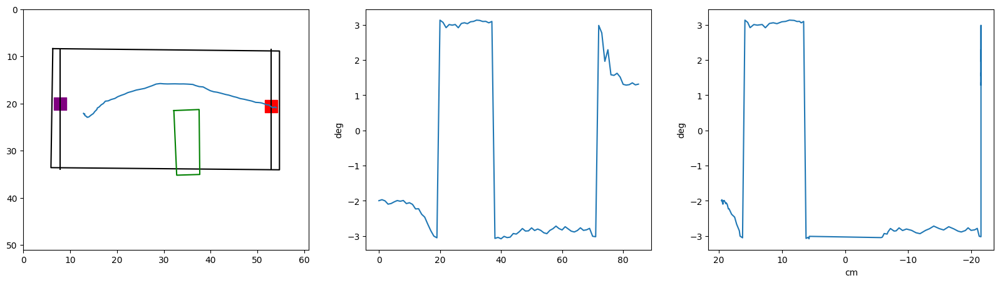

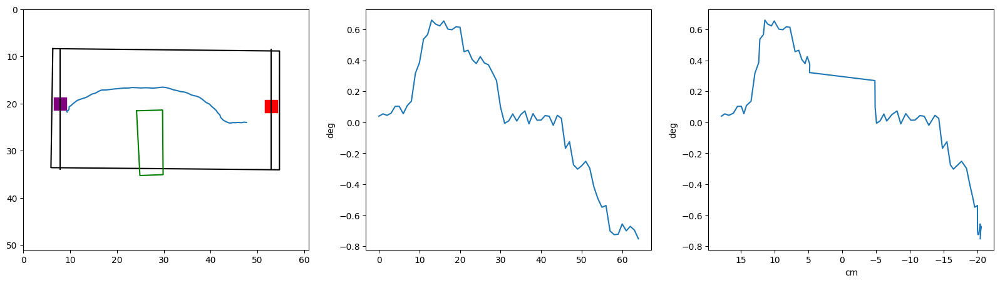

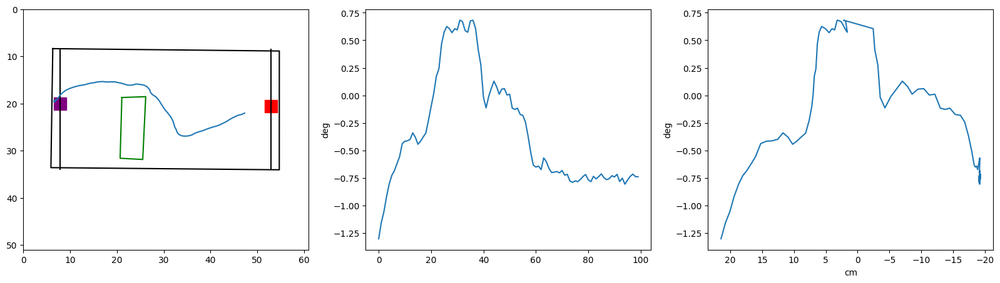

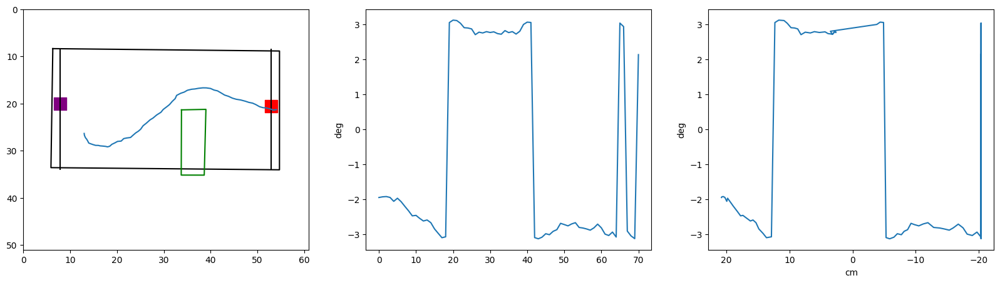

In [274]:
df = light_long.sample(10)
get_head_angle(df)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   






    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
    axs[1].set_ylabel('deg')
    #axs[1].set_xlabel('cm')
    #axs[1].invert_xaxis()
    
    axs[2].set_ylabel('deg')
    axs[2].set_xlabel('cm')
    axs[2].invert_xaxis()
    
    
    
    length = np.argwhere(row['distance_from_edge']>1).max()
    axs[1].plot(row['head_angle'])
    axs[2].plot(row['distance_from_edge'],row['head_angle'])
#xs[2].plot(row['distance_from_edge'][:length],fft(row['zero_out_angle_to_corner'][:length]))


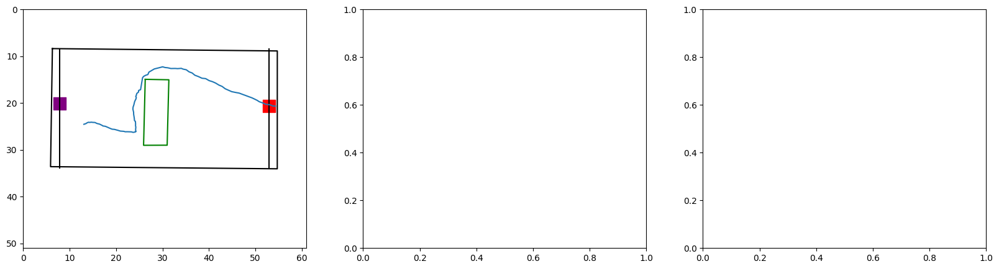

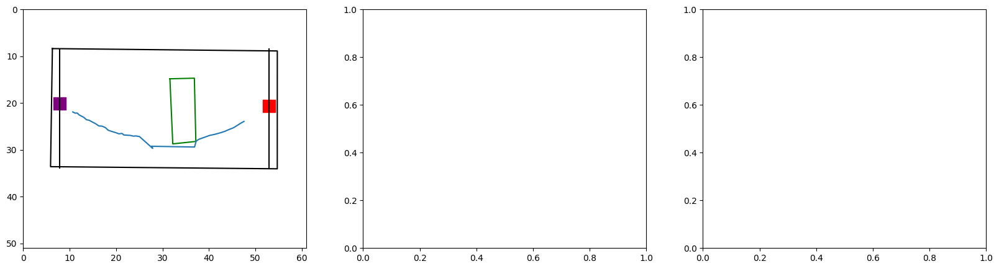

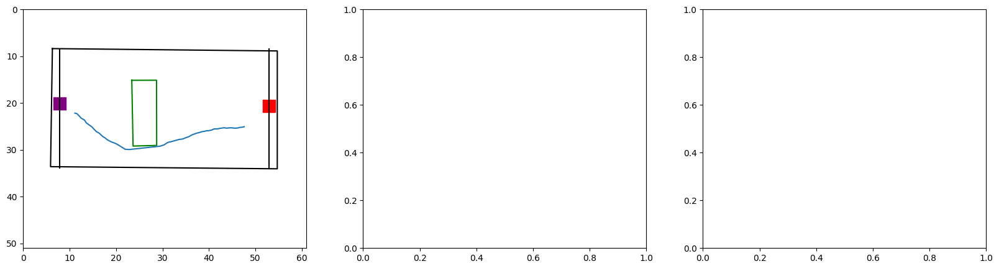

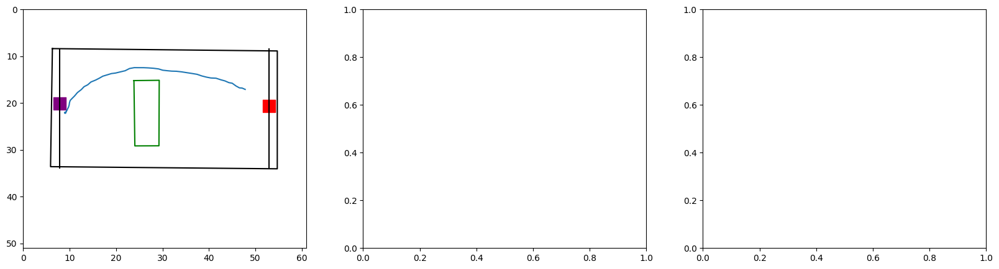

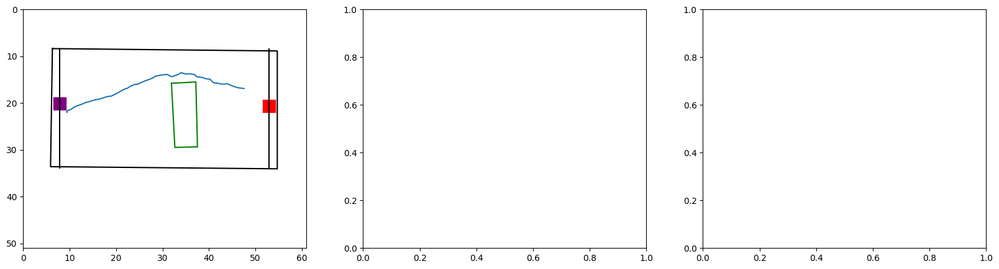

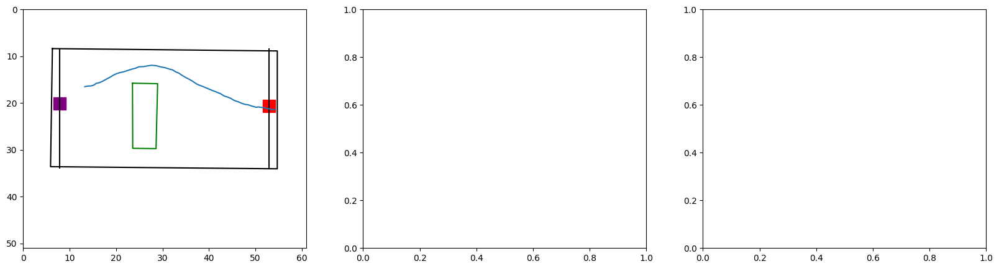

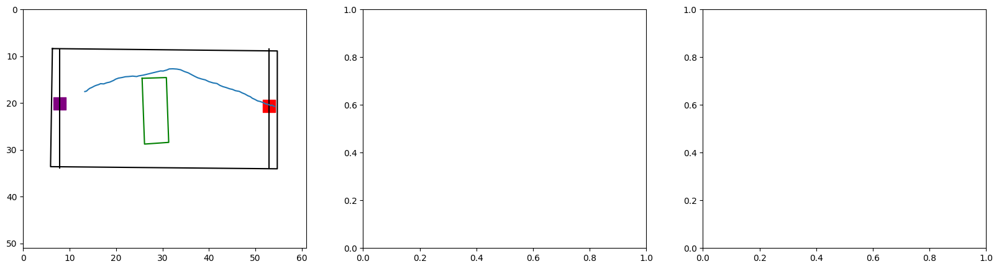

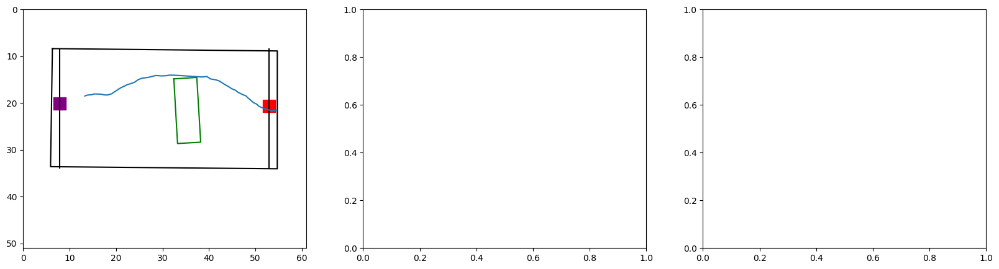

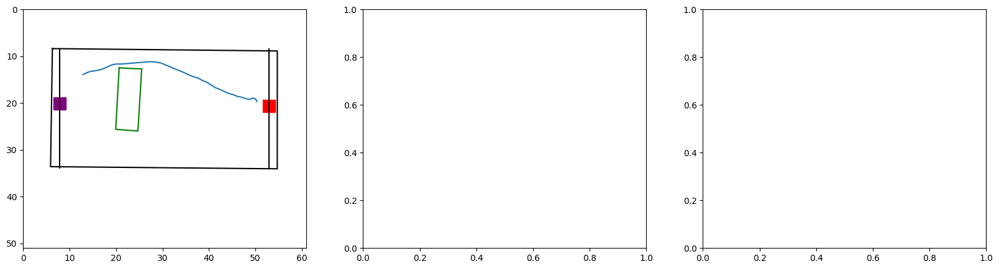

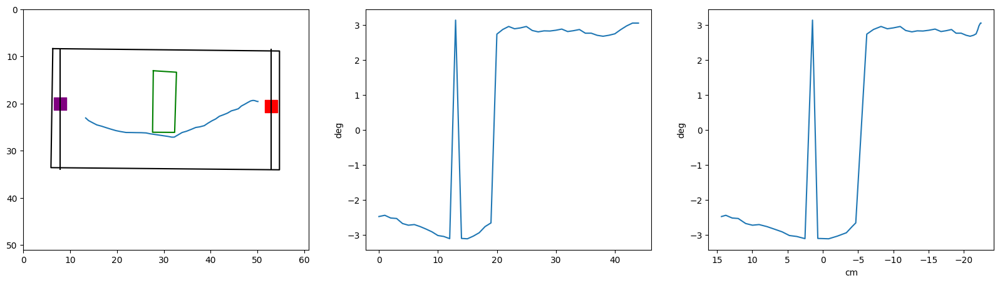

In [270]:
df = light_middle.sample(10)
get_head_angle(df)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=3, figsize =(20,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   






    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
axs[1].set_ylabel('deg')
#axs[1].set_xlabel('cm')
#axs[1].invert_xaxis()

axs[2].set_ylabel('deg')
axs[2].set_xlabel('cm')
axs[2].invert_xaxis()



length = np.argwhere(row['distance_from_edge']>1).max()
axs[1].plot(row['head_angle'])
axs[2].plot(row['distance_from_edge'],row['head_angle'])

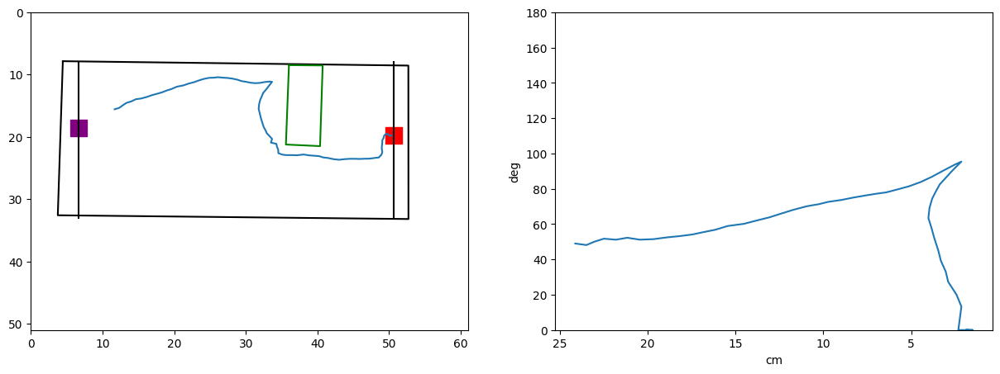

In [268]:
df = dark_long.sample(1)

for ind,row in df.iterrows():
    fig,axs = plt.subplots(nrows=1,ncols=2, figsize =(15,5))

    plot_arena(row,axs[0])

    axs[0].plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    axs[0].plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

    
axs[1].set_ylabel('deg')
axs[1].set_xlabel('cm')
axs[1].invert_xaxis()
axs[1].set_ylim(0,180)
length = np.argwhere(row['distance_from_edge']>1).max()
axs[1].plot(row['distance_from_edge'][:length],row['zero_out_angle_to_corner'][:length])

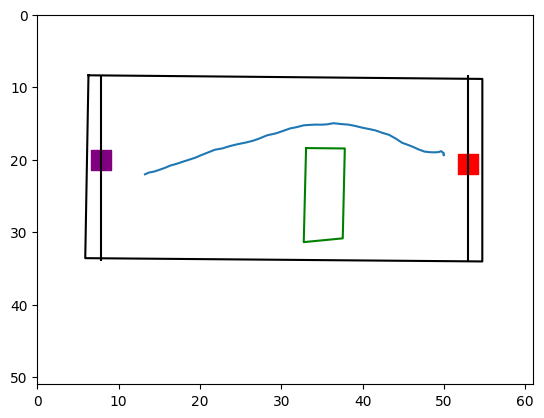

In [76]:
df = light_long.loc[[3458]]

for ind,row in df.iterrows():
    fig, ax= plt.subplots()

    plot_arena(row,ax)

    ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])



In [77]:
data.index

Int64Index([   81,   183,   204,   231,   263,   285,   392,   394,   414,
              416,
            ...
            31419, 31430, 31432, 31455, 31467, 31469, 31481, 31483, 31496,
            31498],
           dtype='int64', length=13730)

In [74]:
def drop_max_in_columns(df,column):
    copy =df.copy(deep=True) 
    nan_inds = copy.index[np.where(copy[column].max())[0]]
    print(copy[column].max())
    print(nan_inds[0])

    copy = copy.drop(index=nan_inds[0])
    return copy

<AxesSubplot: xlabel='linearity', ylabel='Density'>

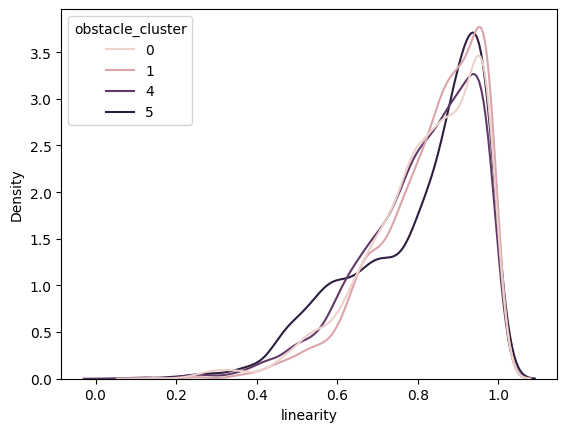

In [97]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.obstacle_cluster, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

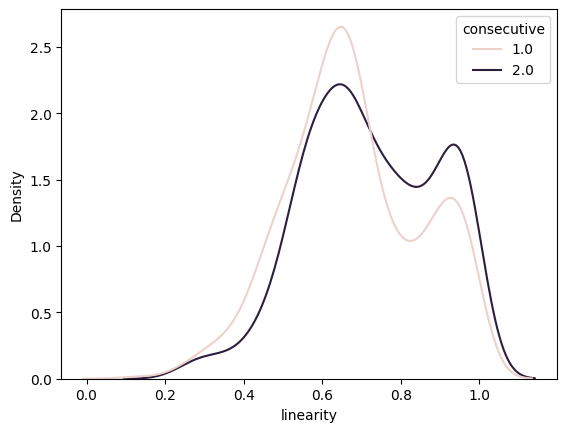

In [44]:
data = pd.concat([dark_long,dark_short])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.consecutive, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

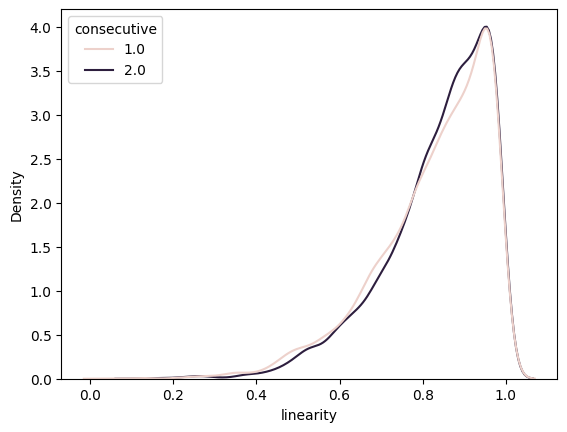

In [43]:
data = pd.concat([conditions_long,conditions_short])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.consecutive, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

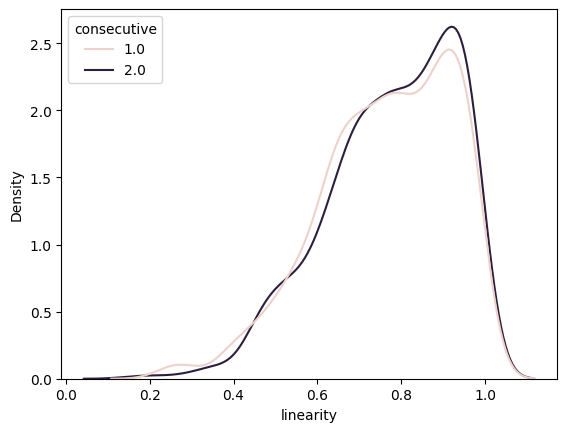

In [42]:
data = pd.concat([light_long,light_short])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.consecutive, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

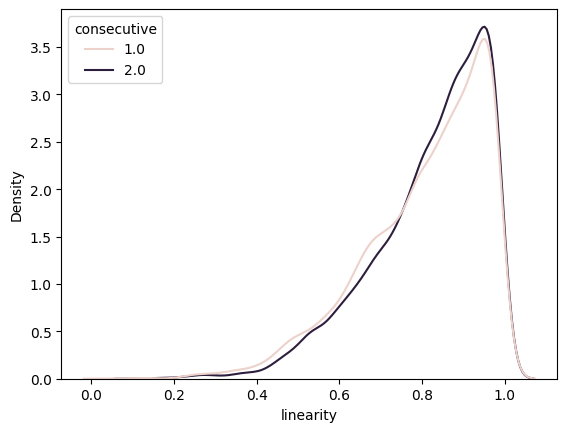

In [41]:
data = pd.concat([light_short,dark_short,dark_long,light_long,conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.consecutive, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='tortuosity', ylabel='Density'>

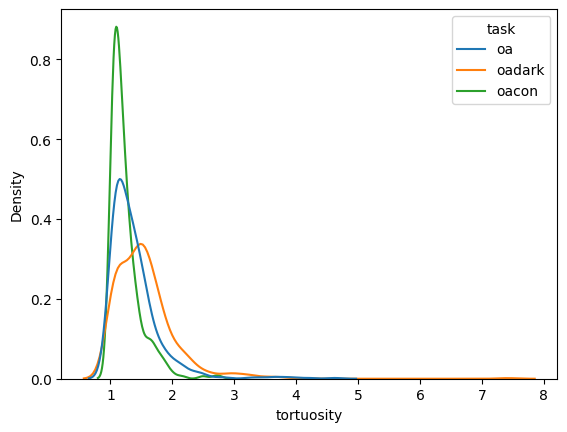

In [150]:
data = pd.concat([light_short.sample(300),dark_short.sample(300),dark_long.sample(300),light_long.sample(300),conditions_short.sample(300),conditions_long.sample(300)])
data = drop_nans_in_columns(data,'tortuosity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.tortuosity, data=data,ax = ax,common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

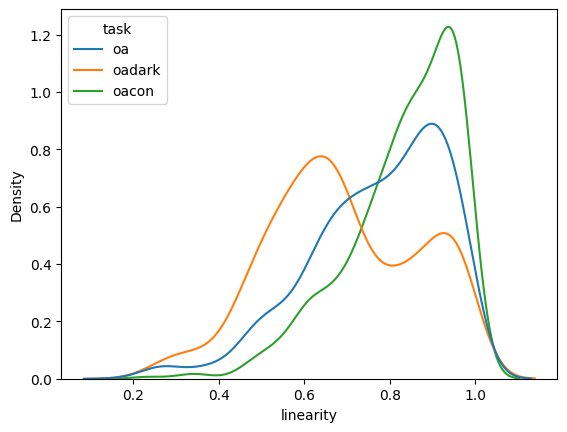

In [151]:
data = pd.concat([light_short.sample(300),dark_short.sample(300),dark_long.sample(300),light_long.sample(300),conditions_short.sample(300),conditions_long.sample(300)])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.linearity, data=data,ax = ax,common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

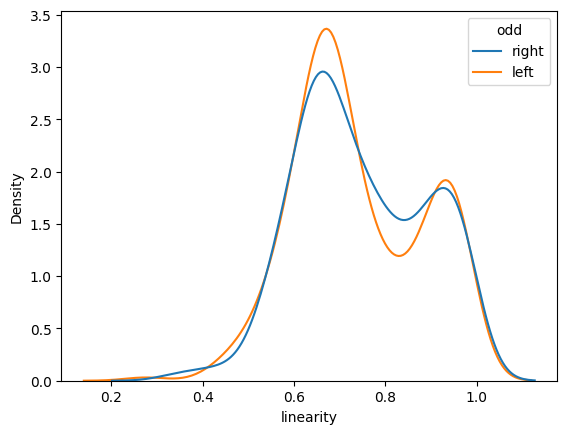

In [303]:
data = pd.concat([dark_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.odd, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

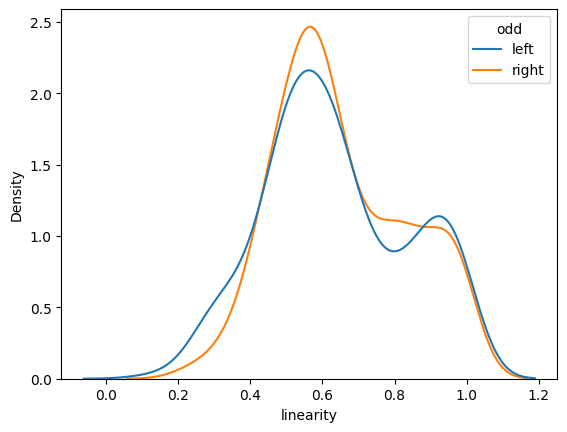

In [302]:
data = pd.concat([dark_short])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.odd, x=data.linearity, data=data,ax = ax,common_norm=False)

In [34]:
np.nanmean(first)

-6.290168218893787

In [38]:
data.lateral_error_prime

1       -4.118251
13      -5.508818
30      -7.314424
32      -6.905096
51      -7.052974
           ...   
31569   -4.791041
31571   -5.593267
31587   -4.713087
31602   -4.919766
31616   -6.290168
Name: lateral_error_prime, Length: 11031, dtype: float64

<AxesSubplot: xlabel='linearity', ylabel='Density'>

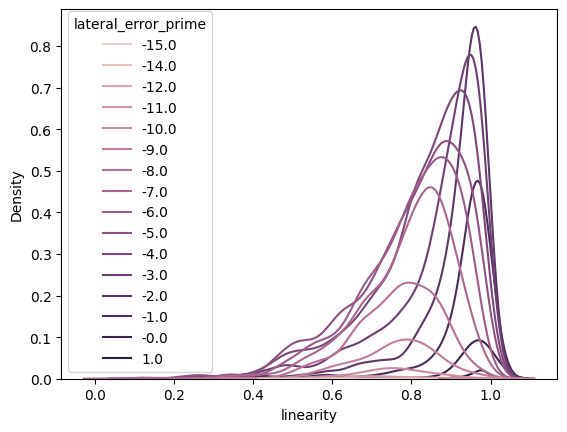

In [39]:
data = pd.concat([conditions_long,conditions_short])
for ind,row in data.iterrows():
    first = row.lateral_error[:10]
    data.at[ind,'lateral_error_prime'] = np.round(np.nanmean(first))
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue =data.lateral_error_prime, x=data.linearity, data=data,ax = ax,common_norm=True)

In [36]:
row.zero_out_angle_to_corner

array([72.36910193585474, 74.68053304830498, 76.91564258689613,
       78.93770377354923, 82.37322207450964, 83.87882384117505,
       86.06931095226153, 88.02021940765057, 91.70183497840793,
       94.9751608870372, 98.48498078132594, 101.77962419695989,
       105.4792802977771, 109.06181472426728, 110.80950670835941,
       112.7783894064226, 113.64654424248596, 113.10618431292178,
       112.06882838542435, 110.33957353653759, 107.48135223957186,
       104.14429345261838, 98.51436146006402, 93.51438664958526,
       86.125755379105, 77.90842006532144, 68.58081974700443,
       57.25161046390929, 43.12891147784975, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=object)

In [351]:
data.linearity[data.zero_out_angle_to_corner_prime=='3rd']

292    0.704964
Name: linearity, dtype: float64

<AxesSubplot: xlabel='linearity', ylabel='Density'>

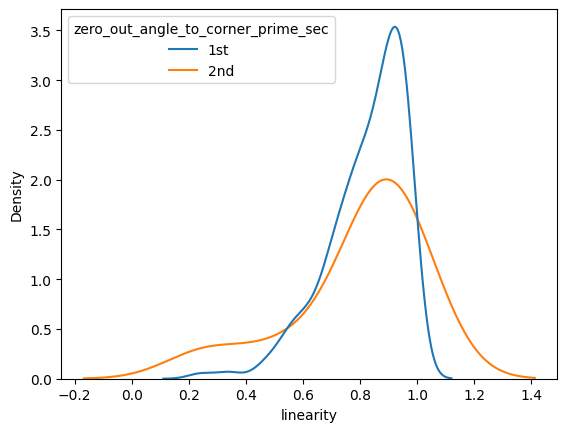

In [380]:
short = conditions_short.sample(200)
long = conditions_long.sample(200)
data = pd.concat([short,long])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[0]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.round(first)
for ind,row in data.iterrows():
   if(row.zero_out_angle_to_corner_prime>=90) and(row.zero_out_angle_to_corner_prime<=180):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '2nd'
      
   

   if (row.zero_out_angle_to_corner_prime<=90):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '1st'






#data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue =data.zero_out_angle_to_corner_prime_sec, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

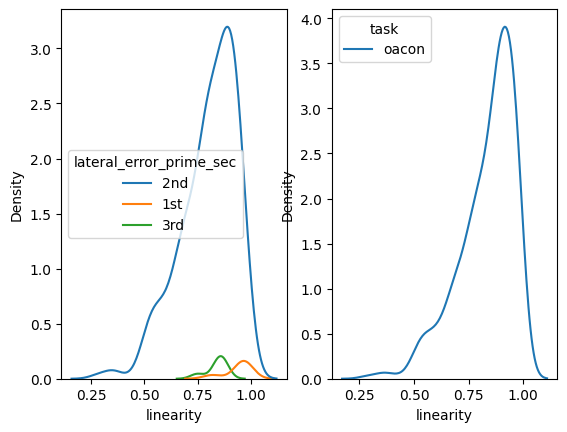

In [62]:
short = conditions_short.sample(200)
long = conditions_long.sample(200)
data = pd.concat([short,long])

for ind,row in data.iterrows():
    first = row.lateral_error[:10]
    data.at[ind,'lateral_error_prime'] = np.round(np.nanmean(first))
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
for ind,row in data.iterrows():

   if(row.lateral_error_prime<=-8) and(row.lateral_error_prime>=-12):
      data.at[ind,'lateral_error_prime_sec'] = '3rd'

   
   if(row.lateral_error_prime<=-4) and(row.lateral_error_prime>=-8):
      data.at[ind,'lateral_error_prime_sec'] = '2nd'
      
   

   if (row.lateral_error_prime>=0) and (row.lateral_error_prime>=-4):
      data.at[ind,'lateral_error_prime_sec'] = '1st'
fig,axs = plt.subplots(nrows=1,ncols=2)
sns.kdeplot(hue =data.lateral_error_prime_sec, x=data.linearity, data=data,ax = axs[0],common_norm=True)
sns.kdeplot(hue =data.task, x=data.linearity, data=data,ax = axs[1],common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

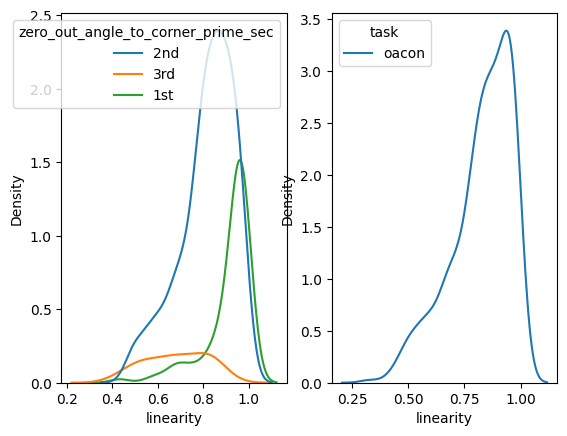

In [40]:
short = conditions_short.sample(200)
long = conditions_long.sample(200)
data = pd.concat([short,long])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[:10]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.nanmean(first)
for ind,row in data.iterrows():

   if(row.zero_out_angle_to_corner_prime>=80) and(row.zero_out_angle_to_corner_prime<=120):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '3rd'

   
   if(row.zero_out_angle_to_corner_prime>=40) and(row.zero_out_angle_to_corner_prime<=80):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '2nd'
      
   

   if (row.zero_out_angle_to_corner_prime<=40):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '1st'






#data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,axs = plt.subplots(nrows=1,ncols=2)
sns.kdeplot(hue =data.zero_out_angle_to_corner_prime_sec, x=data.linearity, data=data,ax = axs[0],common_norm=True)
sns.kdeplot(hue =data.task, x=data.linearity, data=data,ax = axs[1],common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

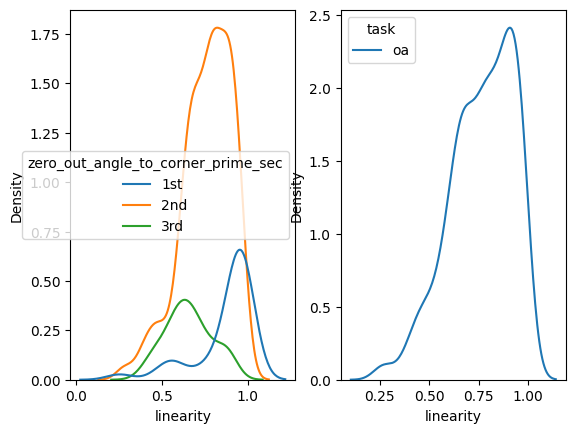

In [41]:
short = light_short.sample(200)
long = light_long.sample(200)
data = pd.concat([short,long])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[:10]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.nanmean(first)
for ind,row in data.iterrows():

   if(row.zero_out_angle_to_corner_prime>=80) and(row.zero_out_angle_to_corner_prime<=120):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '3rd'

   
   if(row.zero_out_angle_to_corner_prime>=40) and(row.zero_out_angle_to_corner_prime<=80):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '2nd'
      
   

   if (row.zero_out_angle_to_corner_prime<=40):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '1st'






#data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,axs = plt.subplots(nrows=1,ncols=2)
sns.kdeplot(hue =data.zero_out_angle_to_corner_prime_sec, x=data.linearity, data=data,ax = axs[0],common_norm=True)
sns.kdeplot(hue =data.task, x=data.linearity, data=data,ax = axs[1],common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

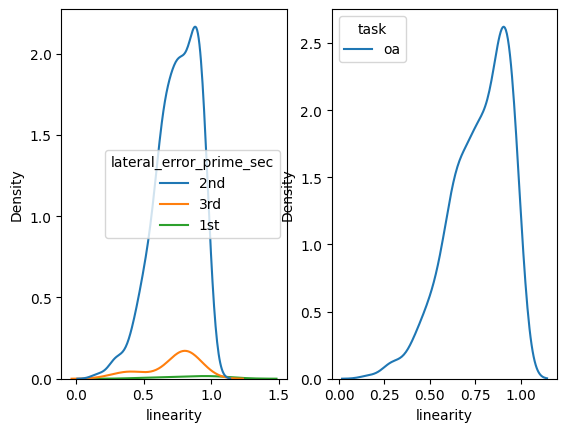

In [71]:
short = light_short.sample(200)
long = light_long.sample(200)
data = pd.concat([short,long])
for ind,row in data.iterrows():
    first = row.lateral_error[:10]
    data.at[ind,'lateral_error_prime'] = np.round(np.nanmean(first))
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
for ind,row in data.iterrows():

   if(row.lateral_error_prime<=-8) and(row.lateral_error_prime>=-12):
      data.at[ind,'lateral_error_prime_sec'] = '3rd'

   
   if(row.lateral_error_prime<=-4) and(row.lateral_error_prime>=-8):
      data.at[ind,'lateral_error_prime_sec'] = '2nd'
      
   

   if (row.lateral_error_prime>=0) and (row.lateral_error_prime>=-4):
      data.at[ind,'lateral_error_prime_sec'] = '1st'
fig,axs = plt.subplots(nrows=1,ncols=2)
sns.kdeplot(hue =data.lateral_error_prime_sec, x=data.linearity, data=data,ax = axs[0],common_norm=True)
sns.kdeplot(hue =data.task, x=data.linearity, data=data,ax = axs[1],common_norm=True)


<AxesSubplot: xlabel='linearity', ylabel='Density'>

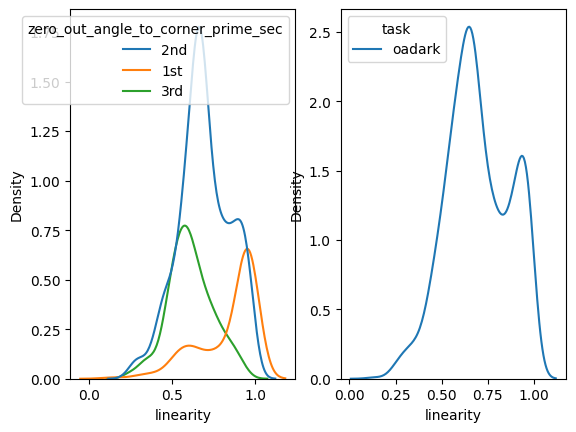

In [68]:
short = dark_short#.sample(200)
long = dark_long#.sample(200)
data = pd.concat([short,long])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[:10]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.nanmean(first)
for ind,row in data.iterrows():

   if(row.zero_out_angle_to_corner_prime>=80) and(row.zero_out_angle_to_corner_prime<=120):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '3rd'

   
   if(row.zero_out_angle_to_corner_prime>=40) and(row.zero_out_angle_to_corner_prime<=80):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '2nd'
      
   

   if (row.zero_out_angle_to_corner_prime<=40):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '1st'






#data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,axs = plt.subplots(nrows=1,ncols=2)
sns.kdeplot(hue =data.zero_out_angle_to_corner_prime_sec, x=data.linearity, data=data,ax = axs[0],common_norm=True)
sns.kdeplot(hue =data.task, x=data.linearity, data=data,ax = axs[1],common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

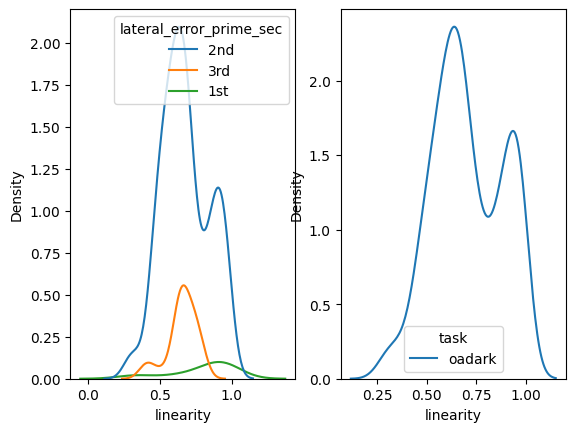

In [60]:
short = dark_short.sample(200)
long = dark_long.sample(200)
data = pd.concat([short,long])
for ind,row in data.iterrows():
    first = row.lateral_error[:10]
    data.at[ind,'lateral_error_prime'] = np.round(np.nanmean(first))
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
for ind,row in data.iterrows():

   if(row.lateral_error_prime<=-8) and(row.lateral_error_prime>=-12):
      data.at[ind,'lateral_error_prime_sec'] = '3rd'

   
   if(row.lateral_error_prime<=-4) and(row.lateral_error_prime>=-8):
      data.at[ind,'lateral_error_prime_sec'] = '2nd'
      
   

   if (row.lateral_error_prime>=0) and (row.lateral_error_prime>=-4):
      data.at[ind,'lateral_error_prime_sec'] = '1st'
fig,axs = plt.subplots(nrows=1,ncols=2)
sns.kdeplot(hue =data.lateral_error_prime_sec, x=data.linearity, data=data,ax = axs[0],common_norm=True)
sns.kdeplot(hue =data.task, x=data.linearity, data=data,ax = axs[1],common_norm=True)

<AxesSubplot: >

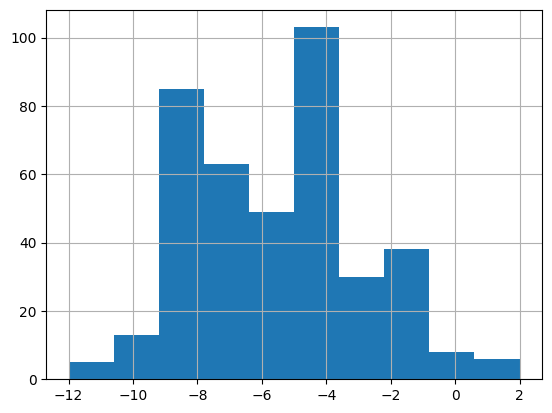

In [47]:
data.lateral_error_prime.hist()

<AxesSubplot: xlabel='linearity', ylabel='Density'>

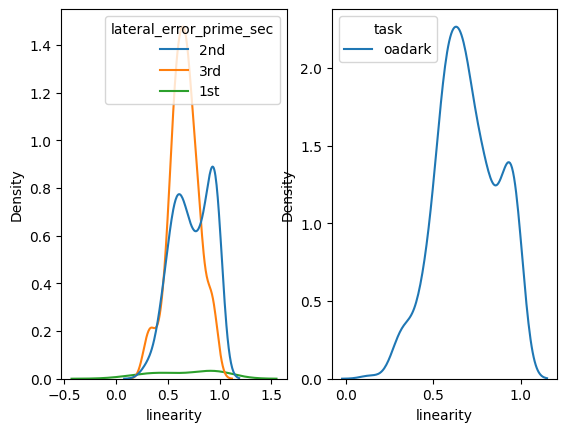

In [48]:
short = dark_short.sample(200)
long = dark_long.sample(200)
data = pd.concat([short,long])
for ind,row in data.iterrows():
    first = row.lateral_error[:10]
    data.at[ind,'lateral_error_prime'] = np.round(np.nanmean(first))
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
for ind,row in data.iterrows():

   if(row.lateral_error_prime<=-5) and(row.lateral_error_prime>=-12):
      data.at[ind,'lateral_error_prime_sec'] = '3rd'

   
   if(row.lateral_error_prime<=0) and(row.lateral_error_prime>=-5):
      data.at[ind,'lateral_error_prime_sec'] = '2nd'
      
   

   if (row.lateral_error_prime>=0):
      data.at[ind,'lateral_error_prime_sec'] = '1st'
fig,axs = plt.subplots(nrows=1,ncols=2)
sns.kdeplot(hue =data.lateral_error_prime_sec, x=data.linearity, data=data,ax = axs[0],common_norm=True)
sns.kdeplot(hue =data.task, x=data.linearity, data=data,ax = axs[1],common_norm=True)

In [394]:
pd.value_counts(data.zero_out_angle_to_corner_prime_sec)

2nd    308
1st     60
3rd     29
Name: zero_out_angle_to_corner_prime_sec, dtype: int64

(array([  6.,   8.,  65., 146., 104.,  56.,  11.,   1.,   2.,   1.]),
 array([  0. ,  14.6,  29.2,  43.8,  58.4,  73. ,  87.6, 102.2, 116.8,
        131.4, 146. ]),
 <BarContainer object of 10 artists>)

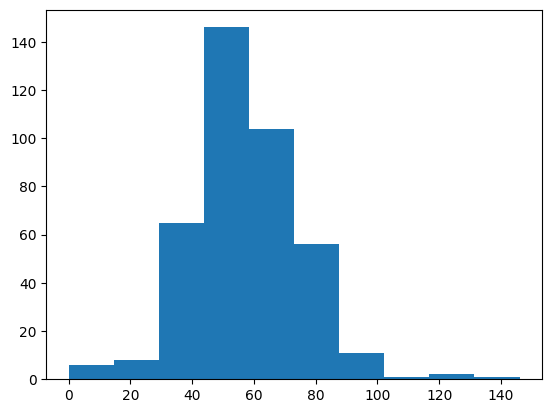

In [381]:
plt.hist(data.zero_out_angle_to_corner_prime)

In [382]:
data.zero_out_angle_to_corner_prime

29525    47.0
27734    47.0
29763    39.0
10287    82.0
30141    38.0
         ... 
14703    10.0
20023    51.0
25001    45.0
3878     59.0
23061    68.0
Name: zero_out_angle_to_corner_prime, Length: 400, dtype: float64

In [384]:
pd.value_counts(data.zero_out_angle_to_corner_prime_sec)

1st    390
2nd     10
Name: zero_out_angle_to_corner_prime_sec, dtype: int64

<AxesSubplot: xlabel='linearity', ylabel='Density'>

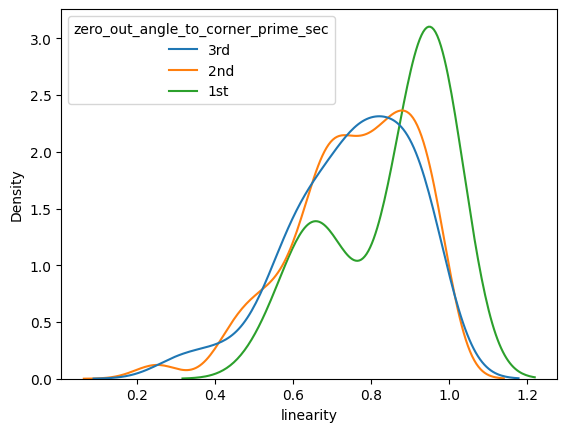

In [391]:
short = light_short.sample(200)
long = light_long.sample(200)
data = pd.concat([short,long])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[0]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.round(first)
for ind,row in data.iterrows():

   if(row.zero_out_angle_to_corner_prime>=80) and(row.zero_out_angle_to_corner_prime<=120):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '3rd'

   
   if(row.zero_out_angle_to_corner_prime>=40) and(row.zero_out_angle_to_corner_prime<=80):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '2nd'
      
   

   if (row.zero_out_angle_to_corner_prime<=40):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '1st'






#data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue =data.zero_out_angle_to_corner_prime_sec, x=data.linearity, data=data,ax = ax,common_norm=False)

In [392]:
pd.value_counts(data.zero_out_angle_to_corner_prime_sec)


2nd    303
3rd     65
1st     32
Name: zero_out_angle_to_corner_prime_sec, dtype: int64

(array([ 21.,  21.,  69., 194., 376., 486., 310., 131.,  29.,  12.]),
 array([  0. ,  11.9,  23.8,  35.7,  47.6,  59.5,  71.4,  83.3,  95.2,
        107.1, 119. ]),
 <BarContainer object of 10 artists>)

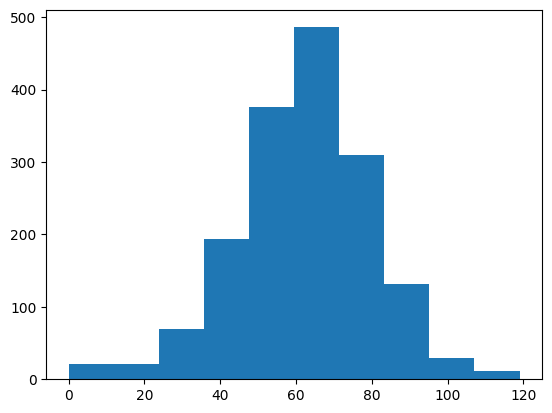

In [377]:
plt.hist(data.zero_out_angle_to_corner_prime)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

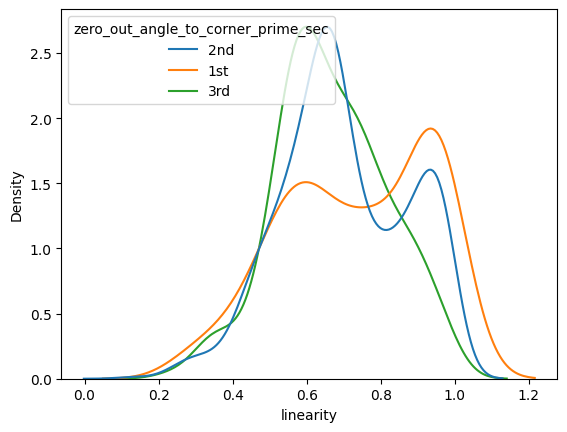

In [411]:
short = dark_short#.sample(300)
long = dark_long#.sample(300)
data = pd.concat([short,long])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[0]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.round(first)
for ind,row in data.iterrows():

   if(row.zero_out_angle_to_corner_prime>=80) and(row.zero_out_angle_to_corner_prime<=120):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '3rd'

   
   if(row.zero_out_angle_to_corner_prime>=40) and(row.zero_out_angle_to_corner_prime<=80):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '2nd'
      
   

   if (row.zero_out_angle_to_corner_prime<=40):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '1st'






#data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue =data.zero_out_angle_to_corner_prime_sec, x=data.linearity, data=data,ax = ax,common_norm=False)

In [415]:
pd.value_counts(data.zero_out_angle_to_corner_prime_sec)

2nd    727
3rd    203
1st    133
Name: zero_out_angle_to_corner_prime_sec, dtype: int64

In [464]:
df

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,linearity,lateral_error,consecutive,speed,distance,total_distance,wall,obstacle,zero_out_angle_to_corner_prime,zero_out_angle_to_corner_prime_sec
13765,3,4,59785.828940,59788.717056,"[59785.833216, 59785.848972, 59785.865676, 597...","[1357, 1358, 1359, 1360, 1361, 1362, 1363, 136...","[75.88709259033203, 75.35980224609375, 74.6782...","[257.4499816894531, 258.46173095703125, 258.42...","[96.9059829711914, 95.89015197753906, 95.45100...","[251.45339965820312, 251.84767150878906, 252.5...",...,0.942711,"[-9.538292358412459, -9.393924163276253, -9.21...",1.0,"[28.359797796406664, 34.89990946303063, 34.632...","[0.5668810214733071, 0.7319013475194058, 0.763...",58.596612,black,white,85.0,3rd
2410,0,0,60599.266329,60601.244838,"[60599.272806, 60599.289484, 60599.306611, 605...","[74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 8...","[510.54022216796875, 516.3648681640625, 481.84...","[323.56634521484375, 314.8669128417969, 344.26...","[496.0084228515625, 502.12890625, 492.85583496...","[330.6748352050781, 319.7546081542969, 341.310...",...,0.424176,"[-5.021321338098019, -4.3803180087540845, -6.5...",1.0,"[46.25341477481184, 195.06938110648625, 49.007...","[1.0701827649256934, 4.709755339302429, 1.1060...",37.910520,white,black,120.0,3rd
21887,82,87,60712.974540,60715.411814,"[60712.98848, 60713.00471, 60713.021747, 60713...","[[14373, 14374, 14375, 14376, 14377, 14378, 14...","[661.5677490234375, 662.0275268554688, 662.588...","[266.4740295410156, 266.21270751953125, 266.42...","[647.273681640625, 647.83642578125, 648.550659...","[258.22393798828125, 258.1615905761719, 258.17...",...,0.804109,"[-8.927965294362917, -8.71059344940111, -8.377...",2.0,"[30.211331440497208, 32.52372064661996, 24.795...","[0.6830630997103846, 0.7442600110826518, 0.566...",58.085345,noise,black,85.0,3rd
27626,149,162,46150.220339,46154.197900,"[46150.22062, 46150.23735, 46150.255065, 46150...","[27015, 27016, 27017, 27018, 27019, 27020, 270...","[79.3809814453125, 78.80105590820312, 77.86711...","[263.9764709472656, 263.94586181640625, 262.90...","[86.45889282226562, 85.65165710449219, 84.4205...","[264.3135070800781, 264.30023193359375, 264.40...",...,0.736298,"[-7.589331536808398, -7.446729227110861, -7.40...",1.0,"[19.566209315202055, 9.754147684977777, 18.671...","[0.4341829240155377, 0.19697286998010632, 0.44...",65.370475,black,noise,82.0,3rd
19369,67,70,60089.634547,60091.719603,"[60089.635788, 60089.651468, 60089.668262, 600...","[8689, 8690, 8691, 8692, 8693, 8694, 8695, 869...","[88.50802612304688, 87.99345397949219, 87.3570...","[254.23306274414062, 254.10202026367188, 253.5...","[103.3448715209961, 101.61016845703125, 100.63...","[250.73228454589844, 250.4670867919922, 250.08...",...,0.981144,"[-10.361748380223894, -10.071330653408896, -9....",2.0,"[31.76004985718848, 30.652963693945203, 38.452...","[0.7647178697714647, 0.680077385114032, 0.9093...",55.200072,noise,white,89.0,3rd


In [465]:
test = df.loc[13765]
test.odd

'left'

In [466]:
test

level_0                                                                               3
index                                                                                 4
first_poke                                                                  59785.82894
second_poke                                                                59788.717056
trial_timestamps                      [59785.833216, 59785.848972, 59785.865676, 597...
                                                            ...                        
total_distance                                                                58.596612
wall                                                                              black
obstacle                                                                          white
zero_out_angle_to_corner_prime                                                     85.0
zero_out_angle_to_corner_prime_sec                                                  3rd
Name: 13765, Length: 200, dtype:

In [467]:
angle_to_open_corner(df)

In [469]:
df.angle_to_corner

13765    [85.25584456860615, 81.82558601389809, 78.1232...
2410     [120.24693707010663, 125.38678780840887, 66.55...
21887    [85.22424137098673, 81.31527470319423, 76.9304...
27626    [82.22449675322859, 79.70543756981148, 78.1652...
19369    [88.68646095247135, 83.74445406459586, 79.4505...
Name: angle_to_corner, dtype: object

In [453]:
df.zero_out_angle_to_corner.to_numpy()[0]

array([85.25584456860615, 81.82558601389809, 78.12324822569167,
       74.59857824168458, 72.80787853326758, 69.86695270127504,
       68.50464653335325, 67.352167692373, 66.02057377318205,
       63.74819762077654, 60.90241694925188, 58.12672904389733,
       55.88237044899117, 53.648621997691315, 52.549650492181414,
       51.943920621205706, 51.26527486234488, 50.94319927490616,
       50.87389332095628, 51.09180367416688, 51.02853549690564,
       51.29255403388074, 51.80566373701207, 50.604100433408355,
       49.75745798555951, 49.37885402310942, 48.722433531484924,
       48.356420220534154, 49.00726097361467, 49.82903944517624,
       49.71797567909082, 49.523397625270825, 48.72827602594939,
       47.747596605021386, 44.70909341502628, 37.37099152042969,
       34.30972980105735, 28.508727317471653, 22.03690632224459,
       15.950229779873988, 8.329174504332444, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0,

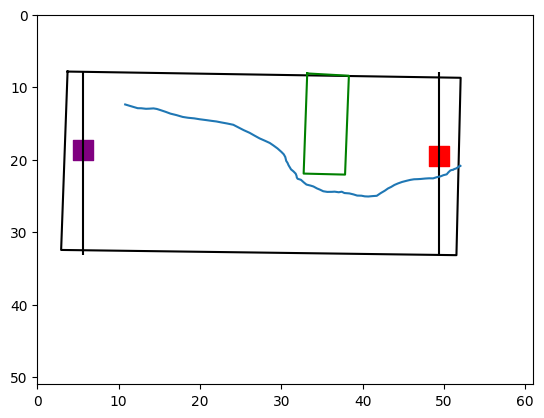

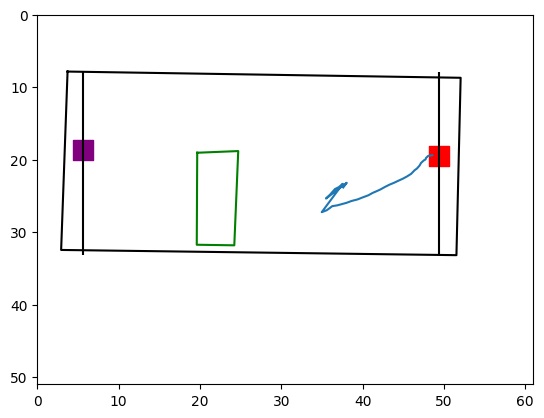

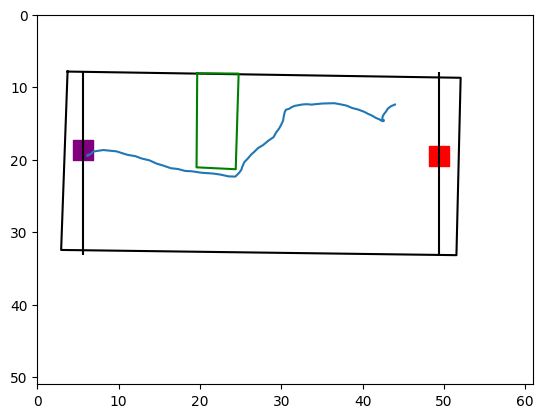

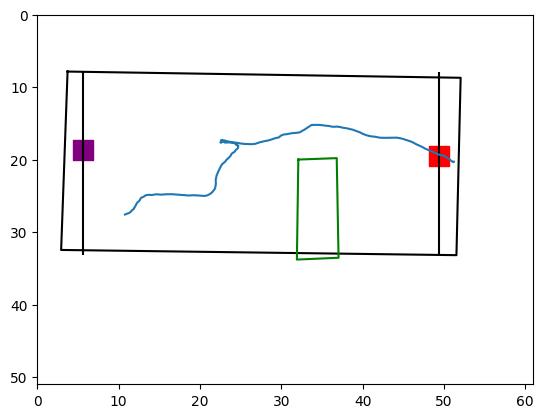

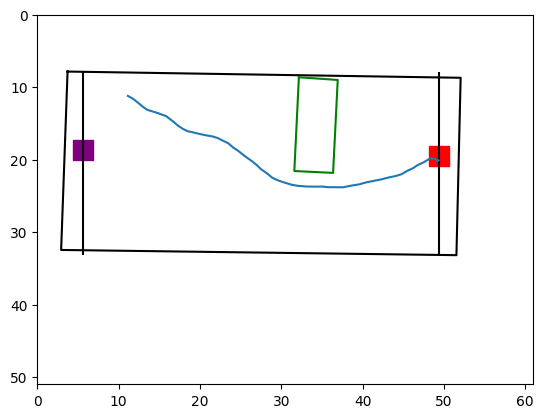

In [445]:
short = conditions_long#.sample(300)
long = conditions_long#.sample(300)
data = pd.concat([long])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[0]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.round(first)
for ind,row in data.iterrows():

   if(row.zero_out_angle_to_corner_prime>=80) and(row.zero_out_angle_to_corner_prime<=120):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '3rd'

   
   if(row.zero_out_angle_to_corner_prime>=40) and(row.zero_out_angle_to_corner_prime<=80):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '2nd'
      
   

   if (row.zero_out_angle_to_corner_prime<=40):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '1st'

df = data.loc[data.zero_out_angle_to_corner_prime_sec == '3rd'].sample(5)

for ind,row in df.iterrows():
    fig, ax= plt.subplots()

    plot_arena(row,ax)

    ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

In [474]:
row['ts_nose_x_cm']

array([10.801971302777115, 11.224484129114217, 11.7732236144383,
       12.346947895877973, 12.772494307570891, 13.361922701101657,
       13.784326371144815, 14.283194624854232, 14.691704258054198,
       15.148625307377316, 15.773925337944748, 16.372471280818957,
       17.116548952951614, 17.874237575275043, 18.533307684340834,
       19.304601259256465, 19.96131191304551, 20.796562679573185,
       21.413773149191773, 22.015351477902087, 22.665068931760555,
       23.361905919010578, 24.098235893312776, 24.733729442406798,
       25.369400520418438, 26.102110344224844, 26.711008142227843,
       27.322672032690516, 28.0218432853033, 28.586322868309882,
       29.04333508113124, 29.53865755456711, 30.017172357775333,
       30.305095473681895, 30.491517630458915, 30.608367643844304,
       30.765814202418422, 30.89534313917708, 31.07437145643917,
       31.19623786126704, 31.50010259416799, 31.770587092477523,
       31.874511081428633, 31.907987277597144, 32.0088572893573,
       3

In [496]:
test.linearity

0.9427114085283507

In [475]:
row=test 
nose_x = row['ts_nose_x_cm'].astype(float)
nose_y = row['ts_nose_y_cm'].astype(float)
ear_x = np.mean([row['rightear_x_cm'],row['leftear_x_cm']],axis=0)
ear_y = np.mean([row['rightear_y_cm'],row['leftear_y_cm']],axis=0)
corner_x = row['gt_obstacleBL_x_cm']
corner_y = row['gt_obstacleBL_y_cm']
degs = []
rads = []
for i in list(range(len(nose_x))):
    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
    rad,deg = angle_between_vectors(vector1,vector2)
    degs.append(deg)
    rads.append(rad)
degs = np.array(degs)

In [1]:
plt.scatter(ear_x[0],ear_y[0],c='red')
plt.scatter(nose_x[0],nose_y[0])
plt.ylim([51,0]); plt.xlim([0, 71])


NameError: name 'plt' is not defined

In [2]:
row = test
fig, ax= plt.subplots()

plot_arena(row,ax)
ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                            [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')

ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])
ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

NameError: name 'test' is not defined

In [488]:
row.odd

'left'

In [487]:
row['ts_nose_x_cm']

array([10.801971302777115, 11.224484129114217, 11.7732236144383,
       12.346947895877973, 12.772494307570891, 13.361922701101657,
       13.784326371144815, 14.283194624854232, 14.691704258054198,
       15.148625307377316, 15.773925337944748, 16.372471280818957,
       17.116548952951614, 17.874237575275043, 18.533307684340834,
       19.304601259256465, 19.96131191304551, 20.796562679573185,
       21.413773149191773, 22.015351477902087, 22.665068931760555,
       23.361905919010578, 24.098235893312776, 24.733729442406798,
       25.369400520418438, 26.102110344224844, 26.711008142227843,
       27.322672032690516, 28.0218432853033, 28.586322868309882,
       29.04333508113124, 29.53865755456711, 30.017172357775333,
       30.305095473681895, 30.491517630458915, 30.608367643844304,
       30.765814202418422, 30.89534313917708, 31.07437145643917,
       31.19623786126704, 31.50010259416799, 31.770587092477523,
       31.874511081428633, 31.907987277597144, 32.0088572893573,
       3

In [476]:
degs

array([ 85.25584457,  81.82558601,  78.12324823,  74.59857824,
        72.80787853,  69.8669527 ,  68.50464653,  67.35216769,
        66.02057377,  63.74819762,  60.90241695,  58.12672904,
        55.88237045,  53.648622  ,  52.54965049,  51.94392062,
        51.26527486,  50.94319927,  50.87389332,  51.09180367,
        51.0285355 ,  51.29255403,  51.80566374,  50.60410043,
        49.75745799,  49.37885402,  48.72243353,  48.35642022,
        49.00726097,  49.82903945,  49.71797568,  49.52339763,
        48.72827603,  47.74759661,  44.70909342,  37.37099152,
        34.3097298 ,  28.50872732,  22.03690632,  15.95022978,
         8.3291745 ,   6.62986396,  25.99804058,  39.59970778,
        52.05585288,  77.13341888, 101.16213066, 113.77363764,
       129.09959107, 136.28089667, 142.04043722, 146.0699116 ,
       149.69276346, 154.45478273, 159.94470945, 163.16647999,
       166.03347117, 169.04122184, 169.59514964, 172.07254378,
       173.20707143, 174.10215745, 175.72697269, 176.63

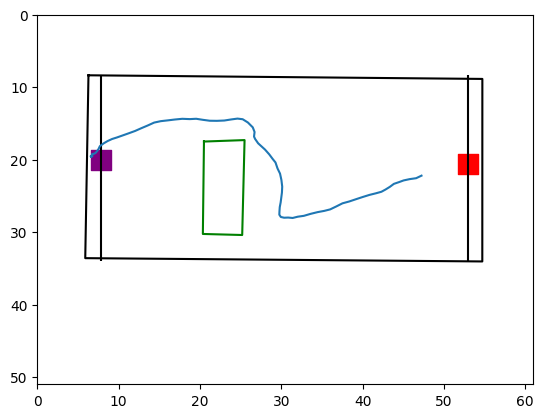

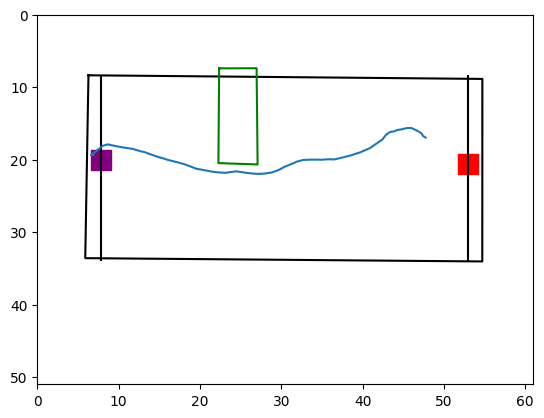

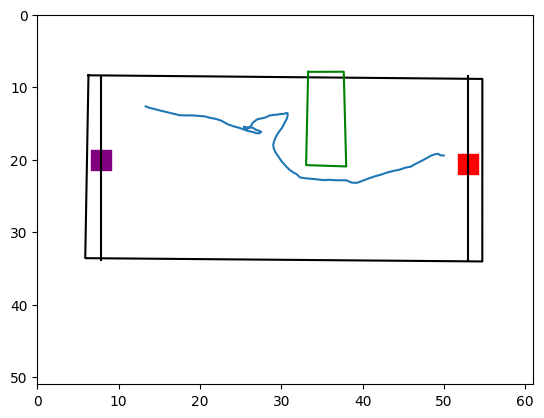

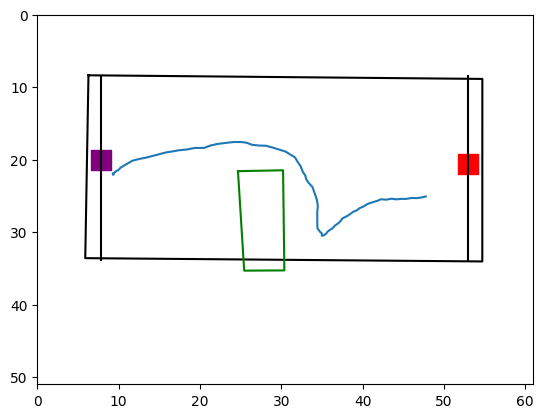

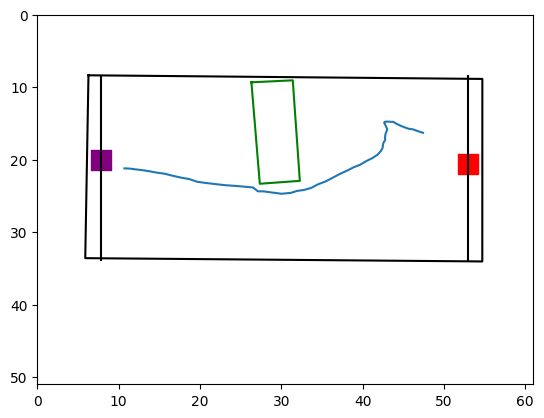

In [442]:
short = conditions_long#.sample(300)
long = light_long#.sample(300)
data = pd.concat([long])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[0]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.round(first)
for ind,row in data.iterrows():

   if(row.zero_out_angle_to_corner_prime>=80) and(row.zero_out_angle_to_corner_prime<=120):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '3rd'

   
   if(row.zero_out_angle_to_corner_prime>=40) and(row.zero_out_angle_to_corner_prime<=80):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '2nd'
      
   

   if (row.zero_out_angle_to_corner_prime<=40):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '1st'

df = data.loc[data.zero_out_angle_to_corner_prime_sec == '2nd'].sample(5)

for ind,row in df.iterrows():
    fig, ax= plt.subplots()

    plot_arena(row,ax)

    ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

(array([ 13.,   9.,  34.,  86., 164., 278., 203.,  58.,  21.,   3.]),
 array([  0. ,  10.7,  21.4,  32.1,  42.8,  53.5,  64.2,  74.9,  85.6,
         96.3, 107. ]),
 <BarContainer object of 10 artists>)

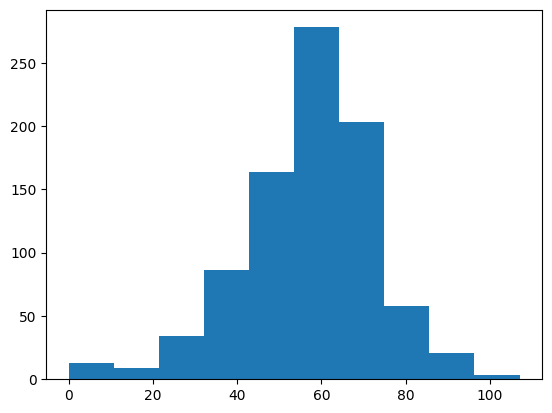

In [440]:
plt.hist(data.zero_out_angle_to_corner_prime)

<AxesSubplot: xlabel='zero_out_angle_to_corner_prime', ylabel='Density'>

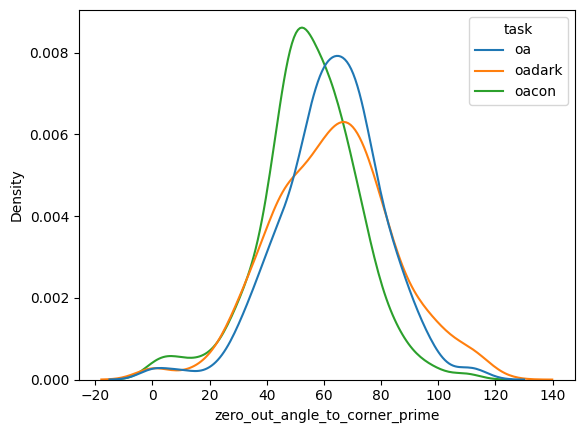

In [402]:


data = pd.concat([light_short.sample(300),dark_short.sample(300),dark_long.sample(300),light_long.sample(300),conditions_short.sample(300),conditions_long.sample(300)])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[0]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.round(first)
for ind,row in data.iterrows():

   if(row.zero_out_angle_to_corner_prime>=80) and(row.zero_out_angle_to_corner_prime<=120):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '3rd'

   
   if(row.zero_out_angle_to_corner_prime>=40) and(row.zero_out_angle_to_corner_prime<=80):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '2nd'
      
   

   if (row.zero_out_angle_to_corner_prime<=40):
      data.at[ind,'zero_out_angle_to_corner_prime_sec'] = '1st'






#data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue =data.task, x=data.zero_out_angle_to_corner_prime, data=data,ax = ax,common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

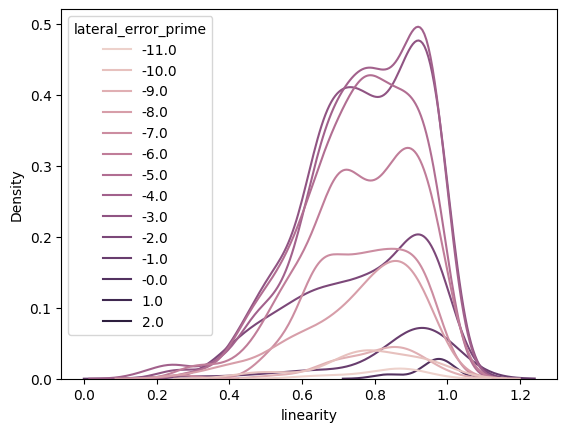

In [336]:
data = pd.concat([light_short,light_long])
for ind,row in data.iterrows():
    first = row.lateral_error[0]
    data.at[ind,'lateral_error_prime'] = np.round(first)
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue =data.lateral_error_prime, x=data.linearity, data=data,ax = ax,common_norm=True)



<AxesSubplot: xlabel='linearity', ylabel='Density'>

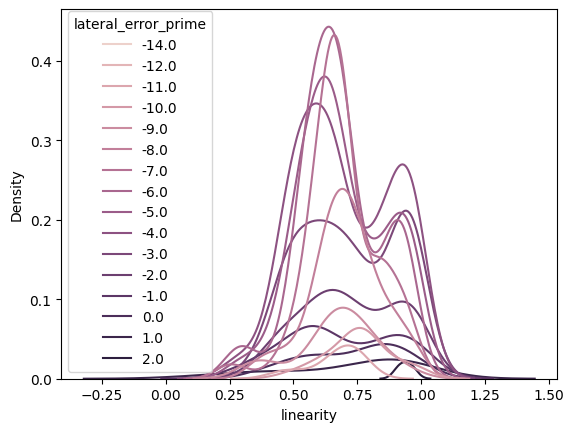

In [337]:
data = pd.concat([dark_short,dark_long])
for ind,row in data.iterrows():
    first = row.lateral_error[0]
    data.at[ind,'lateral_error_prime'] = np.round(first)
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue =data.lateral_error_prime, x=data.linearity, data=data,ax = ax,common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

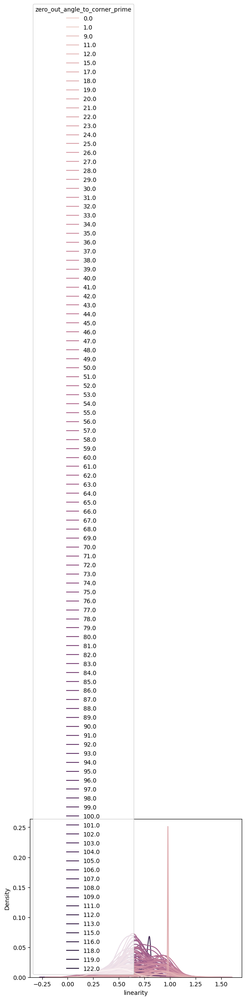

In [341]:
data = pd.concat([dark_short,dark_long])
data = drop_nans_in_columns(data,'zero_out_angle_to_corner')
for ind,row in data.iterrows():
    first = row.zero_out_angle_to_corner[0]
    data.at[ind,'zero_out_angle_to_corner_prime'] = np.round(first)
#data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue =data.zero_out_angle_to_corner_prime, x=data.linearity, data=data,ax = ax,common_norm=True)

<AxesSubplot: xlabel='lateral_error_prime', ylabel='Density'>

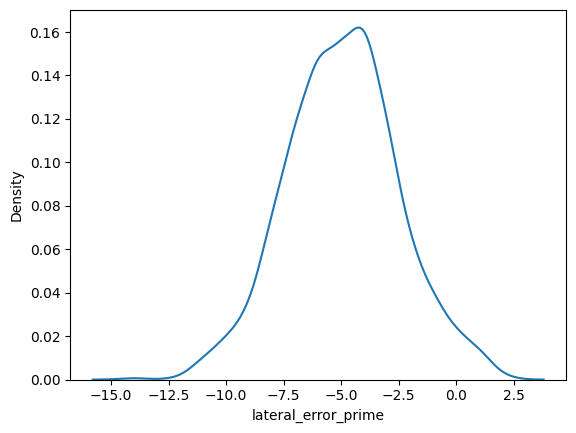

In [320]:
fig,ax = plt.subplots()
sns.kdeplot( x=data.lateral_error_prime, data=data,ax = ax,common_norm=True)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

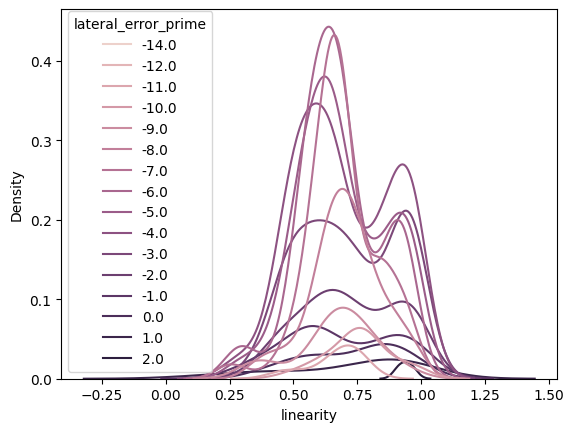

In [318]:
for ind,row in data.iterrows():
    first = row.lateral_error[0]
    data.at[ind,'lateral_error_prime'] = np.round(first)
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue =data.lateral_error_prime, x=data.linearity, data=data,ax = ax,common_norm=True)


In [323]:
data

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance,lateral_error_prime
48,53,61,65085.443225,65087.872499,"[65085.45358, 65085.470208, 65085.486912, 6508...","[10732, 10733, 10734, 10735, 10736, 10737, 107...","[100.44862365722656, 100.18721008300781, 100.2...","[263.18914794921875, 262.5392761230469, 262.47...","[105.83159637451172, 105.43478393554688, 105.2...","[263.4307861328125, 262.8650817871094, 262.953...",...,"[46.23566741812295, 43.97637298404902, 42.3604...","[26.94768257713439, 22.87837387425938, 19.8909...",1.033557,0.967532,"[-4.757137408583954, -4.805071369296208, -4.74...",2.0,"[55.48559656510694, 41.84213031341197, 49.4133...","[0.9571344284972749, 0.8081942811463367, 0.981...",66.809456,-5.0
107,116,131,65261.852249,65264.596928,"[65261.864281, 65261.881049, 65261.897587, 652...","[21313, 21314, 21315, 21316, 21317, 21318, 213...","[96.1509780883789, 96.15278625488281, 96.02030...","[263.8703308105469, 263.6289367675781, 263.647...","[107.484130859375, 106.96112060546875, 107.557...","[258.8878479003906, 258.91717529296875, 258.92...",...,"[63.42788133068735, 59.57040168225678, 55.9039...","[41.57281750941381, 36.27167569186149, 30.9489...",1.187407,0.842171,"[-5.340438028253152, -5.268388308926408, -5.10...",2.0,"[47.38737088995057, 52.221790294642396, 39.521...","[0.8072970513430189, 1.0192313953678855, 0.736...",58.130387,-5.0
109,118,133,65266.894937,65269.852416,"[65266.899443, 65266.916096, 65266.933081, 652...","[21615, 21616, 21617, 21618, 21619, 21620, 216...","[101.12310028076172, 100.97048950195312, 100.9...","[262.6263122558594, 262.3880310058594, 262.056...","[106.26722717285156, 105.9880142211914, 105.80...","[259.74310302734375, 260.3791198730469, 260.22...",...,"[56.333010694082944, 56.63219781458785, 56.472...","[34.67249559942331, 32.80550960646575, 30.5604...",2.108087,0.474364,"[-4.917446623007631, -5.071260540891206, -5.13...",2.0,"[41.659760567958244, 43.90307171658748, 35.762...","[0.8597992456282046, 0.7562632585656814, 0.617...",73.170299,-5.0
186,44,48,64481.437721,64484.485260,"[64481.450598, 64481.467315, 64481.485184, 644...","[10028, 10029, 10030, 10031, 10032, 10033, 100...","[96.28366088867188, 97.87781524658203, 98.2851...","[262.6758728027344, 262.9620056152344, 263.531...","[101.03731536865234, 102.56742095947266, 102.5...","[265.4603576660156, 265.66888427734375, 265.68...",...,"[64.98290606431992, 69.03989140572298, 71.8157...","[38.94632339132805, 40.396156359605214, 40.336...",1.924412,0.519639,"[-5.001817313060368, -5.343045744150739, -5.61...",1.0,"[34.30294841218188, 37.23210115223048, 35.5727...","[0.8009862442032762, 0.8286121100010426, 0.849...",60.497632,-5.0
192,50,54,64497.232998,64499.789337,"[64497.239372, 64497.256384, 64497.272793, 644...","[10975, 10976, 10977, 10978, 10979, 10980, 109...","[97.76671600341797, 98.06646728515625, 97.5718...","[262.6829528808594, 262.3271484375, 262.333526...","[102.59829711914062, 102.36193084716797, 101.9...","[266.091796875, 265.6123352050781, 265.8196716...",...,"[61.11454516134465, 61.37651710637559, 63.4880...","[35.80600755840207, 34.08711577669252, 33.9527...",1.614997,0.619196,"[-4.674155408619242, -4.808691110545851, -5.02...",2.0,"[30.55197049901126, 28.401766150748347, 29.568...","[0.6163002135056743, 0.6375399377350011, 0.638...",63.245563,-5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2527,27,28,57444.224844,57446.879705,"[57444.235545, 57444.252249, 57444.268454, 574...","[4561, 4562, 4563, 4564, 4565, 4566, 4567, 456...","[91.49844360351562, 91.23975372314453, 91.4540...","[261.6283874511719, 261.51141357421875, 261.35...","[97.66658020019531, 97.12712097167969, 96.7329...","[267.17803955078125, 266.57696533203125, 266.1...",...,"[46.67022123665367, 44.80531725041268, 42.4493...

<AxesSubplot: xlabel='linearity', ylabel='Density'>

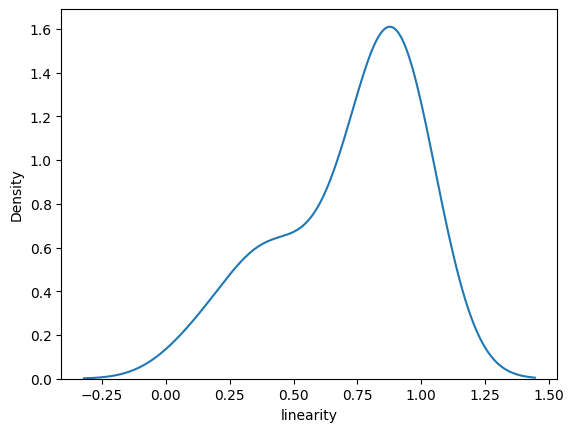

In [330]:
data = pd.concat([dark_short,dark_long])
for ind,row in data.iterrows():
    first = row.lateral_error[0]
    data.at[ind,'lateral_error_prime'] = np.round(first)
data = data[data.lateral_error_prime == 1.0]
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot( x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

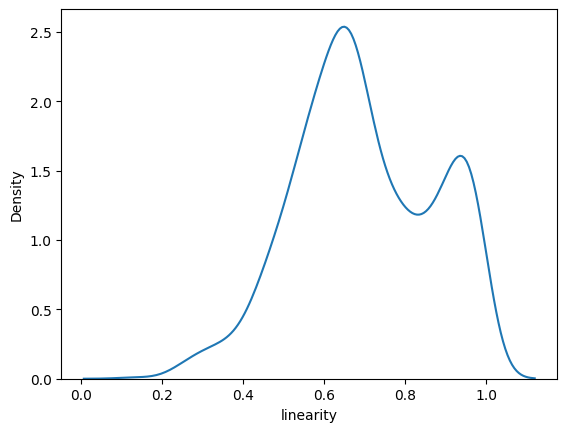

In [306]:
data = pd.concat([dark_short,dark_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot( x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

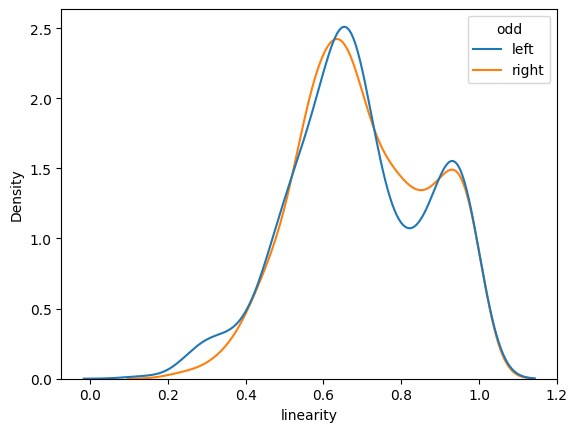

In [156]:
data = pd.concat([dark_short,dark_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.odd, x=data.linearity, data=data,ax = ax,common_norm=False)

In [158]:
greater = data[data.linearity>.8]
less = data[data.linearity<.8]

In [177]:
greater

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance
48,53,61,65085.443225,65087.872499,"[65085.45358, 65085.470208, 65085.486912, 6508...","[10732, 10733, 10734, 10735, 10736, 10737, 107...","[100.44862365722656, 100.18721008300781, 100.2...","[263.18914794921875, 262.5392761230469, 262.47...","[105.83159637451172, 105.43478393554688, 105.2...","[263.4307861328125, 262.8650817871094, 262.953...",...,"[26.94768257713439, 22.87837387425938, 19.8909...","[46.23566741812295, 43.97637298404902, 42.3604...","[26.94768257713439, 22.87837387425938, 19.8909...",1.033557,0.967532,"[-4.757137408583954, -4.805071369296208, -4.74...",2.0,"[55.48559656510694, 41.84213031341197, 49.4133...","[0.9571344284972749, 0.8081942811463367, 0.981...",66.809456
103,112,127,65252.934464,65254.802496,"[65252.944665, 65252.961369, 65252.978764, 652...","[20778, 20779, 20780, 20781, 20782, 20783, 207...","[97.96551513671875, 97.5322036743164, 97.74184...","[258.85760498046875, 257.51556396484375, 257.3...","[104.56432342529297, 103.60718536376953, 103.3...","[271.4945068359375, 270.5657653808594, 269.491...",...,"[4.817930553044818, 0.8382333513948196, 3.7028...","[15.433032765348086, 9.206434256062249, 6.2595...","[4.817930553044818, 0.8382333513948196, 3.7028...",1.118800,0.893815,"[-2.0033343561251655, -1.7004628643725574, -1....",1.0,"[42.64028542412101, 38.74875932874584, 34.3318...","[0.9493694574802412, 0.783380803802963, 0.6844...",46.714729
107,116,131,65261.852249,65264.596928,"[65261.864281, 65261.881049, 65261.897587, 652...","[21313, 21314, 21315, 21316, 21317, 21318, 213...","[96.1509780883789, 96.15278625488281, 96.02030...","[263.8703308105469, 263.6289367675781, 263.647...","[107.484130859375, 106.96112060546875, 107.557...","[258.8878479003906, 258.91717529296875, 258.92...",...,"[41.57281750941381, 36.27167569186149, 30.9489...","[63.42788133068735, 59.57040168225678, 55.9039...","[41.57281750941381, 36.27167569186149, 30.9489...",1.187407,0.842171,"[-5.340438028253152, -5.268388308926408, -5.10...",2.0,"[47.38737088995057, 52.221790294642396, 39.521...","[0.8072970513430189, 1.0192313953678855, 0.736...",58.130387
110,119,135,65273.387571,65275.161344,"[65273.402355, 65273.418534, 65273.435238, 652...","[22005, 22006, 22007, 22008, 22009, 22010, 220...","[98.66307830810547, 98.78356170654297, 98.8776...","[256.715087890625, 256.3787536621094, 256.3924...","[104.29141998291016, 104.26492309570312, 104.5...","[269.0223083496094, 268.5887756347656, 268.490...",...,"[3.691767350398037, 0.6578576976924858, 4.5405...","[14.948722632521205, 10.48756451576944, 5.9439...","[3.691767350398037, 0.6578576976924858, 4.5405...",1.007850,0.992211,"[-2.1552997161051017, -1.9434440364467278, -1....",1.0,"[41.487463275180254, 41.79573525906752, 46.468...","[0.8666726871583297, 0.9397108413509923, 1.006...",53.348209
380,5,8,66149.947545,66152.675648,"[66149.949798, 66149.967424, 66149.983296, 661...","[2201, 2202, 2203, 2204, 2205, 2206, 2207, 220...","[99.68675231933594, 99.2745590209961, 99.03671...","[253.08267211914062, 253.24745178222656, 253.3...","[104.3629379272461, 104.15335083007812, 104.28...","[261.5686950683594, 261.2632141113281, 261.351...",...,"[8.56127297994683, 4.554848939252845, 0.843132...","[22.903534365426797, 18.80156744513599, 14.639...","[8.56127297994683, 4.554848939252845, 0.843132...",1.038341,0.963075,"[-2.9172235918828484, -2.731990950795261, -2.4...",1.0,"[27.3382070960302, 29.015142734271603, 24.4861...","[0.601857396824057, 0.6696367218183124, 0.5890...",58.361480
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2617,50,52,55048.479552,55051.342246,"[55048.48384, 55048.500224, 55048.516889, 5504...","[8299, 8300, 8301, 8302, 8303, 8304, 8305, 830...","[80.19078826904297, 80.67

In [182]:
df

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance
155,8,9,64375.776512,64378.17294,"[64375.781017, 64375.797696, 64375.814374, 643...","[[3690, 3691, 3692, 3693, 3694, 3695, 3696, 36...","[675.8781127929688, 676.2967529296875, 676.733...","[275.0614929199219, 275.76239013671875, 277.34...","[665.19287109375, 665.4569091796875, 666.26269...","[262.6256408691406, 266.82958984375, 268.40533...",...,"[50.790168193127776, 48.14402304643501, 44.102...","[62.80901443397505, 60.138734269103445, 56.048...","[50.790168193127776, 48.14402304643501, 44.102...",1.033163,0.967901,"[-5.934040637123937, -5.720761488252739, -5.46...",2.0,"[24.83017868357563, 27.741044852926013, 33.286...","[0.5537155709573618, 0.6398374466135994, 0.694...",53.441292


155    0.967901
Name: linearity, dtype: float64


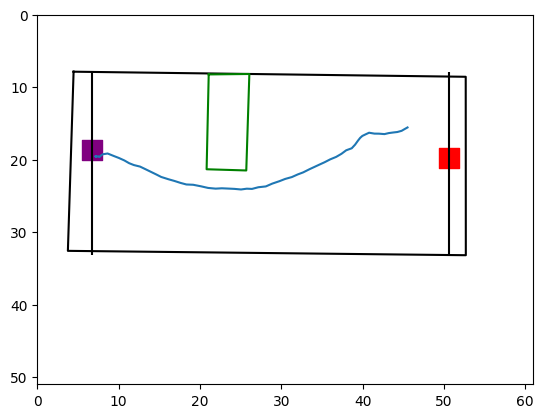

In [200]:
df = greater.loc[[155]]
print(df.linearity)
for ind,row in df.iterrows():
    fig, ax= plt.subplots()

    plot_arena(row,ax)

    ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

153    0.968484
Name: linearity, dtype: float64


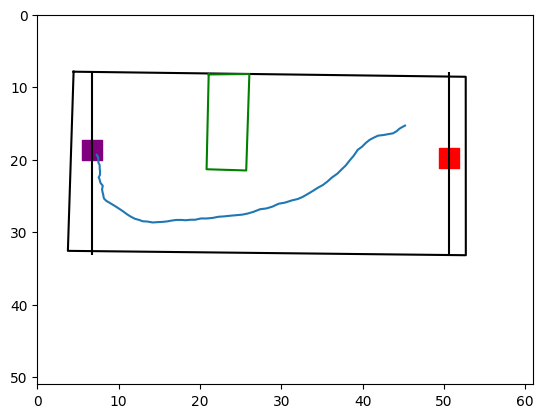

In [201]:
df = greater.loc[[153]]
print(df.linearity)
for ind,row in df.iterrows():
    fig, ax= plt.subplots()

    plot_arena(row,ax)

    ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

In [301]:
data

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance
46,51,59,65080.486720,65083.223001,"[65080.502579, 65080.518617, 65080.535206, 650...","[10435, 10436, 10437, 10438, 10439, 10440, 104...","[99.16756439208984, 99.78731536865234, 99.5765...","[263.4202880859375, 263.32611083984375, 263.59...","[103.6441421508789, 104.4577407836914, 104.408...","[263.2048034667969, 263.20684814453125, 263.25...",...,"[44.12509042093076, 44.26640394860243, 45.9047...","[67.8853199325869, 69.8043073673379, 73.430464...","[44.12509042093076, 44.26640394860243, 45.9047...",3.469794,0.288202,"[-6.3759791661391905, -6.6864446194164575, -7....",1.0,"[33.879388258260654, 37.15088088322363, 26.593...","[0.8006333814568709, 0.86136797270491, 0.61225...",84.674163
48,53,61,65085.443225,65087.872499,"[65085.45358, 65085.470208, 65085.486912, 6508...","[10732, 10733, 10734, 10735, 10736, 10737, 107...","[100.44862365722656, 100.18721008300781, 100.2...","[263.18914794921875, 262.5392761230469, 262.47...","[105.83159637451172, 105.43478393554688, 105.2...","[263.4307861328125, 262.8650817871094, 262.953...",...,"[26.94768257713439, 22.87837387425938, 19.8909...","[46.23566741812295, 43.97637298404902, 42.3604...","[26.94768257713439, 22.87837387425938, 19.8909...",1.033557,0.967532,"[-4.757137408583954, -4.805071369296208, -4.74...",2.0,"[55.48559656510694, 41.84213031341197, 49.4133...","[0.9571344284972749, 0.8081942811463367, 0.981...",66.809456
52,57,65,65094.750310,65097.199846,"[65094.756684, 65094.773452, 65094.791091, 650...","[11290, 11291, 11292, 11293, 11294, 11295, 112...","[99.86213684082031, 99.8385238647461, 100.1777...","[263.3524169921875, 263.0785827636719, 263.358...","[105.79570770263672, 105.65219116210938, 105.2...","[259.5387878417969, 259.83782958984375, 259.70...",...,"[38.38241240438103, 35.22056872826166, 33.1460...","[61.510135271106556, 60.601282975463604, 60.62...","[38.38241240438103, 35.22056872826166, 33.1460...",3.453282,0.289580,"[-6.013040861347143, -6.1618852433823506, -6.2...",2.0,"[57.06233040627596, 43.59759983120965, 37.6507...","[1.0140384071161517, 0.8458870533919907, 0.772...",89.289911
103,112,127,65252.934464,65254.802496,"[65252.944665, 65252.961369, 65252.978764, 652...","[20778, 20779, 20780, 20781, 20782, 20783, 207...","[97.96551513671875, 97.5322036743164, 97.74184...","[258.85760498046875, 257.51556396484375, 257.3...","[104.56432342529297, 103.60718536376953, 103.3...","[271.4945068359375, 270.5657653808594, 269.491...",...,"[4.817930553044818, 0.8382333513948196, 3.7028...","[15.433032765348086, 9.206434256062249, 6.2595...","[4.817930553044818, 0.8382333513948196, 3.7028...",1.118800,0.893815,"[-2.0033343561251655, -1.7004628643725574, -1....",1.0,"[42.64028542412101, 38.74875932874584, 34.3318...","[0.9493694574802412, 0.783380803802963, 0.6844...",46.714729
107,116,131,65261.852249,65264.596928,"[65261.864281, 65261.881049, 65261.897587, 652...","[21313, 21314, 21315, 21316, 21317, 21318, 213...","[96.1509780883789, 96.15278625488281, 96.02030...","[263.8703308105469, 263.6289367675781, 263.647...","[107.484130859375, 106.96112060546875, 107.557...","[258.8878479003906, 258.91717529296875, 258.92...",...,"[41.57281750941381, 36.27167569186149, 30.9489...","[63.42788133068735, 59.57040168225678, 55.9039...","[41.57281750941381, 36.27167569186149, 30.9489...",1.187407,0.842171,"[-5.340438028253152, -5.268388308926408, -5.10...",2.0,"[47.38737088995057, 52.221790294642396, 39.521...","[0.8072970513430189, 1.0192313953678855, 0.736...",58.130387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2783,52,59,58284.241510,58286.769433,"[58284.250803, 58284.267686, 58284.284518, 582...","[10663, 10664, 10665, 10666, 10667, 10668, 106...","[87.75959014892578, 86.9954

In [300]:
df

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance
2501,154,167,65253.008614,65255.250329,"[65253.014348, 65253.03127, 65253.048614, 6525...","[[25130, 25131, 25132, 25133, 25134, 25135, 25...","[675.061279296875, 675.4755249023438, 676.0808...","[259.4599304199219, 260.0480651855469, 260.442...","[667.2398071289062, 667.9432373046875, 668.691...","[246.2327423095703, 246.7583770751953, 247.214...",...,"[54.324835345822116, 53.35054484935635, 52.883...","[65.33282177847151, 64.80634118473705, 64.8319...","[54.324835345822116, 53.35054484935635, 52.883...",1.199813,0.833463,"[-6.964848058727396, -7.187470582707439, -7.45...",2.0,"[27.834793969176136, 29.02985447149797, 32.002...","[0.6373015140220346, 0.6646456768061171, 0.724...",56.494477


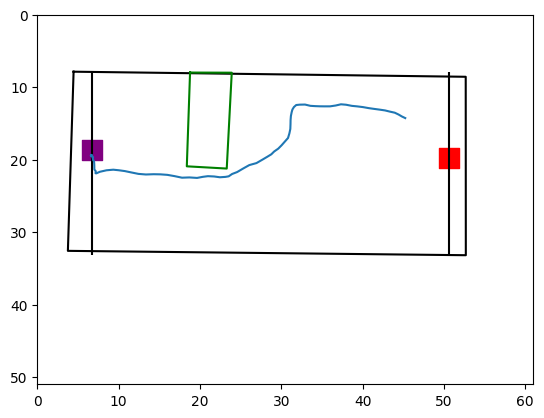

In [299]:
df = greater.sample(1)

for ind,row in df.iterrows():
    fig, ax= plt.subplots()

    plot_arena(row,ax)

    ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

In [194]:
df

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,angle_to_target_port,zero_out_angle_to_corner,zero_out_angle_to_target_port,tortuosity,linearity,lateral_error,consecutive,speed,distance,total_distance
153,6,7,64370.529152,64373.101606,"[64370.529331, 64370.546214, 64370.562534, 643...","[[3375, 3376, 3377, 3378, 3379, 3380, 3381, 33...","[676.2831420898438, 676.4638671875, 677.122985...","[274.9940185546875, 276.37493896484375, 277.12...","[666.485107421875, 665.1891479492188, 666.6427...","[262.389404296875, 267.18701171875, 268.091949...",...,"[50.735608327689064, 48.16374865528834, 44.727...","[63.267962084801, 60.699888065383256, 57.22295...","[50.735608327689064, 48.16374865528834, 44.727...",1.032542,0.968484,"[-6.1898029569919935, -5.9687448231311535, -5....",1.0,"[27.08419958606025, 24.168972161481843, 25.750...","[0.5953870791961968, 0.5645385560709482, 0.623...",61.248895


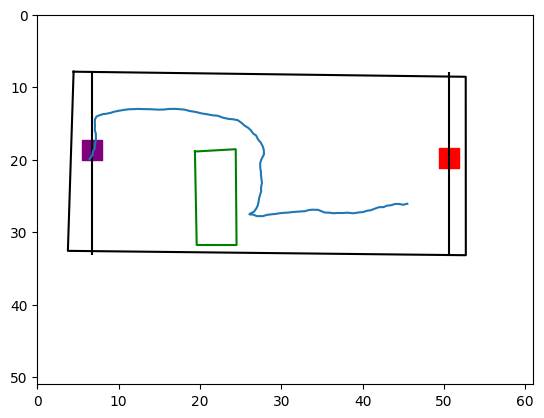

In [265]:
df = less.sample(1)

for ind,row in df.iterrows():
    fig, ax= plt.subplots()

    plot_arena(row,ax)

    ax.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                                [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
   





    ax.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'])

<AxesSubplot: xlabel='linearity', ylabel='Density'>

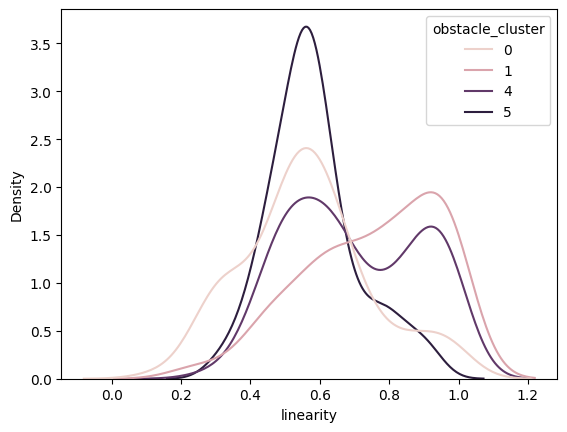

In [96]:
data = pd.concat([dark_short])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.obstacle_cluster, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

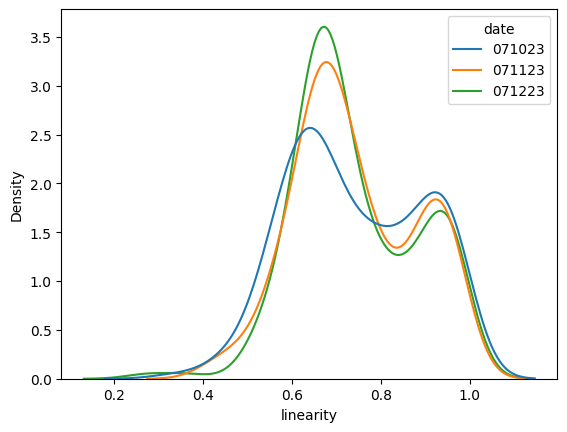

In [93]:
data = pd.concat([dark_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.date, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

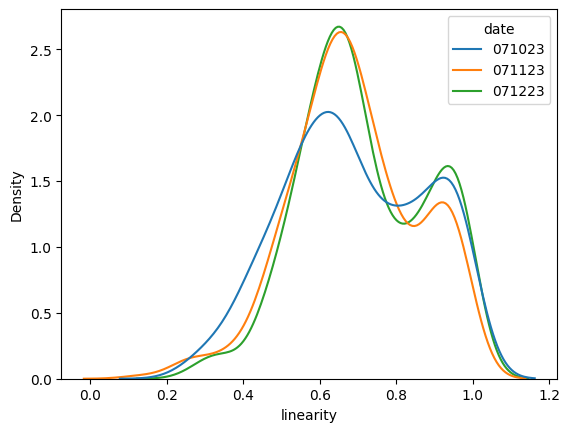

In [90]:
data = pd.concat([dark_short,dark_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.date, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

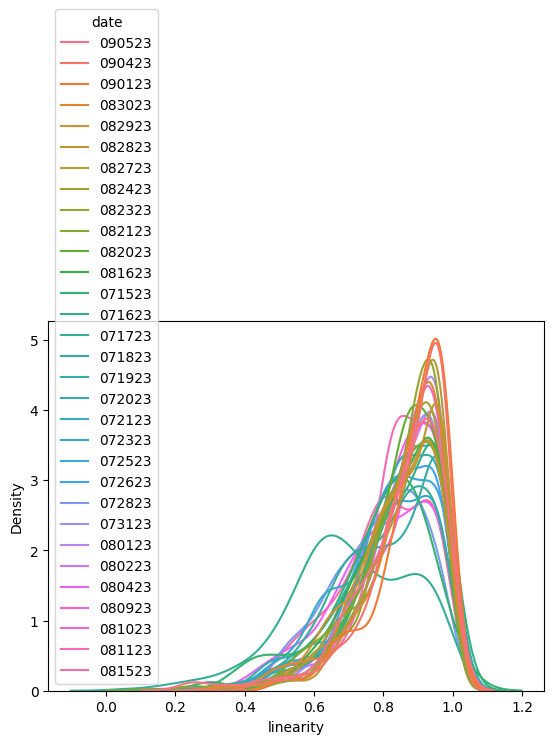

In [33]:
data = pd.concat([conditions_long,conditions_short])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.date, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

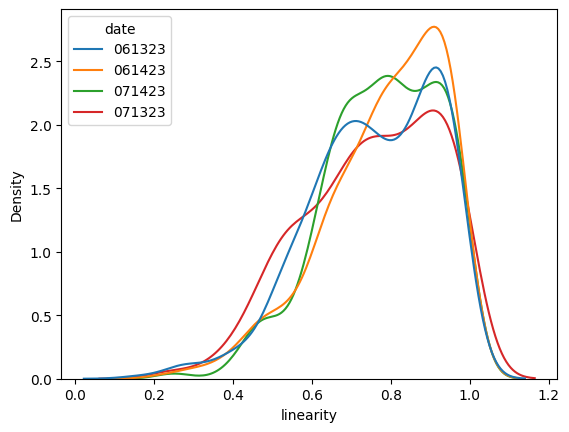

In [31]:
data = pd.concat([light_short,light_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.date, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

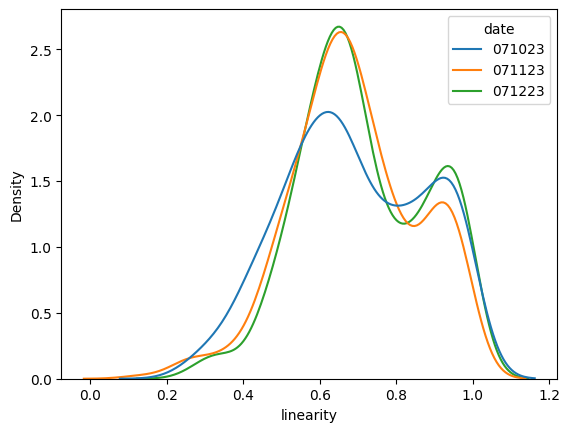

In [32]:
data = pd.concat([dark_short,dark_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.date, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

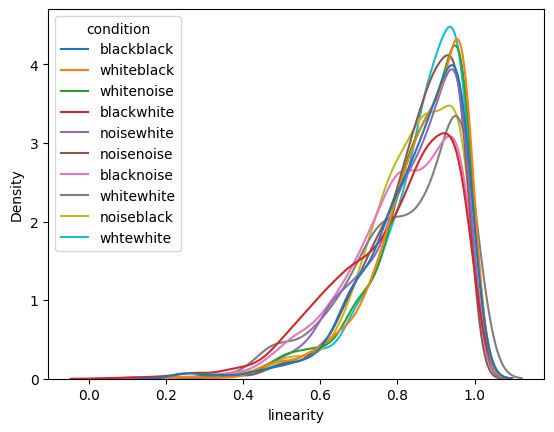

In [15]:
data = pd.concat([conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.condition, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

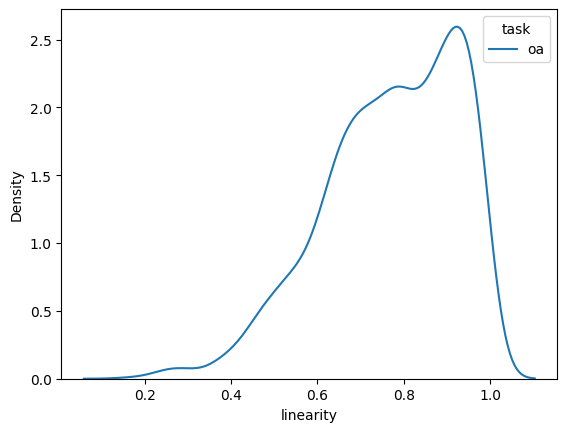

In [38]:
data = pd.concat([light_long,light_short])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

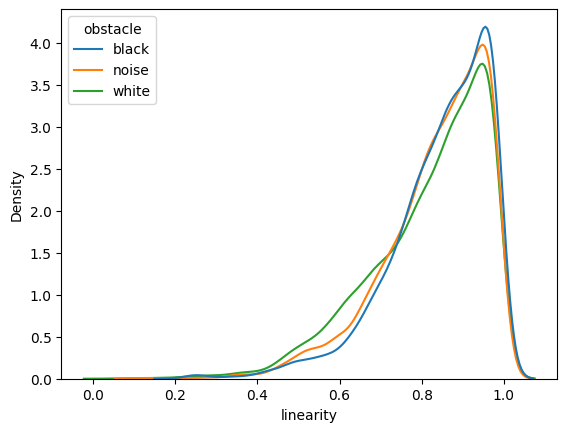

In [36]:
data = pd.concat([conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.obstacle, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

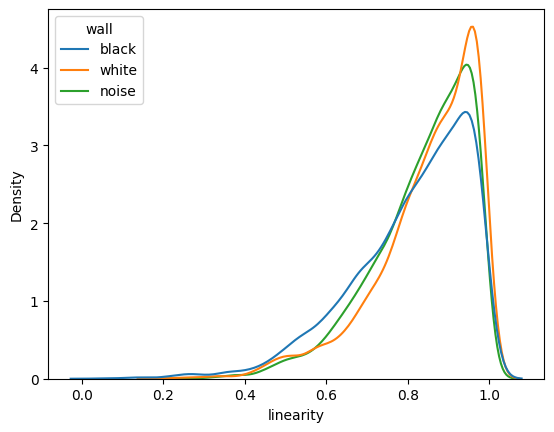

In [35]:
data = pd.concat([conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.wall, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

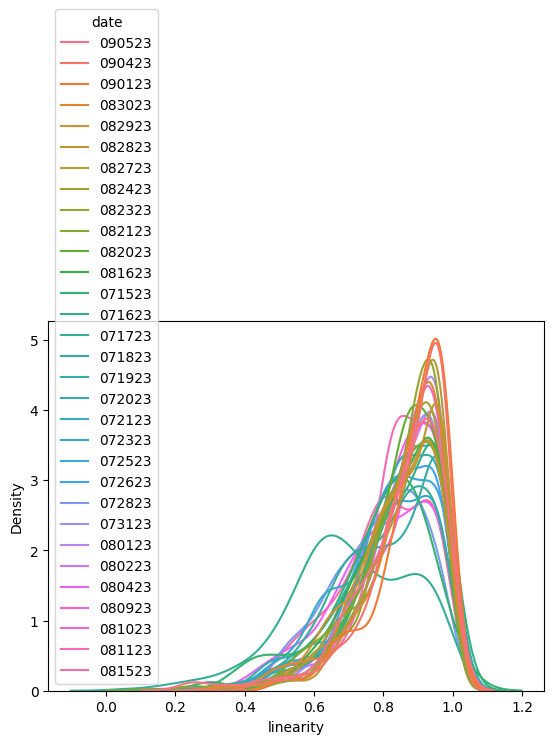

In [54]:
data = pd.concat([conditions_short,conditions_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.date, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='tortuosity', ylabel='Count'>

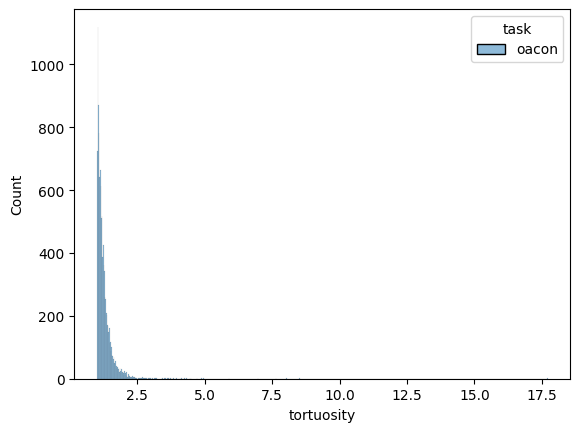

In [57]:
data = pd.concat([conditions_short,conditions_long])
fig,ax = plt.subplots()
sns.histplot(hue=data.task, x=data.tortuosity, data=data,ax = ax,common_norm=False)

In [63]:
data.tortuosity.max()

17.72208998087711

In [ ]:
data = pd.concat([light_short,dark_short,dark_long,light_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='linearity', ylabel='Density'>

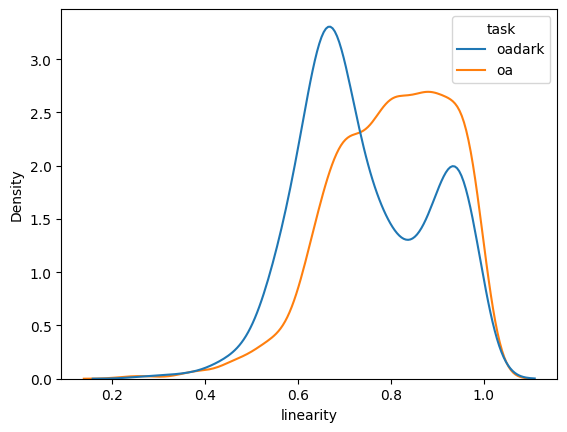

In [16]:
data = pd.concat([dark_long,light_long])
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.linearity, data=data,ax = ax,common_norm=False)

<AxesSubplot: xlabel='tortuosity', ylabel='Density'>

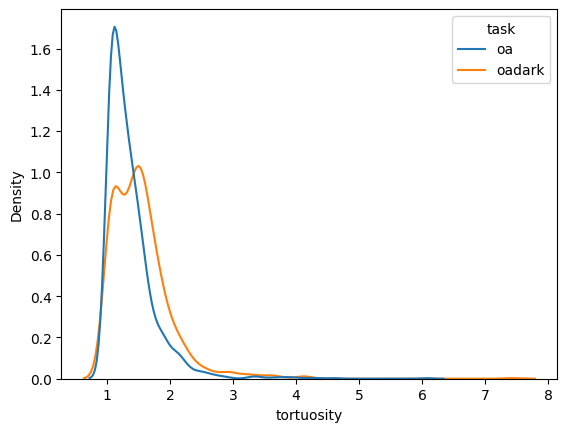

In [23]:
data = pd.concat([light_short,dark_short,dark_long,light_long])
data = drop_nans_in_columns(data,'tortuosity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.task, x=data.tortuosity, data=data,ax = ax,common_norm=False)

Text(0.5, 0.98, "['oa']")

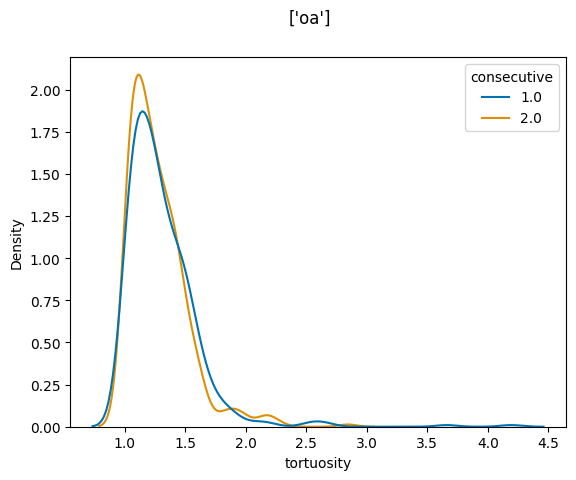

In [85]:
data = light_long
data = drop_nans_in_columns(data,'tortuosity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.consecutive, x=data.tortuosity, data=data,ax = ax,common_norm=False,palette="colorblind")
fig.suptitle(str(data.task.unique()))

Text(0.5, 0.98, "['oadark']")

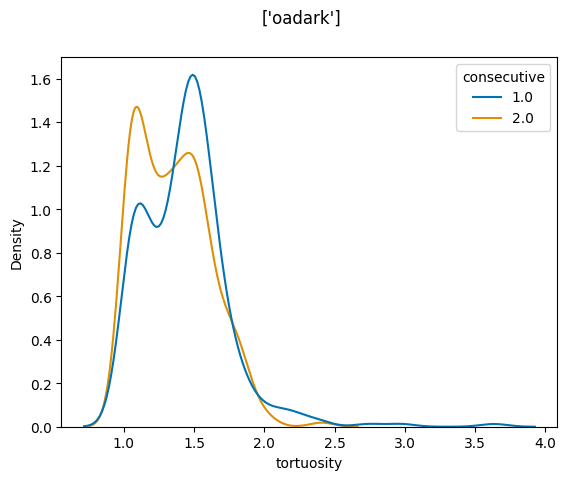

In [84]:
data = dark_long
data = drop_nans_in_columns(data,'tortuosity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.consecutive, x=data.tortuosity, data=data,ax = ax,common_norm=False,palette="colorblind")
fig.suptitle(str(data.task.unique()))

<AxesSubplot: xlabel='linearity', ylabel='Density'>

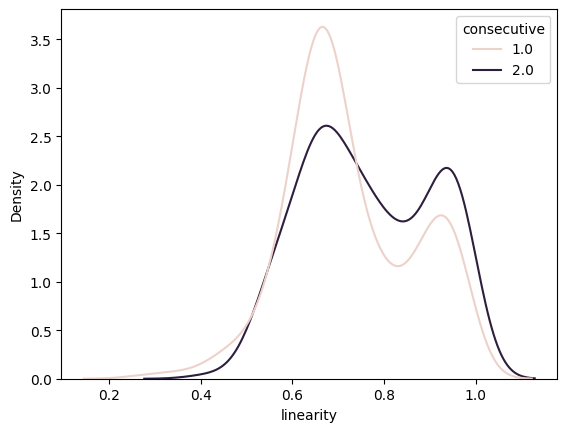

In [76]:
data = dark_long
data = drop_nans_in_columns(data,'linearity')
#data = data.loc[data['odd']=='l']
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.consecutive, x=data.linearity, data=data,ax = ax,common_norm=False)

In [99]:
con_long, con_short, con_middle = create_df_by_type(conditions_df)

In [106]:
drop_nans_in_columns(con_long,'tortuosity').tortuosity

1        1.063088
13       1.125695
30       1.281407
32       1.440085
51       1.308089
           ...   
31469    1.031369
31481    1.069802
31483    1.049390
31496    1.071158
31498    1.046620
Name: tortuosity, Length: 5601, dtype: float64

In [ ]:
reject_outliers

In [110]:
reject_outliers(drop_nans_in_columns(con_long,'tortuosity').tortuosity.to_numpy())[1]

array([[   0],
       [   1],
       [   2],
       ...,
       [4674],
       [4675],
       [4676]], dtype=int64)

In [109]:
data = con_long.loc[reject_outliers(drop_nans_in_columns(con_long,'tortuosity').tortuosity.to_numpy()).index]
#data = con_long
data = drop_nans_in_columns(data,'tortuosity')
#data = data.loc[(data['odd']=='left')]
fig,ax = plt.subplots()
sns.kdeplot(hue=data.wall, x=data.tortuosity, data=data,ax = ax,common_norm=True,palette="colorblind")
#fig.suptitle(str(data.task.unique()))

ValueError: Unable to coerce to Series, length must be 195: given 4677

In [58]:
dark_long.task

49      oadark
53      oadark
54      oadark
102     oadark
104     oadark
         ...  
2783    oadark
2786    oadark
2806    oadark
2808    oadark
2850    oadark
Name: task, Length: 577, dtype: object

In [53]:
dark_long.zero_out_angle_to_corner[2806    ]


array([62.91307746274097, 65.22112905066112, 65.20019051173898,
       64.6256653837238, 65.33002698882306, 66.4155678486005,
       69.28594004751737, 69.28325557406014, 68.81151926337887,
       67.56991527914802, 66.04654508540936, 66.23886500007401,
       65.54913604295255, 65.5951995955218, 66.90493271589817,
       67.33370501839056, 67.95907926481992, 67.86508640600015,
       67.36087248082535, 66.17785249492687, 67.09909392767258,
       67.02283807069257, 68.76609682888221, 70.57759664475718,
       73.029309233764, 76.41046288841925, 79.21139493490264,
       78.93426706882316, 77.43953284556599, 77.75097731783987,
       77.70457962359534, 78.77880482347034, 79.34013851480462,
       80.45575536665298, 81.64469569392635, 83.05105097059824,
       84.99287457349234, 87.19747928013284, 91.00629062316992,
       94.99167244665146, 99.67528233342522, 100.66497948274967,
       101.00155297972773, 101.33787152976984, 101.67384692850578,
       102.00939294565507, 102.3444253612

In [28]:
dark_long.time.mean()

2.6746100519930676

(array([ 31., 223., 193.,  68.,  37.,  15.,   3.,   3.,   2.,   2.]),
 array([ 53. ,  73.5,  94. , 114.5, 135. , 155.5, 176. , 196.5, 217. ,
        237.5, 258. ]),
 <BarContainer object of 10 artists>)

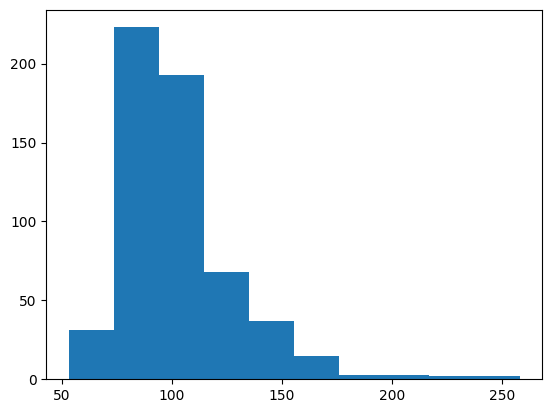

In [36]:
plt.hist(dark_long.len_distance_from_edge)

In [37]:
dark_long.len_distance_from_edge.mean()

102.4263431542461

In [108]:
def condition_by_start_obstalce_average(df,condition):
        #savepath = "D:/obstacle_avoidance/recordings"
        #savepath_session = os.path.join(*[savepath,'figures'])
        ##savepath_session = os.path.join(*[savepath,str(pd.unique(df.date).item()),str(pd.unique(df.animal).item()),str(pd.unique(df.task).item())])
        #pdf = PdfPages(os.path.join((savepath_session), str(date)+ 'by_' +'_start_'+'obstacle' + 'consecutive.pdf'))
        key='start'
        fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
        fig.suptitle('by ' + df[condition].unique() + ' '+ 'and ' +'obstacle ')
        spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)


        """Right"""
        panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
        ax1 = fig.add_subplot(panel_1[0,0])
        plot_arena(df,ax1)
        ax2 = fig.add_subplot(panel_1[0,1])
        plot_arena(df,ax2)
        ax2.set_title('right')
        ax3 = fig.add_subplot(panel_1[1,0])
        plot_arena(df,ax3)
        ax4 = fig.add_subplot(panel_1[1,1])
        plot_arena(df,ax4)
        ax5 = fig.add_subplot(panel_1[2,0])
        plot_arena(df,ax5)
        ax6 = fig.add_subplot(panel_1[2,1])
        plot_arena(df,ax6)

        right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]


        """Left """
        panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
        ax7 = fig.add_subplot(panel_2[0,0])
        plot_arena(df,ax7)
        ax8 = fig.add_subplot(panel_2[0,1])
        plot_arena(df,ax8)
        ax8.set_title('left')
        ax9 = fig.add_subplot(panel_2[1,0])
        plot_arena(df,ax9)
        ax10 = fig.add_subplot(panel_2[1,1])
        plot_arena(df,ax10)
        ax11= fig.add_subplot(panel_2[2,0])
        plot_arena(df,ax11)
        ax12 = fig.add_subplot(panel_2[2,1])
        plot_arena(df,ax12)

        left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]




        """ plot trials"""
        right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
        left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

        for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                #cluster_frame = cluster_frame.sample(num_sample)
                right_obstacle_axis = right_obstacle_dict.get(cluster)
                left_obstacle_axis = left_obstacle_dict.get(cluster)
                plot_obstacle(cluster_frame,right_obstacle_axis,cluster)
                plot_obstacle(cluster_frame,left_obstacle_axis,cluster)
                right_obstacle_axis.set_title(str(cluster))
                left_obstacle_axis.set_title(str(cluster))

                for start, start_frame in cluster_frame.groupby(['start']):

                    if direction == 'right':
                        if start == 'top':
                            if cluster in [2,3]:
                                right_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                                right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)

                            else:
                                right_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                                right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                        if start == 'bottom':
                            if cluster in [2,3]:
                                right_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                                right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)
                            else:
                                right_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                                right_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)


                    if direction == 'left':
                        if start == 'top':
                             if cluster in [2,3]:
                                left_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                                left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                             else:
                                left_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'black')
                                left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='black', alpha=0.5)
                        if start == 'bottom':
                            if cluster in [2,3]:
                                left_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                                left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_median_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame[condition+'_mad_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)

                            else:
                                left_obstacle_axis.plot(np.linspace(10,50,50),start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0],c = 'red')
                                left_obstacle_axis.fill_between(np.linspace(10,50,50), start_frame[condition + '_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)+start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), start_frame[condition+'_mean_interp_ts_nose_y_cm'].to_numpy()[0].astype(float)-start_frame['std_interp_ts_nose_y_cm'].to_numpy()[0].astype(float), facecolor='red', alpha=0.5)

        

In [76]:
df = pd.read_hdf(r'D:\obstacle_avoidance\recordings\020624\J675NN\training\testJ675NN_020624_training.h5')

In [78]:
from scipy.ndimage import gaussian_filter1d

In [81]:
row[key]

array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, na

In [80]:
interpolate_array(row[key])

ValueError: array of sample points is empty

In [79]:
keys = ['nose','leftear','rightear','spine','midspine','tailbase']
keys_list = list_columns(df,keys)
keys_list= [col for col in keys_list if 'likelihood' not in col]
keys_list= [col for col in keys_list if 'lind' not in col]
for ind, row in df.iterrows(): 
    """interpolate and smooth key points
        interpolate across nans 
        gausian smooth sigma 3 """
    for key in keys_list:
        interp_smooth = gaussian_filter1d(interpolate_array(row[key]),3)
        df.at[ind,key] = interp_smooth.astype(float)
    
    if row['odd'] == 'left':
        nose_list = row['nose_x_cm'] 
        odd_ind = np.argmax(nose_list>(df.leftportT_x_cm.unique()+5)) ## change cut off to be based of port position
        for key in keys_list:
            df.at[ind,'ts_' + key] = row[key][odd_ind:]
        #use odd_ind to index into obstacle 
        # iterate over columns list  
        #create gt_obstacle points
    else: 
        nose_list = row['nose_x_cm']
        even_ind = np.argmax(nose_list<(df.rightportT_x_cm.unique()-5))
        for key in keys_list:
            df.at[ind,'ts_' + key] = row[key][even_ind:]

ValueError: array of sample points is empty